18/07/2022

Combine all rebinning code.

In [1]:
machine = "/Users/Trevor1/"

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from astropy.io import fits
from os.path import exists

import sys
#sys.path.append("/Volumes/MyPassportforMac/HST/AllHSTCode/")
sys.path.append(machine+"Dropbox/HST/HSTCode/")
import Read_FOS_TVM
import Read_STIS_TVM
import Read_COS_TVM
#import HST_coadd
import HST_coadd2

In [5]:
def isNaN(string):
    return string != string

In [6]:
!ls /Users/trevormccaffrey/Dropbox/HST/

ls: /Users/trevormccaffrey/Dropbox/HST/: No such file or directory


In [7]:
!ls /Users/trevormccaffrey/Dropbox/HST/Sulentic_spectra/SulenticAllData

ls: /Users/trevormccaffrey/Dropbox/HST/Sulentic_spectra/SulenticAllData: No such file or directory


In [8]:
sul = pd.read_csv(machine+"Dropbox/HST/Sulentic_spectra/Sulentic2007Info_wpaths.csv")
sul

,IAU,Instrument,FOS_Name,S2N_group,STIS_Name,COS_Name,HST_Opt,Inst_final,S2N_coadd,z,...,PLATE,MJD,FIBERID,Separation,CIV_blue_FOS,CIV_EW_FOS,CIV_blue_STIS,CIV_EW_STIS,CIV_blue_COS,CIV_EW_COS
0,J02019-1132,FOS,3C057,1.0,None,None,NaN,FOS,99,0.6713,...,NaN,NaN,NaN,NaN,1231.167876,9.658282,NaN,NaN,NaN,NaN
1,J03514-1429,FOS,3C095,1.0,None,None,NaN,FOS,18,0.6160,...,NaN,NaN,NaN,NaN,128.443091,29.216849,NaN,NaN,NaN,NaN
2,J04172-0553,FOS,3C110,2.0,None,None,NaN,FOS,65,0.7744,...,NaN,NaN,NaN,NaN,-147.881870,19.989766,NaN,NaN,NaN,NaN
3,J08407+1312,FOS,3C207,1.0,None,None,NaN,FOS,24,0.6804,...,2426.0,53795.0,625.0,0.011913,-355.280481,68.755940,NaN,NaN,NaN,NaN
4,J09065+1646,FOS,3C215,1.0,None,None,NaN,FOS,21,0.4113,...,NaN,NaN,NaN,NaN,59.381212,51.682967,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125,J12524+5634,FOS,SBS1250+568,2.0,None,None,NaN,FOS,19,0.3200,...,1317.0,52765.0,20.0,0.039355,-147.881870,84.274324,NaN,NaN,NaN,NaN
126,J13012+5902,COS+FOS+STIS,SBS1259+593,3.0,None,None,NaN,FOS,25,0.4776,...,957.0,52398.0,20.0,0.017950,NaN,NaN,NaN,NaN,NaN,NaN
127,J17046+6044,FOS+STIS,SBS1704+608,3.0,SBS1704+608,None,NaN,FOS,22,0.3720,...,353.0,51703.0,377.0,0.099728,NaN,NaN,-701.286883,19.888960,NaN,NaN
128,J22426+2943,FOS+STIS,UGC12163,3.0,UGC12163,None,STIS,FOS,108,0.0245,...,NaN,NaN,NaN,NaN,NaN,NaN,266.508764,10.367982,NaN,NaN


In [7]:
sul[sul["Inst_final"].values=="COS"]

,IAU,Instrument,FOS_Name,S2N_group,STIS_Name,COS_Name,HST_Opt,Inst_final,S2N_coadd,z,...,PLATE,MJD,FIBERID,Separation,CIV_blue_FOS,CIV_EW_FOS,CIV_blue_STIS,CIV_EW_STIS,CIV_blue_COS,CIV_EW_COS
98,J22540-1734,COS,None,NaN,None,MR2251-178,NaN,COS,91,0.0638,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,542.446498,174.939299


In [8]:
z       = sul["z"].values
sdss    = ~isNaN(sul["SDSS_NAME"].values)
plate   = sul["PLATE"].values
mjd     = sul["MJD"].values
fiber   = sul["FIBERID"].values
id_fos  = sul["FOS_Name"].values
id_stis = sul["STIS_Name"].values
id_cos = sul["COS_Name"].values

In [9]:
FOS  = sul["FOS_Name"].values!="None"
STIS = sul["STIS_Name"].values!="None"
COS  = sul["COS_Name"].values!="None"
(FOS&sdss).sum(), (STIS&sdss).sum(), (COS&sdss).sum(), ((FOS|STIS|COS)&sdss).sum()

(52, 3, 0, 53)

In [10]:
ID = sul.iloc[id_fos=="3C336"]
ID

,IAU,Instrument,FOS_Name,S2N_group,STIS_Name,COS_Name,HST_Opt,Inst_final,S2N_coadd,z,...,PLATE,MJD,FIBERID,Separation,CIV_blue_FOS,CIV_EW_FOS,CIV_blue_STIS,CIV_EW_STIS,CIV_blue_COS,CIV_EW_COS
11,J16246+2345,FOS,3C336,2.0,None,None,NaN,FOS,35,0.9214,...,1574.0,53476.0,44.0,0.016566,-217.001833,88.419176,NaN,NaN,NaN,NaN


Added NGC5548 on 12/21/2021 to FOS since its STIS exposures were Echelle only.

In [11]:
ID["z"].values[0]

0.9214

In [12]:
fn_sdss = None if isNaN(ID["SDSS_NAME"].values[0]) else "%04d/spec-%04d-%05d-%04d.fits"%(ID["PLATE"].values[0],ID["PLATE"].values[0],ID["MJD"].values[0],ID["FIBERID"].values[0])

In [13]:
ID["FOS_Name"].values[0], fn_sdss, ID["z"].values[0]

('3C336', '1574/spec-1574-53476-0044.fits', 0.9214)

In [14]:
ID

,IAU,Instrument,FOS_Name,S2N_group,STIS_Name,COS_Name,HST_Opt,Inst_final,S2N_coadd,z,...,PLATE,MJD,FIBERID,Separation,CIV_blue_FOS,CIV_EW_FOS,CIV_blue_STIS,CIV_EW_STIS,CIV_blue_COS,CIV_EW_COS
11,J16246+2345,FOS,3C336,2.0,None,None,NaN,FOS,35,0.9214,...,1574.0,53476.0,44.0,0.016566,-217.001833,88.419176,NaN,NaN,NaN,NaN


In [15]:
!ls /Users/trevormccaffrey/Dropbox/HST/Sulentic_spectra/SulenticAllData

COS                                   Sulentic2007Info_wpaths.csv
FOS                                   Sulentic2007Info_wpaths.csv .csv
FinalPlots                            Sulentic2007Tables1_2.classicalRM.fit
OtherOpt                              Sulentic2007Tables1_2.fit
SDSS                                  notes_sulentic_tvm.txt
STIS                                  speclist_sdss_sulentic07.txt
Sulentic2007Info.csv                  sulentic_targets.ipynb
Sulentic2007Info.fit


In [16]:
id_fos

array(['3C057', '3C095', '3C110', '3C207', '3C215', '3C232', '3C254',
       '3C263', '3C273', '3C281', '3C334', '3C336', '3C345', '3C390',
       '3C454', 'Ark120', 'Fairall9', 'FBQSJ074541.6+314256',
       'HE0132-4313', 'HS0624+6907', 'IRAS04505-2958', 'J00392-5117',
       'J00449+1026', 'J00535+1241', 'J02171+1104', 'J04055-1308',
       'J04232-0120', 'J04412-4313', 'J04561-2159', 'J05198-4546',
       'J06357-7516', 'J08535+4349', 'J09270+3902', 'J10104+4132',
       'J10309+3102', 'J10525+6125', 'J11072+1628', 'J11391-1350',
       'J11586+6254', 'J11594+2106', 'J12047+2754', 'J12546+1141',
       'J13570+1919', 'J13590-4152', 'J14052+2555', 'J14190-1310',
       'J14275+2632', 'J14297+4747', 'J14467+4035', 'J14544-3747',
       'J15147+3650', 'J15395+4735', 'J15455+4846', 'J16142+2604',
       'J16279+5522', 'J16303+3756', 'J18219+6420', 'J19278+7358',
       'J21148+0607', 'J21315-1207', 'J21377-1432', 'J21435+1743',
       'J22032+3145', 'J22188-0335', 'J22463-1206', 'J2254

In [17]:
sdss, plate

(array([False, False, False,  True, False,  True,  True, False, False,
         True,  True,  True,  True, False, False, False, False,  True,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False,  True,  True,  True,  True,  True,
         True, False,  True,  True,  True,  True,  True, False, False,
        False,  True,  True,  True, False,  True,  True,  True,  True,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False,  True,  True,  True,
         True, False,  True,  True,  True, False, False, False, False,
        False, False, False,  True, False, False, False, False, False,
         True, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False,  True, False,  True,
         True,  True, False,  True,  True,  True,  True, False, False,
        False,  True, False,  True,  True,  True,  True,  True,  True,
      

In [18]:
ind = np.where(id_fos=="3C273")[0]

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:182: RuntimeWarning: divide by zero encountered in true_divide
  new_weights = 1 / (new_errs**2.)


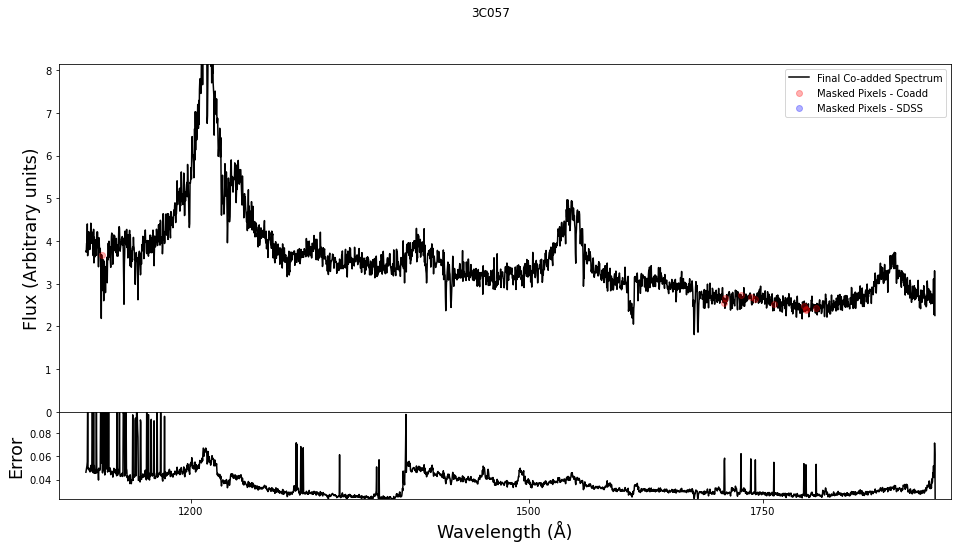

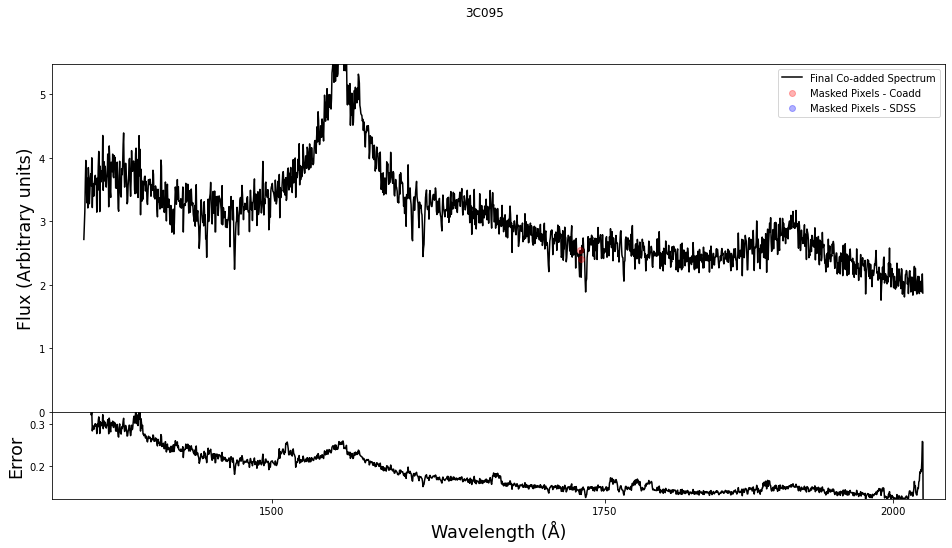

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


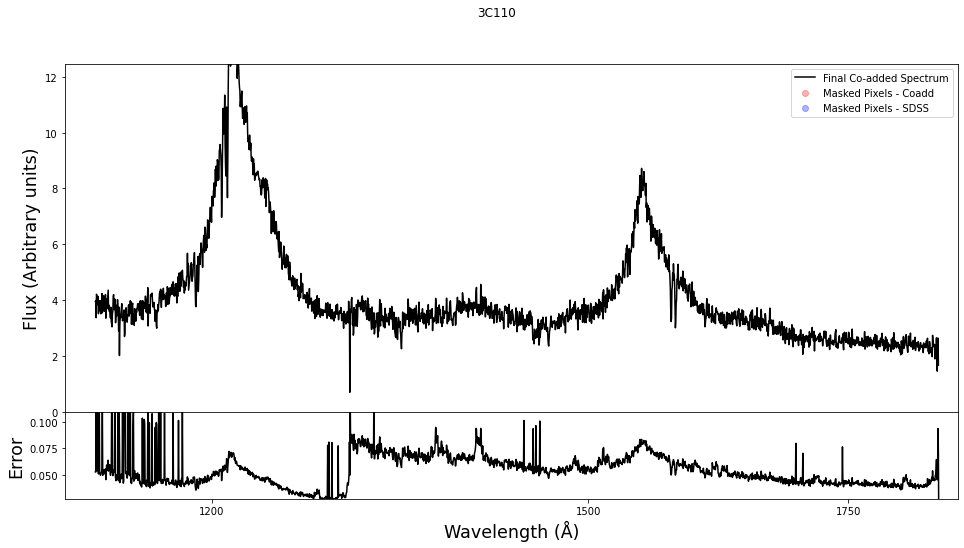

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


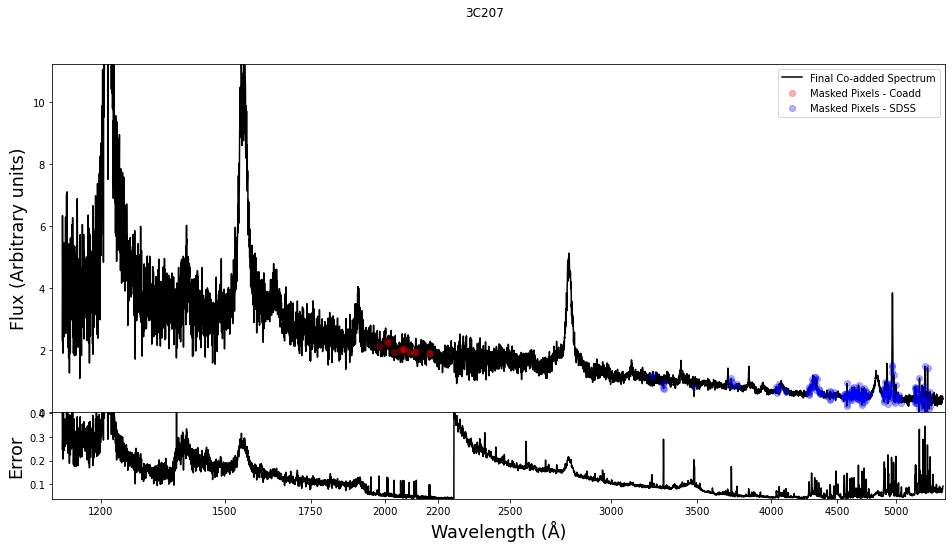

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


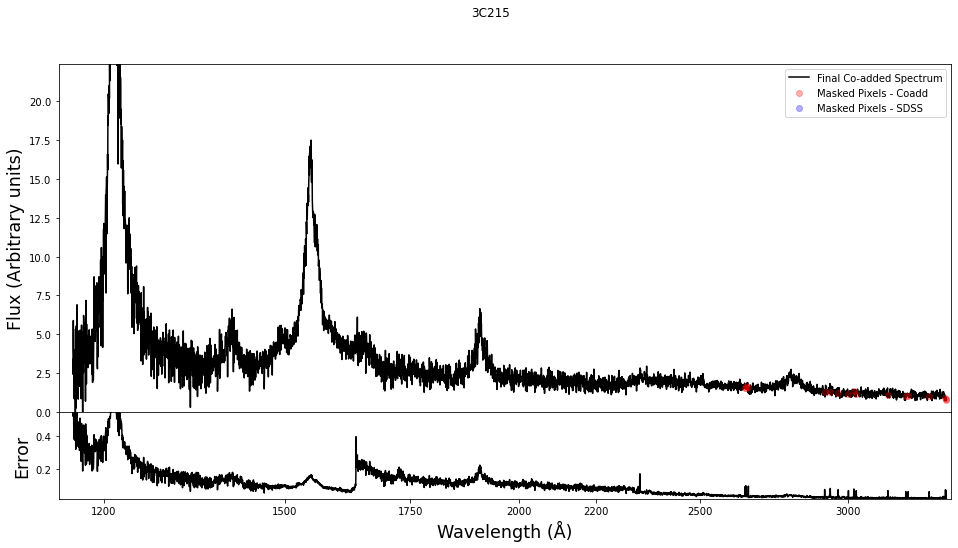

/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


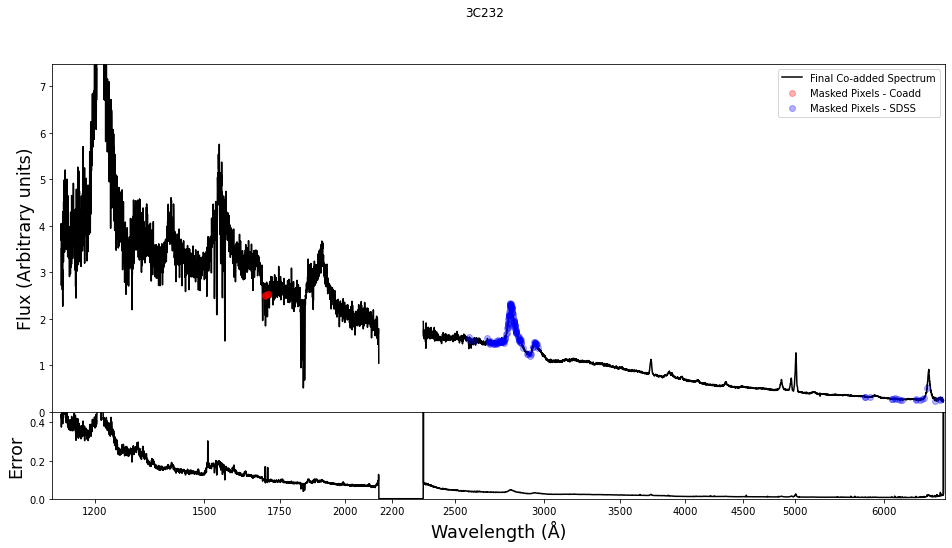

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


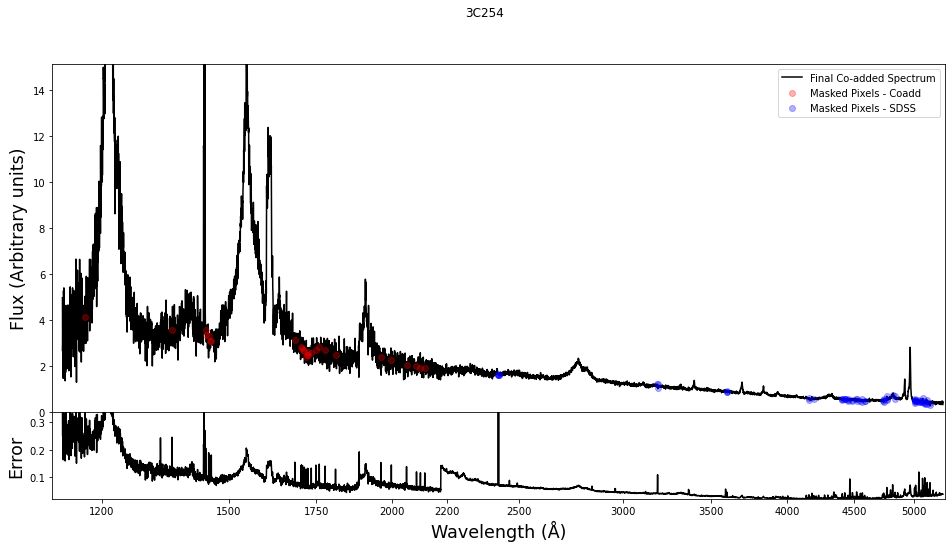

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


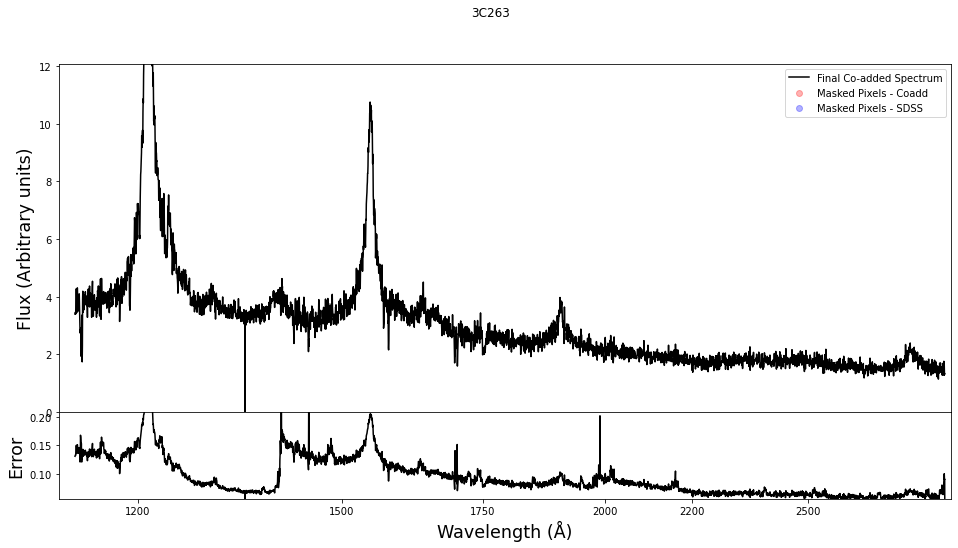

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/LowerResHSTRebin_TVM.py:103: RuntimeWarning: invalid value encountered in sqrt
  fluxerr_HST_rebin[i] = (m_err*wave_HST_rebin[i] + b_err) * np.sqrt(old_width/new_width)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


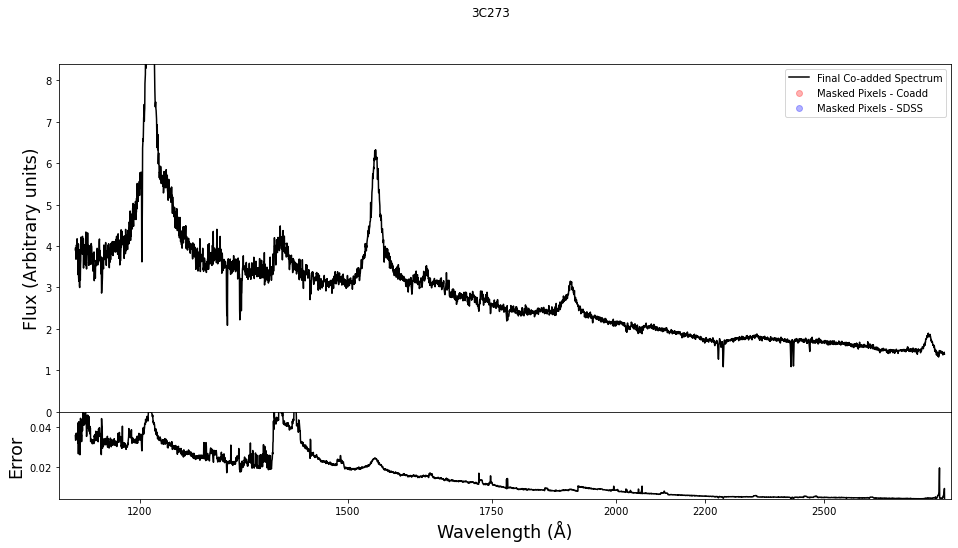

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


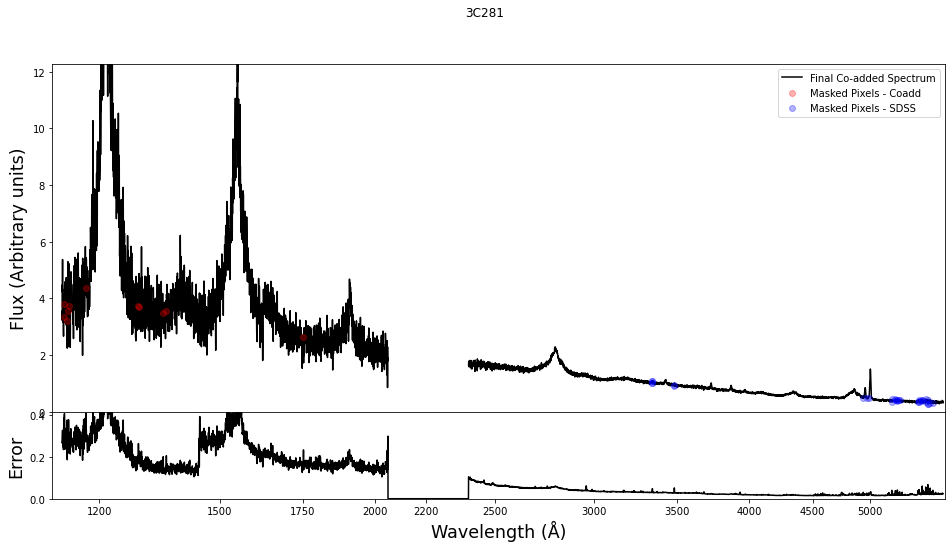

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


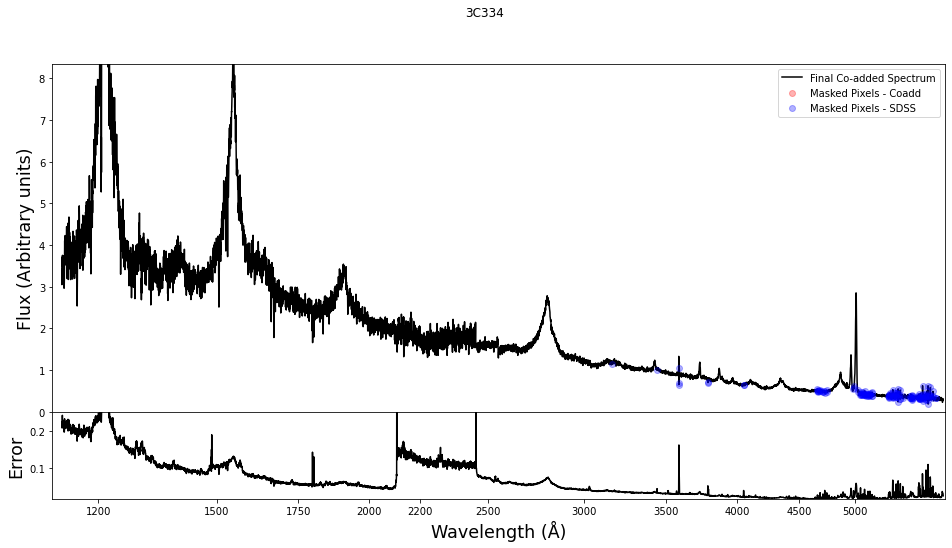

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


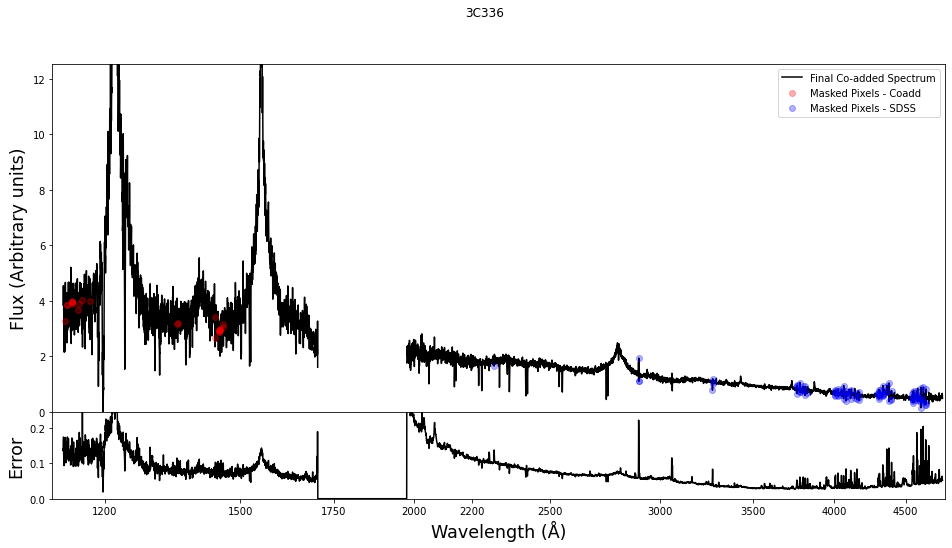

/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


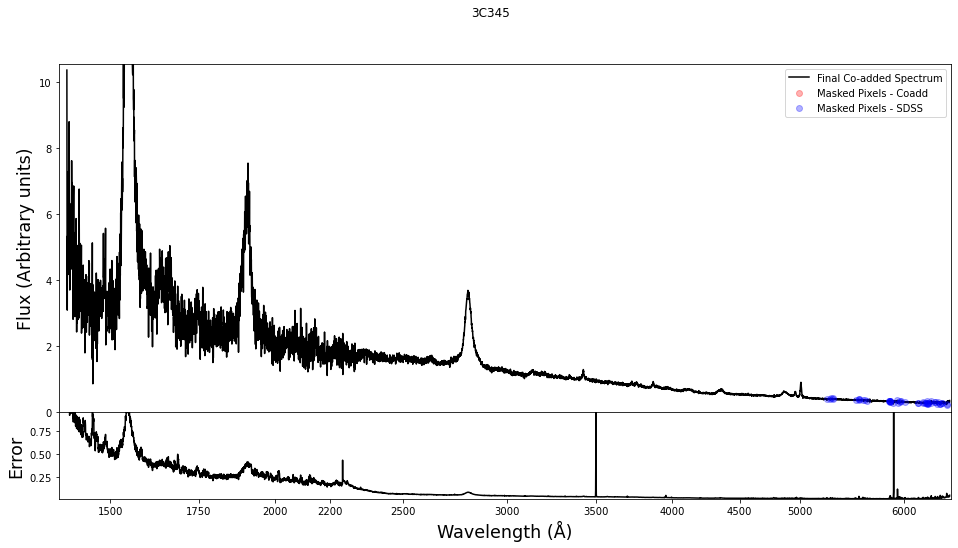

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


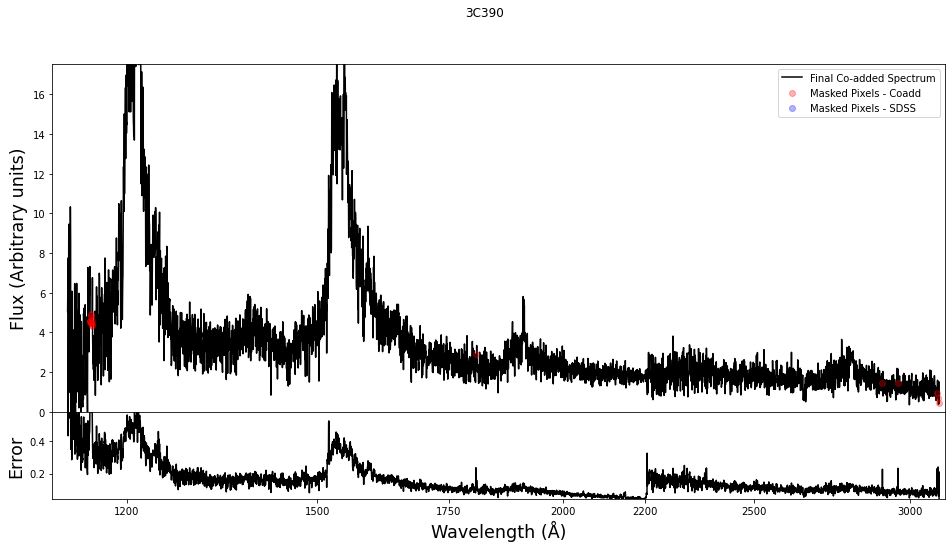

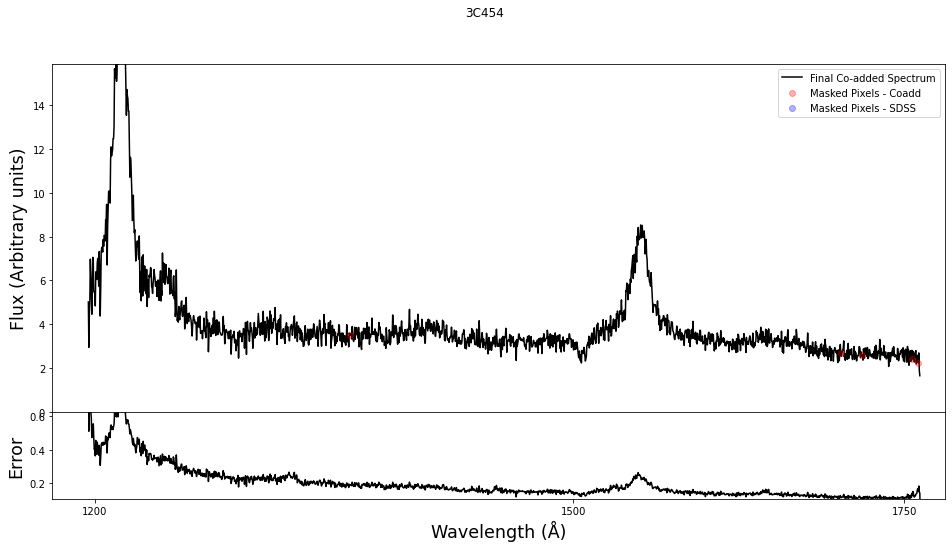

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


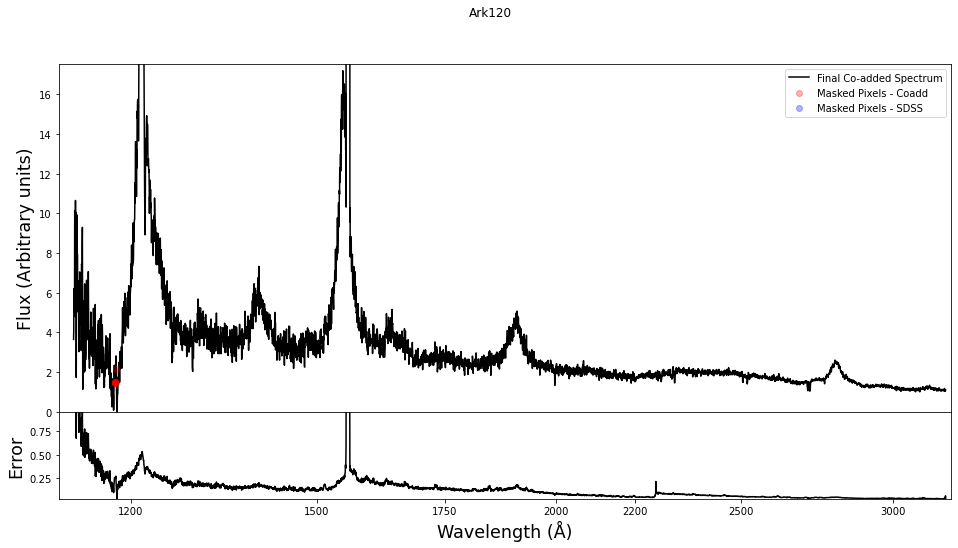

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


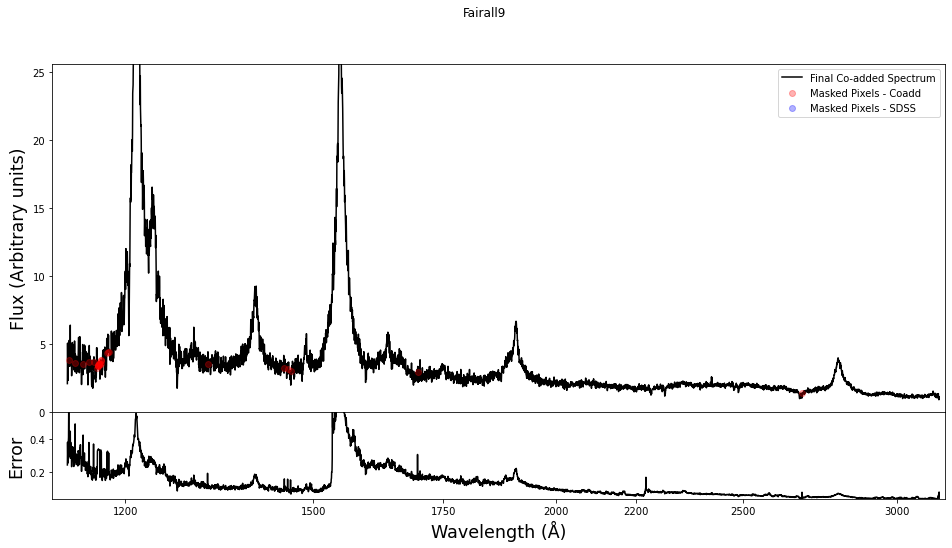

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


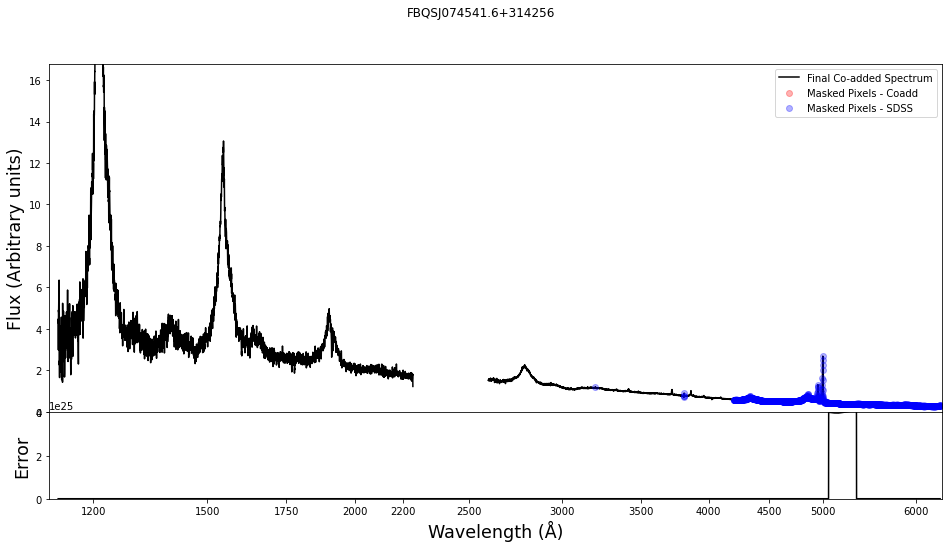

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


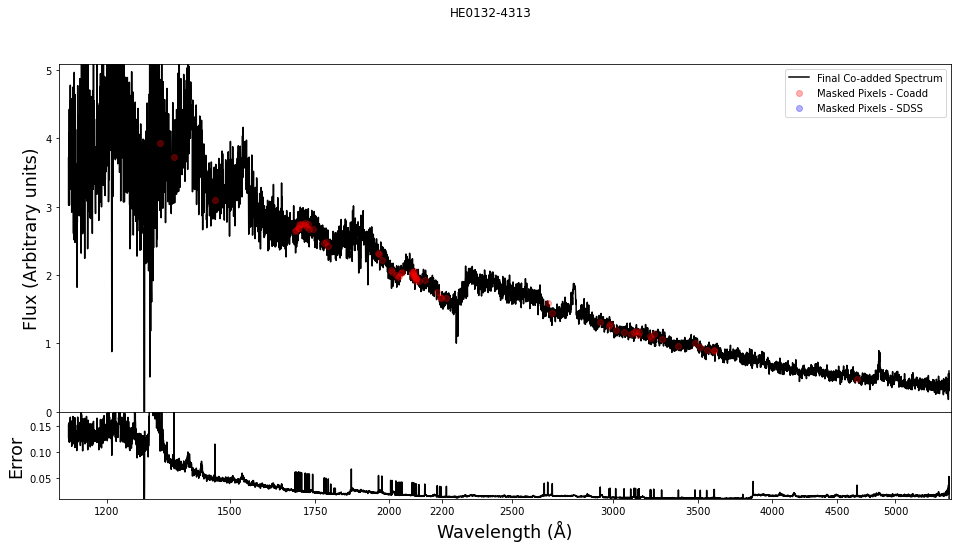

/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


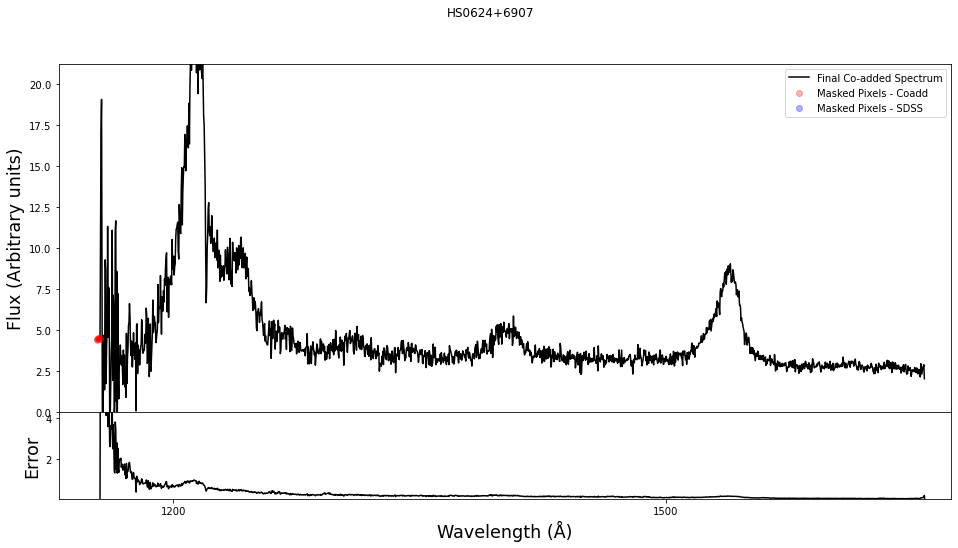

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


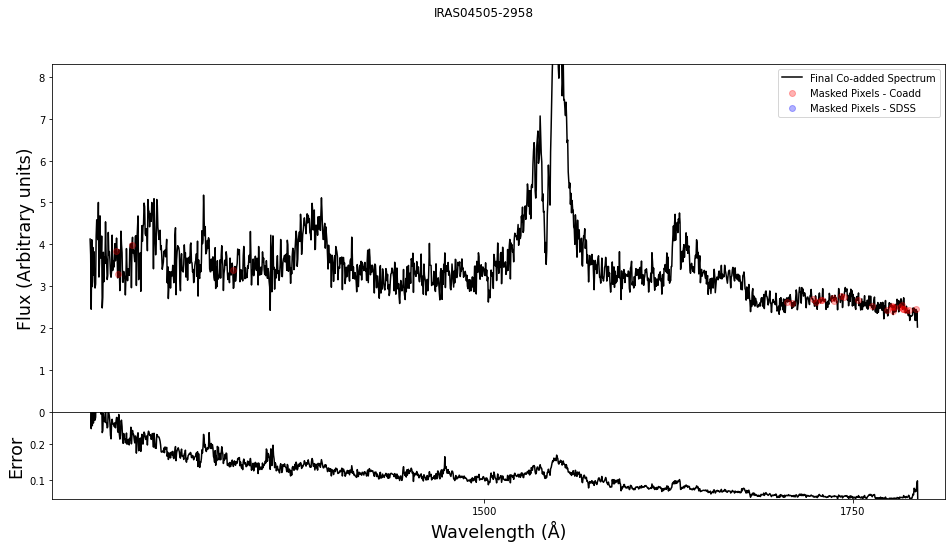

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


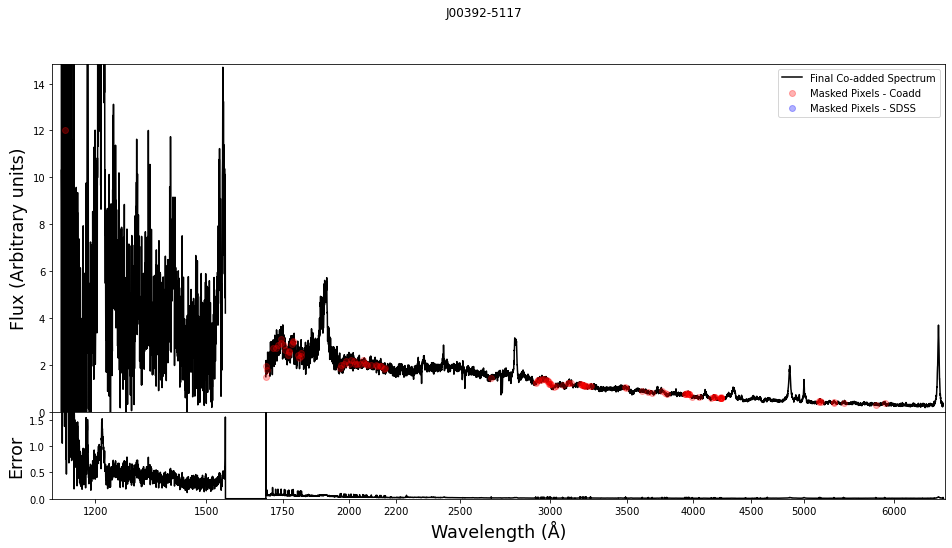

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


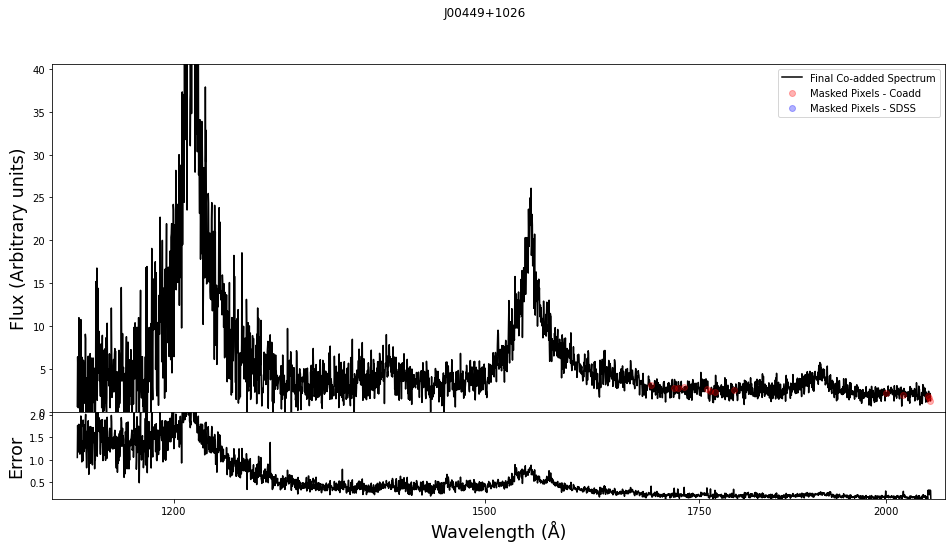

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


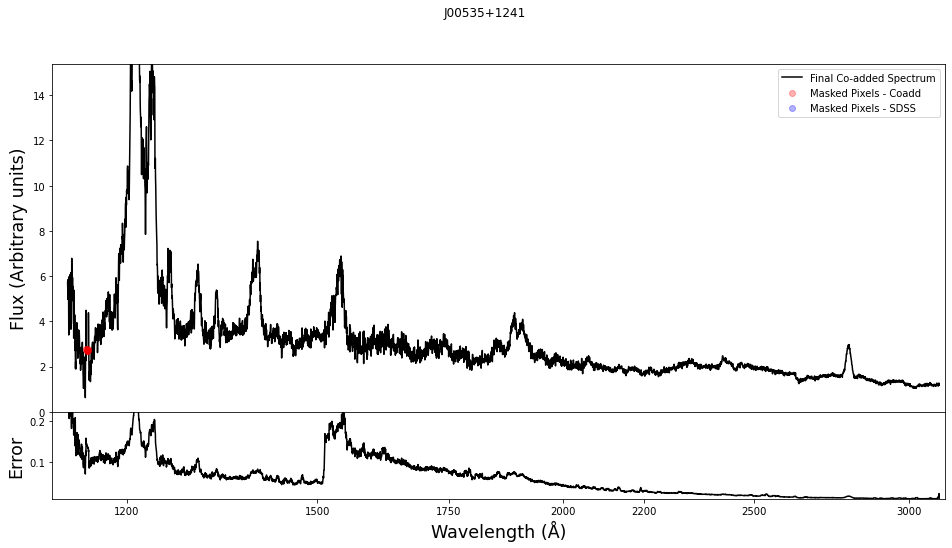

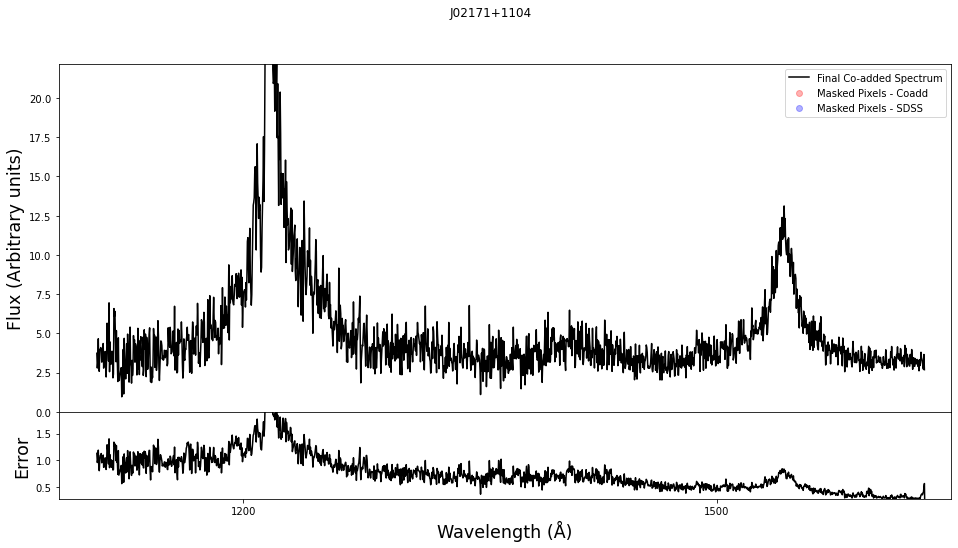

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


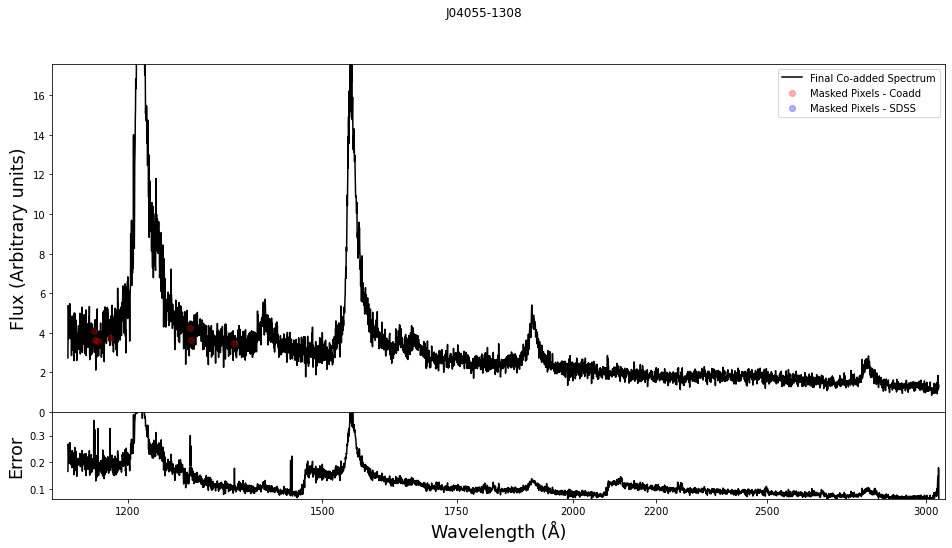

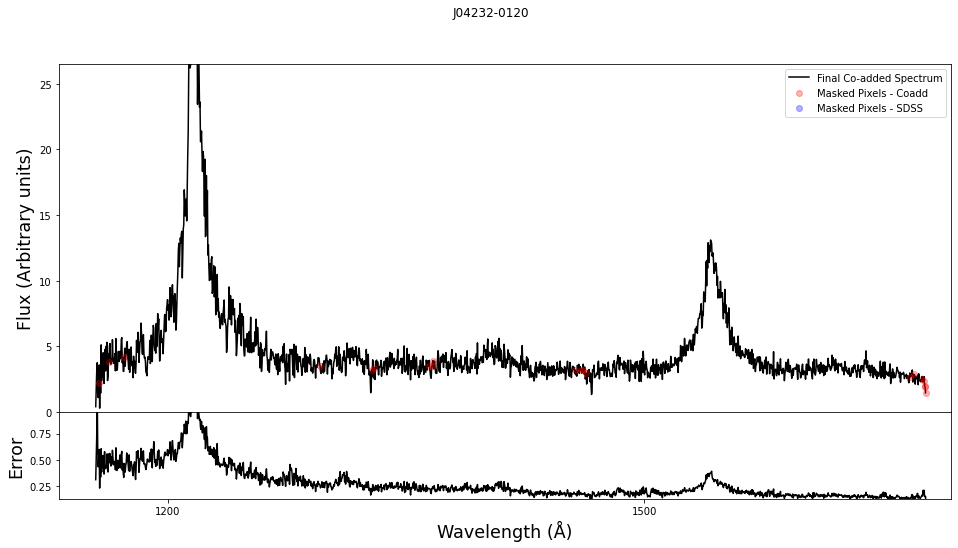

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


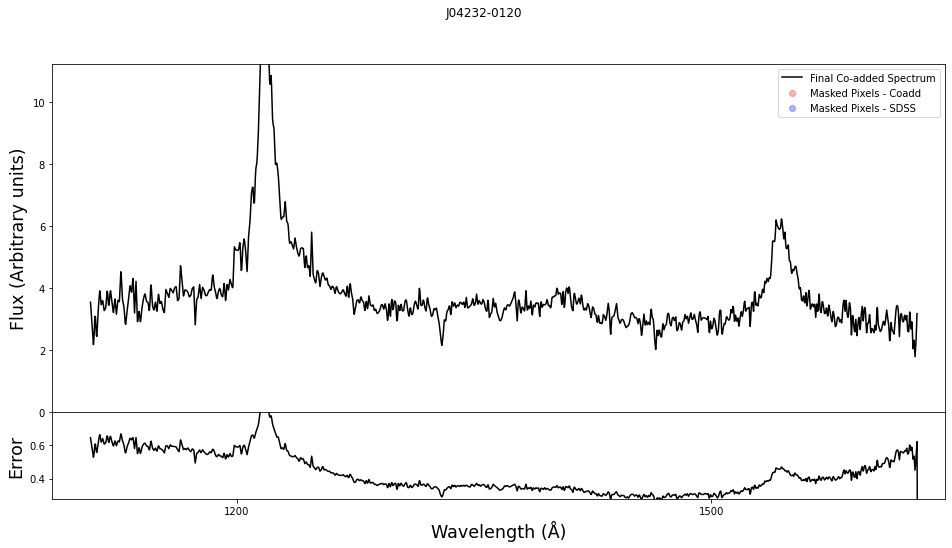

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


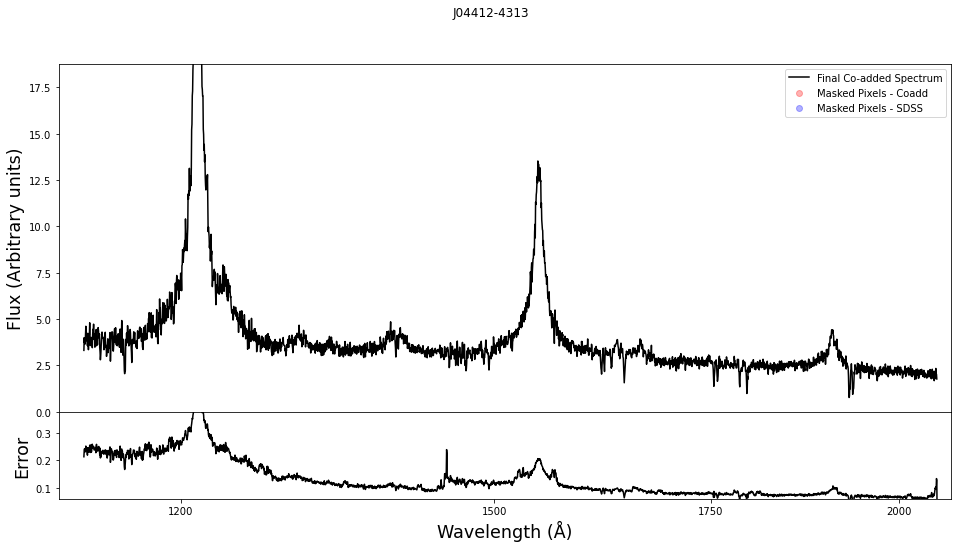

/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


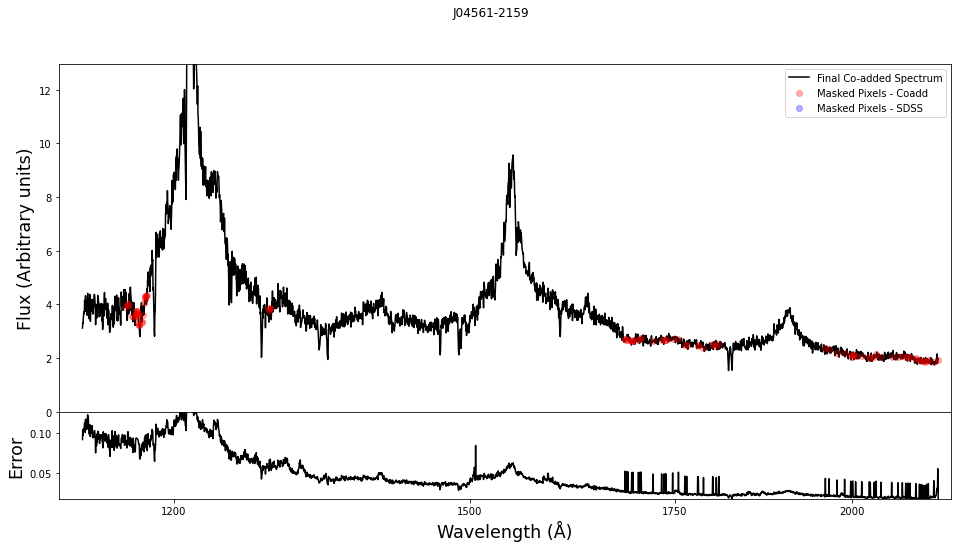

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


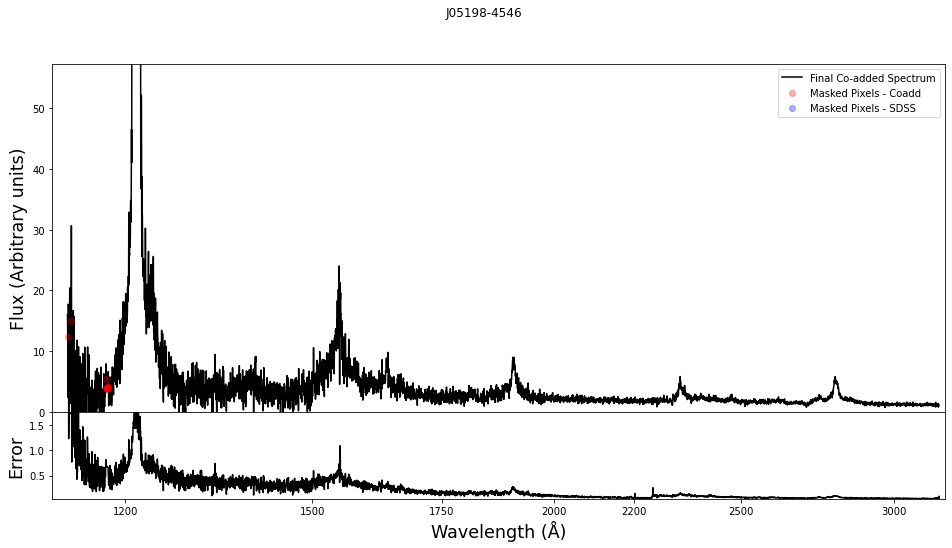

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


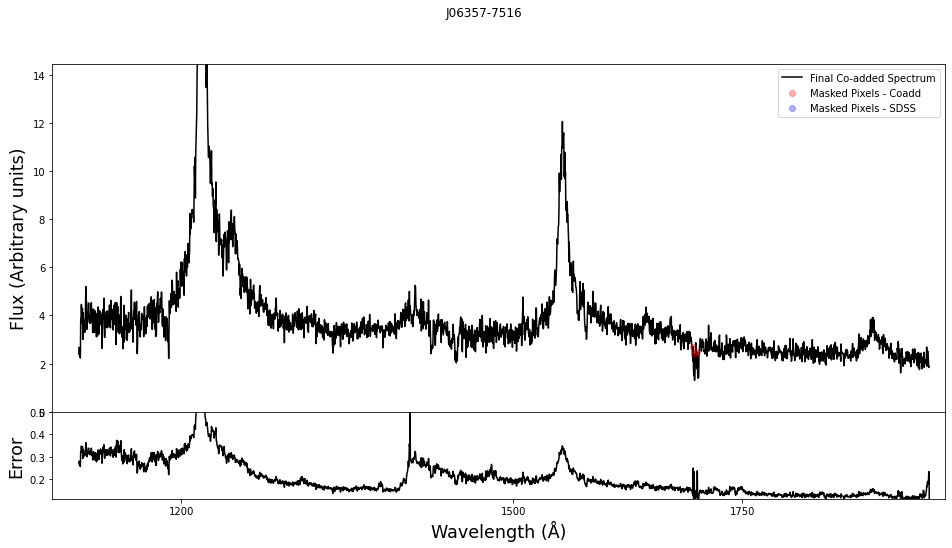

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


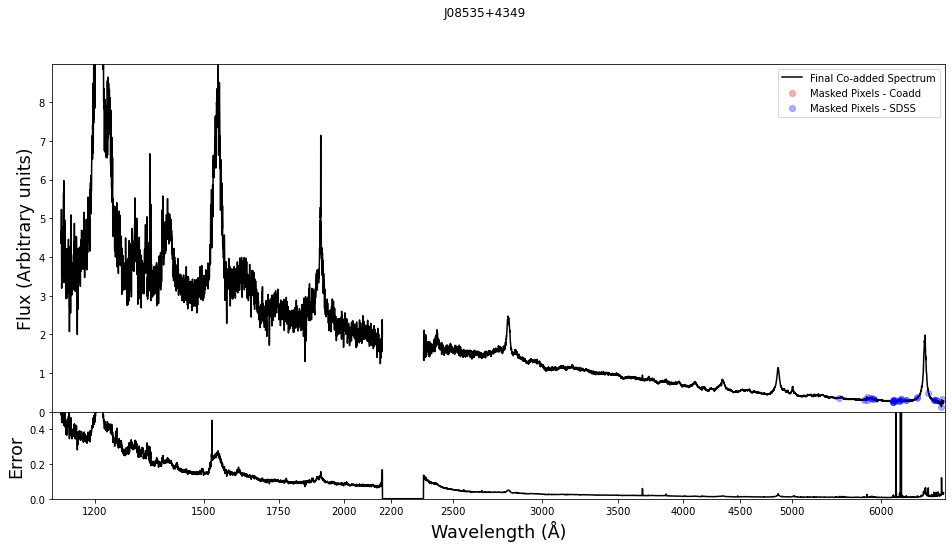

/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


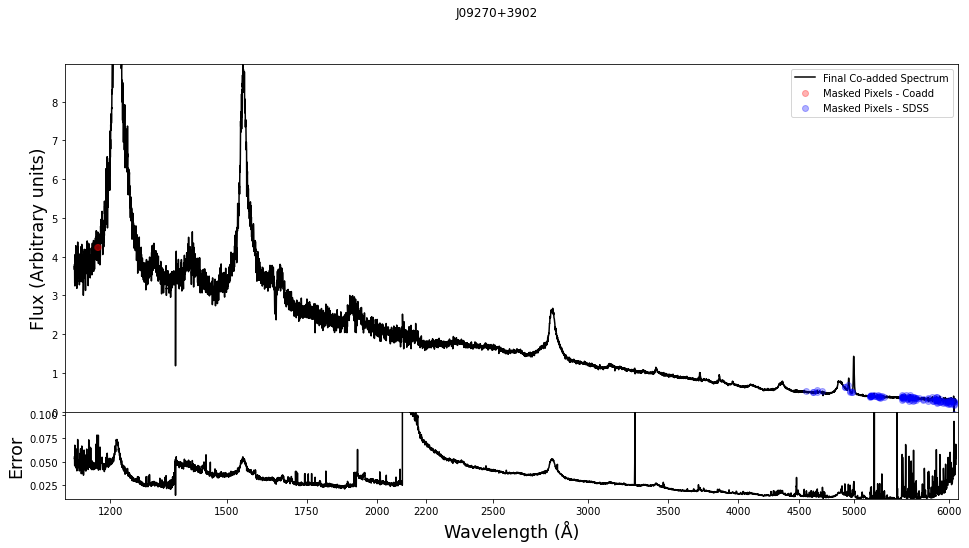

/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


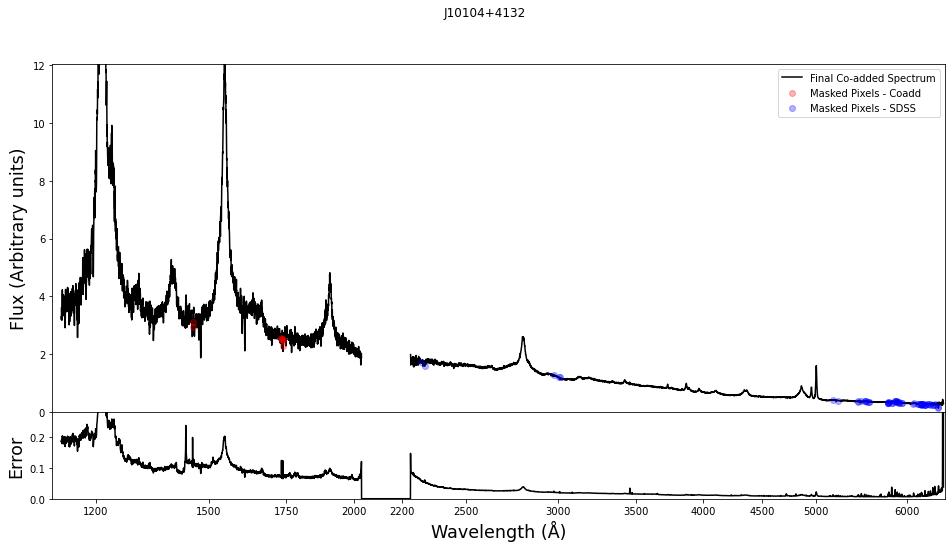

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


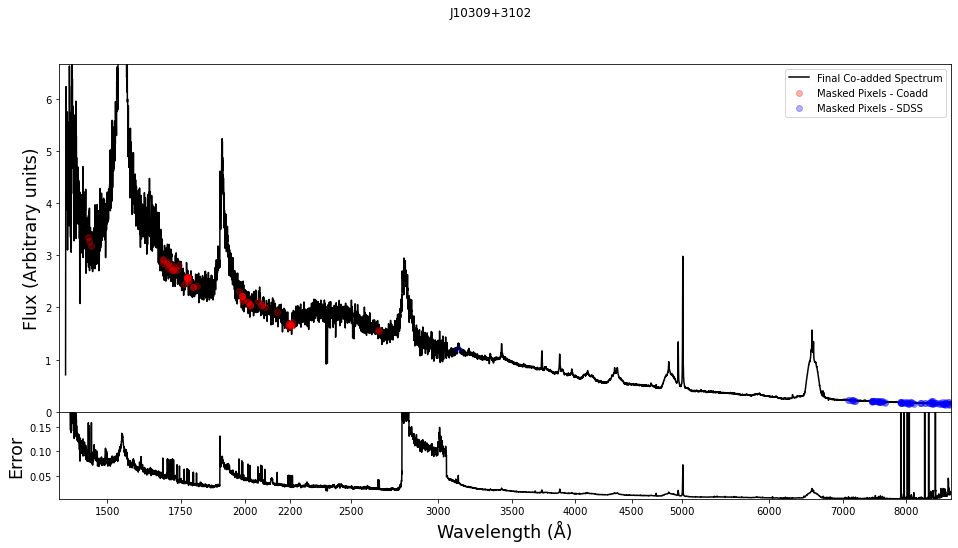

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


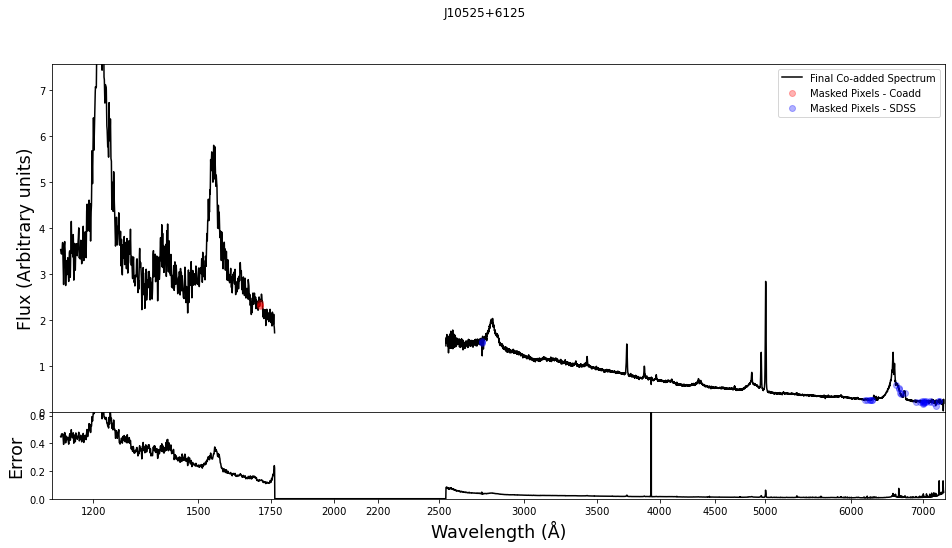

/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


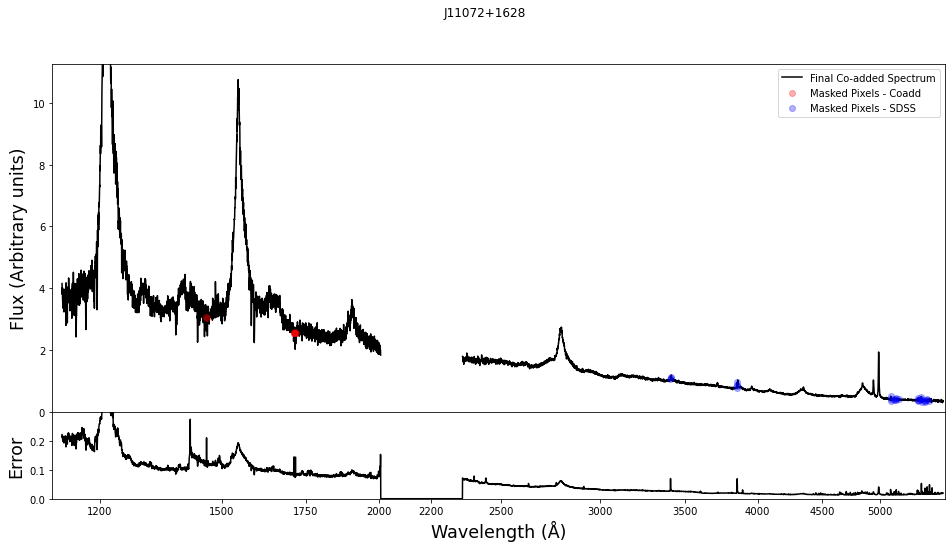

/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


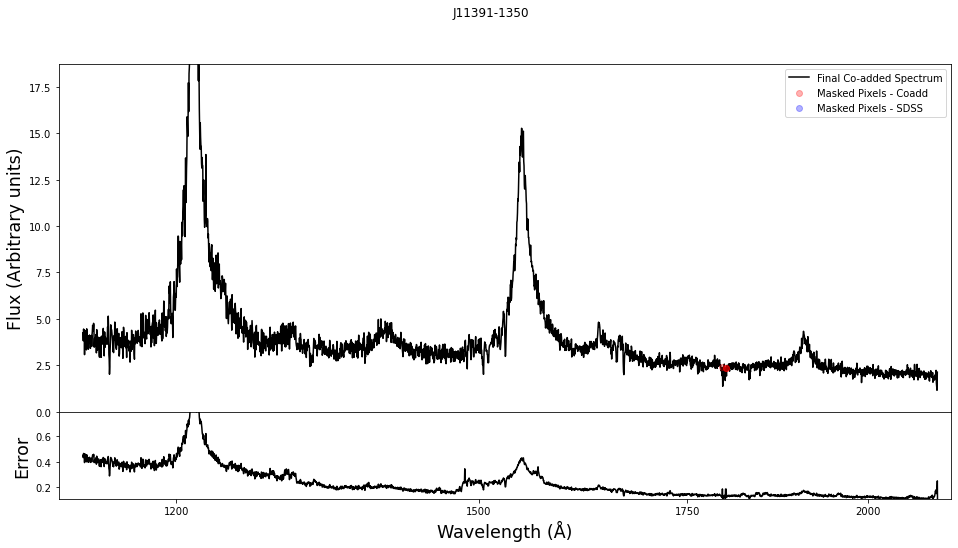

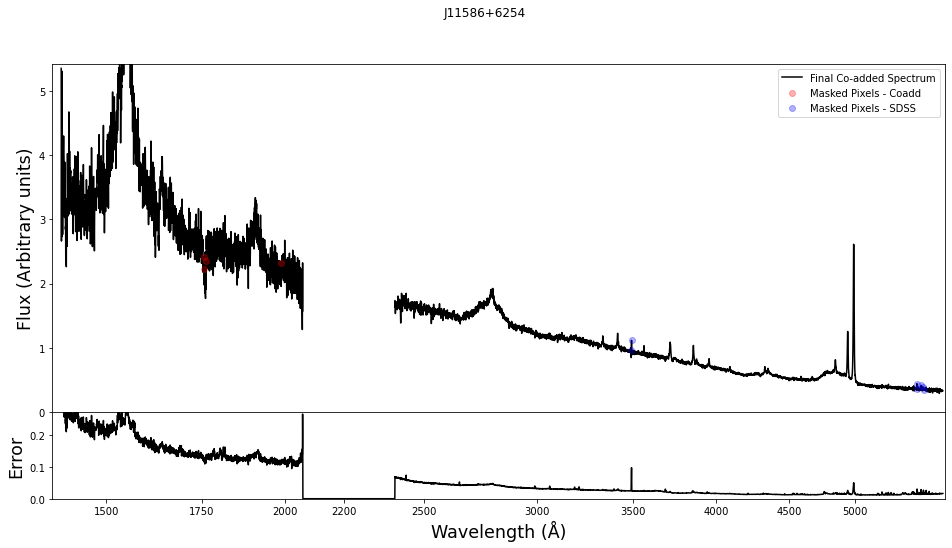

/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


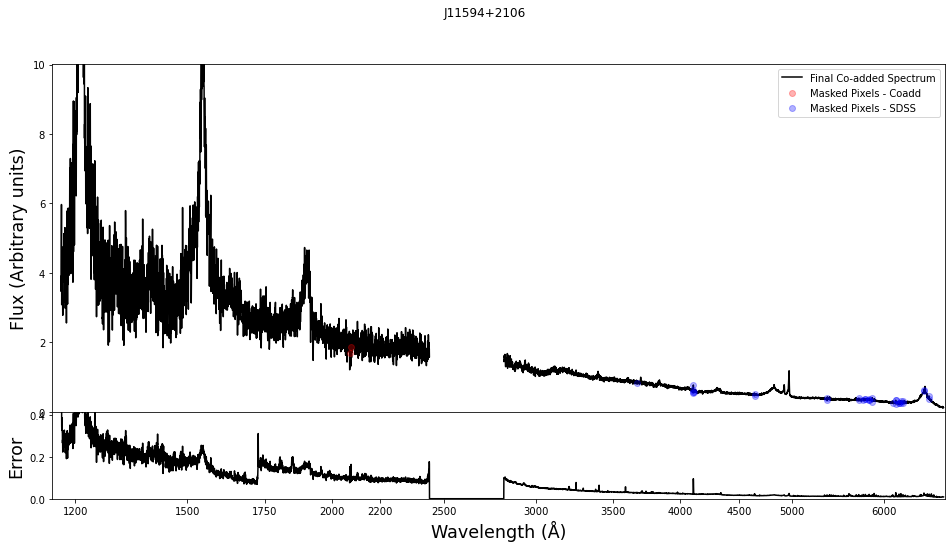

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


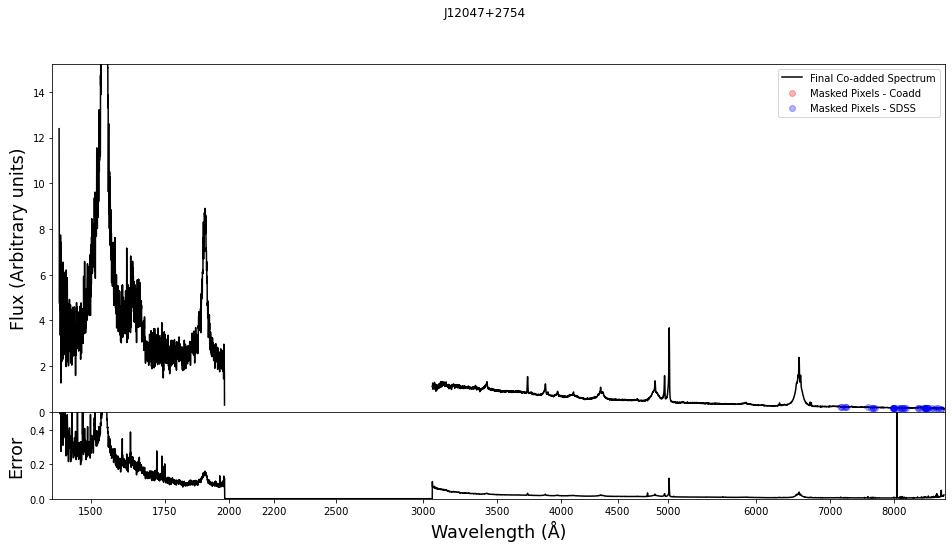

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


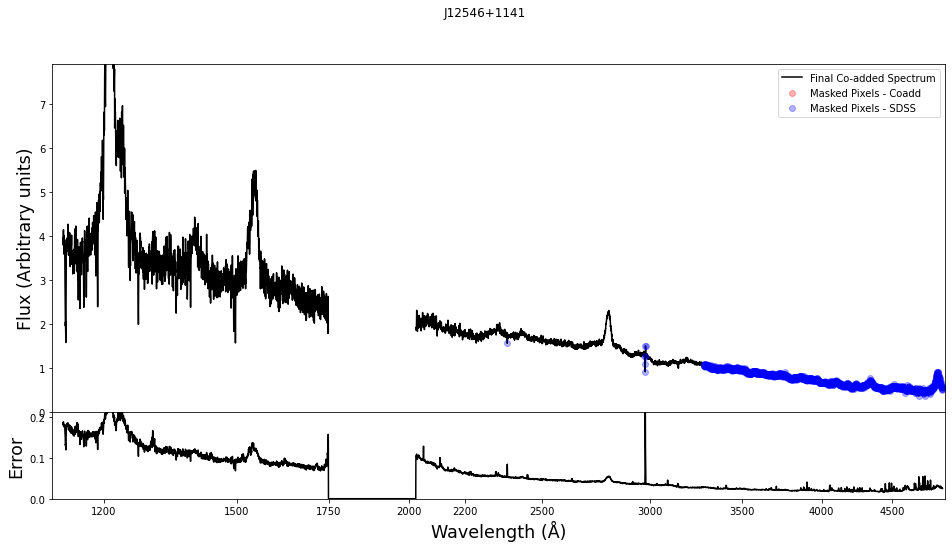

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:182: RuntimeWarning: divide by zero encountered in true_divide
  new_weights = 1 / (new_errs**2.)


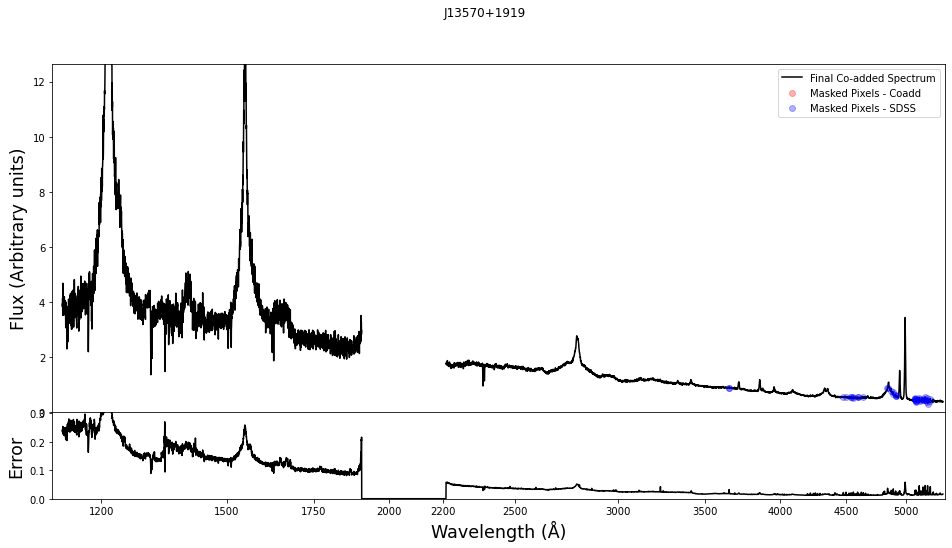

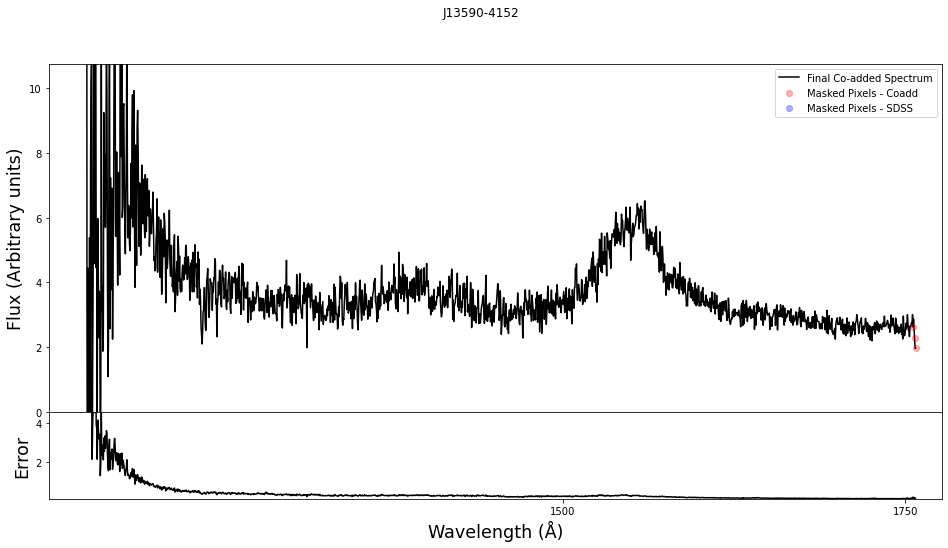

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


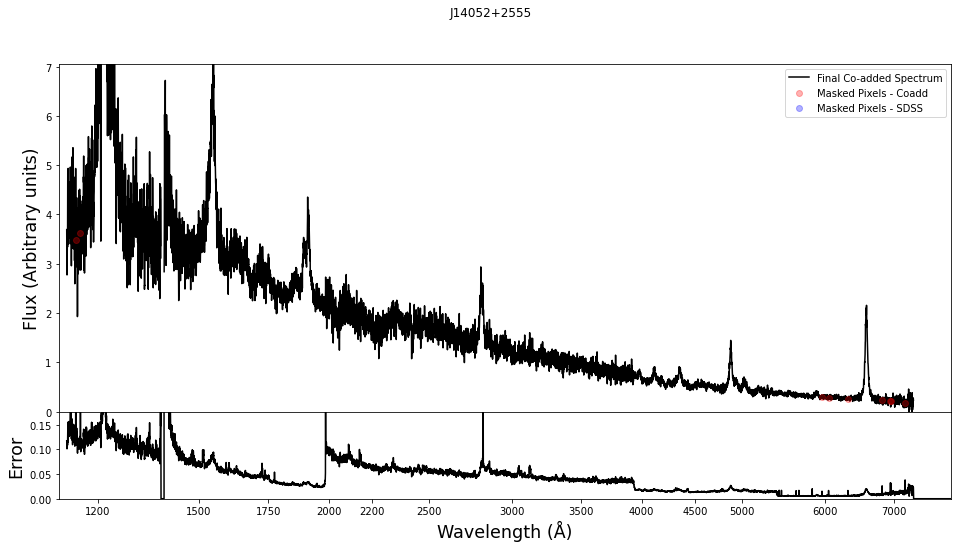

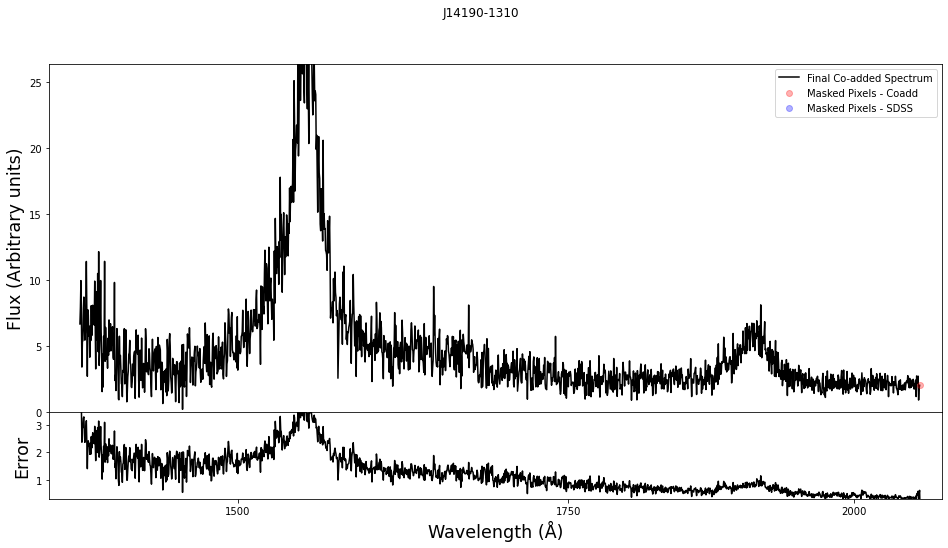

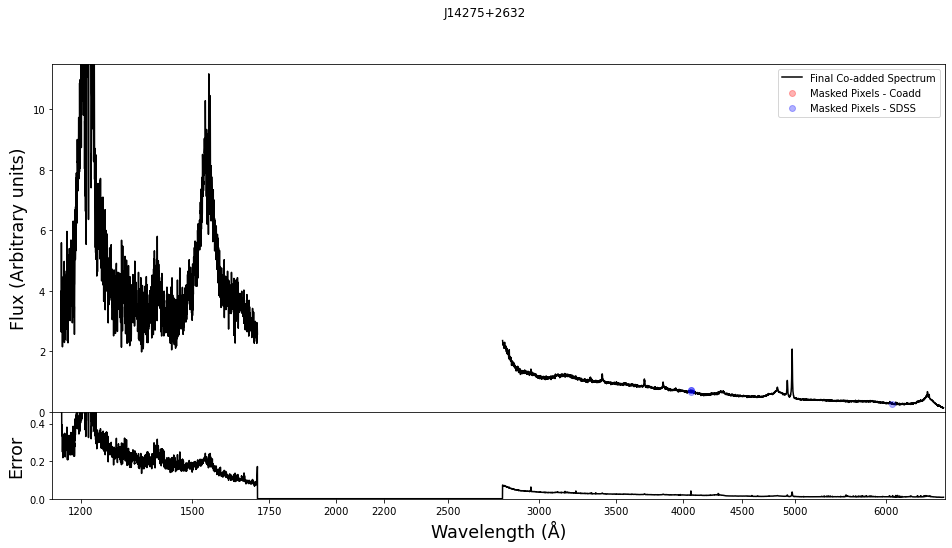

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


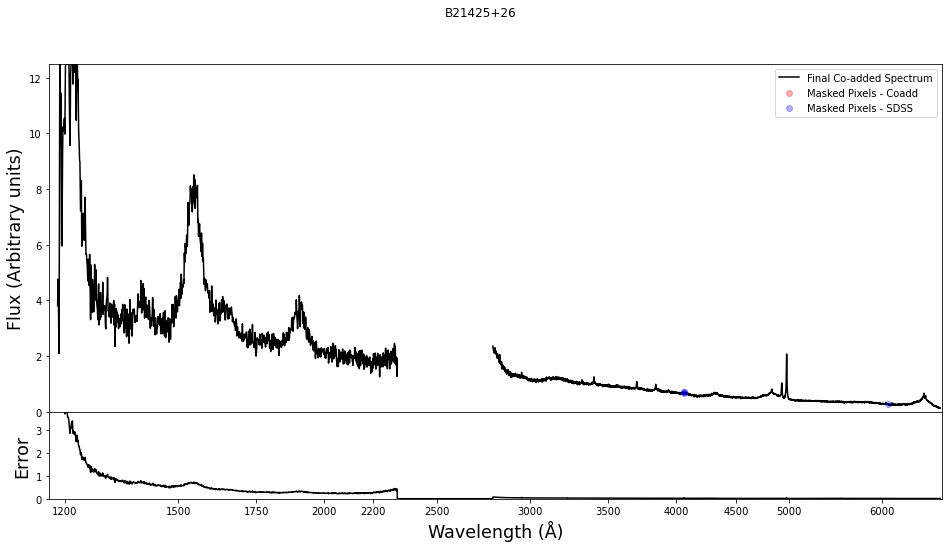

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:182: RuntimeWarning: divide by zero encountered in true_divide
  new_weights = 1 / (new_errs**2.)


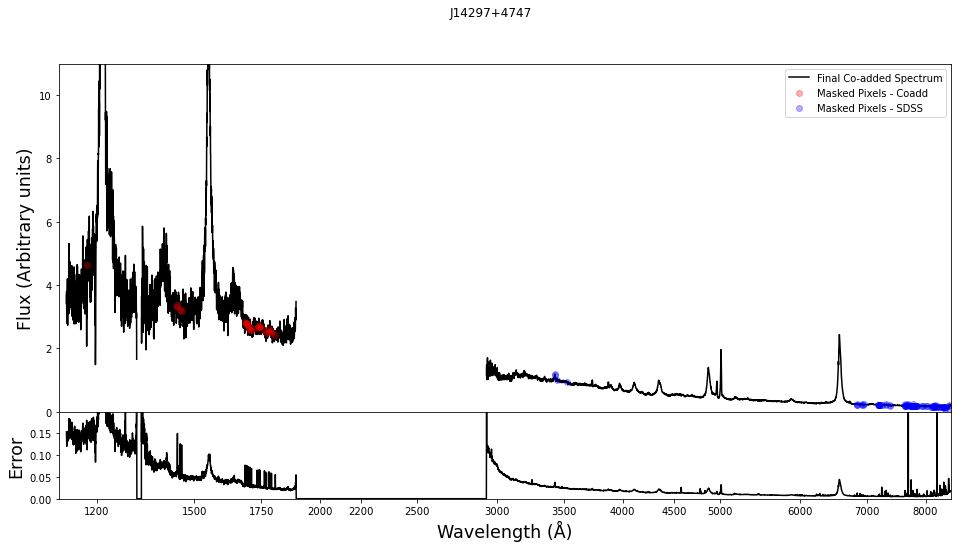

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


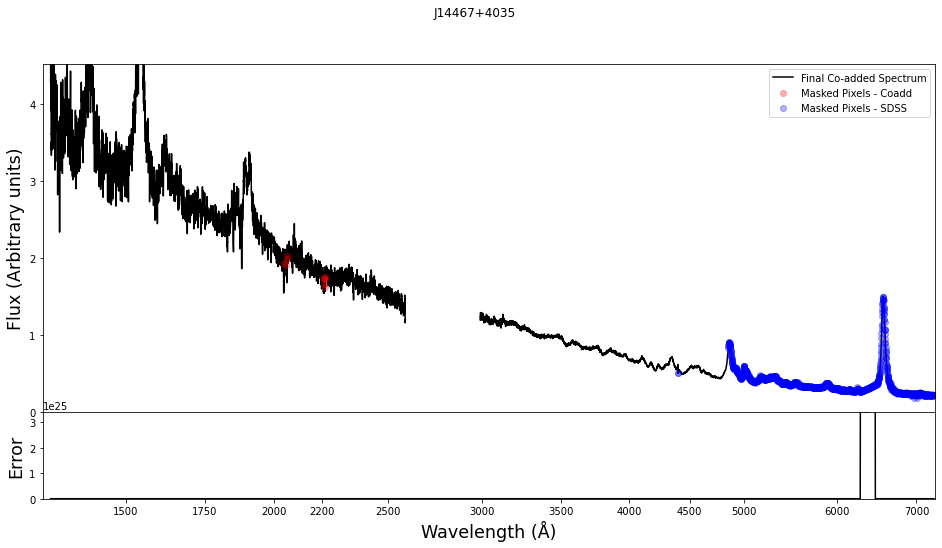

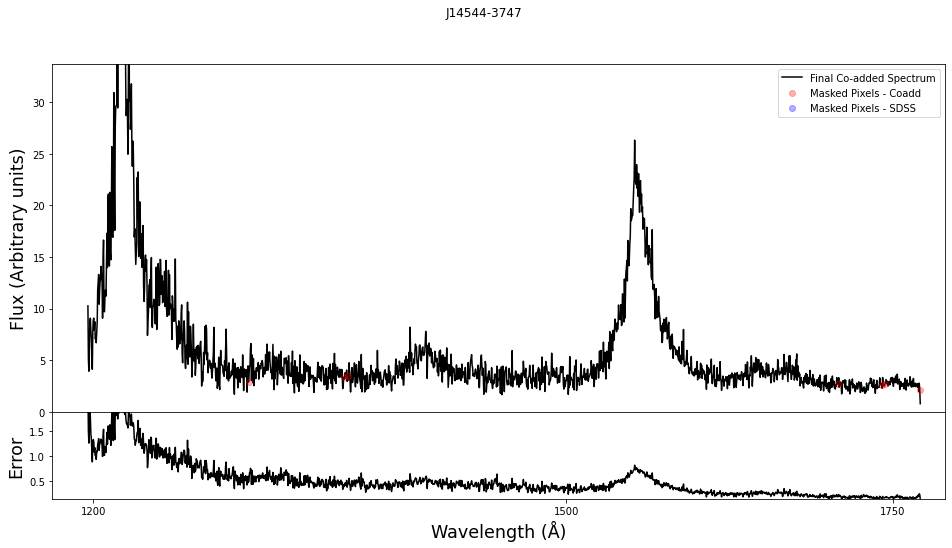

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


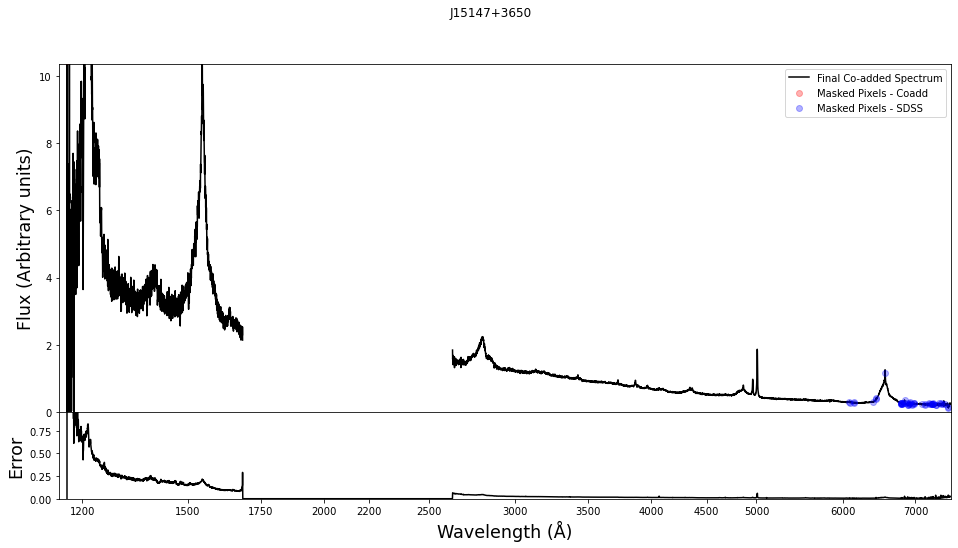

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


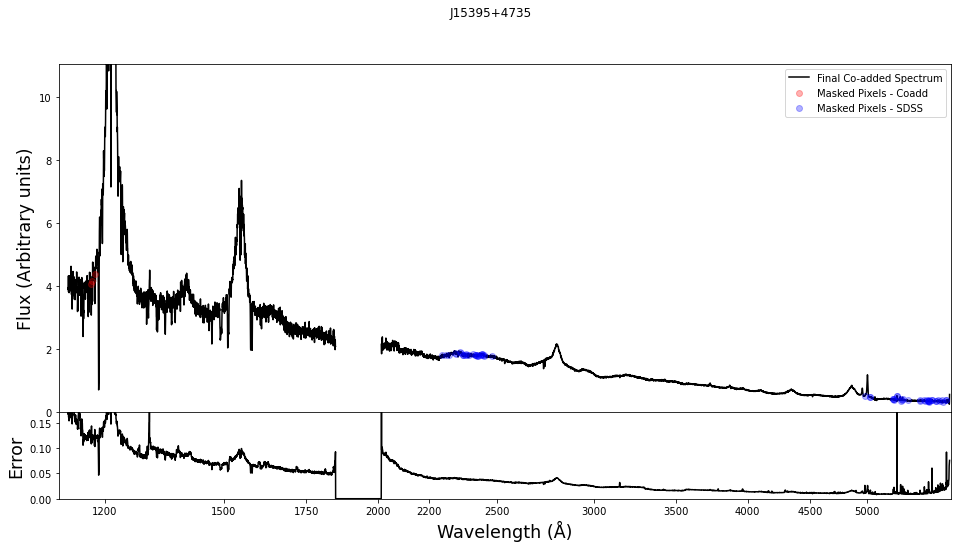

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


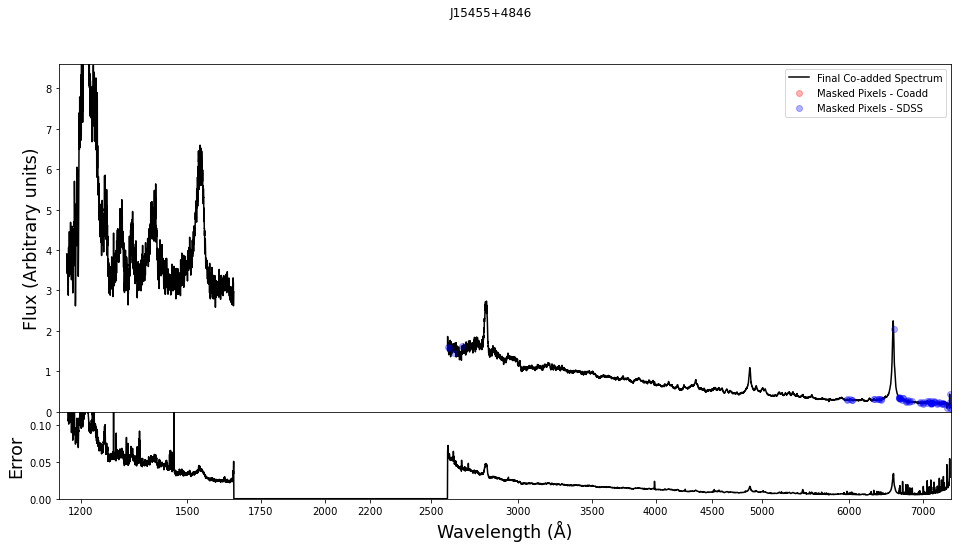

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


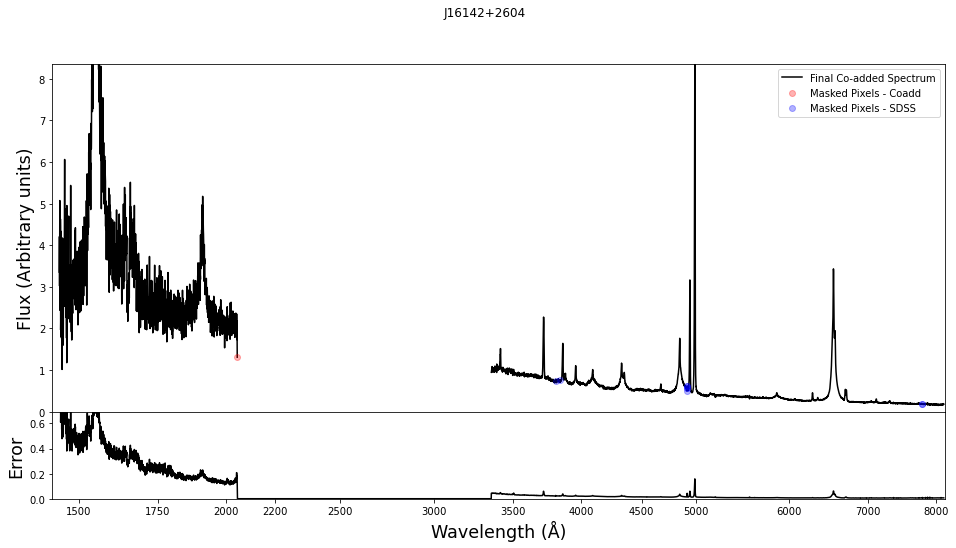

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


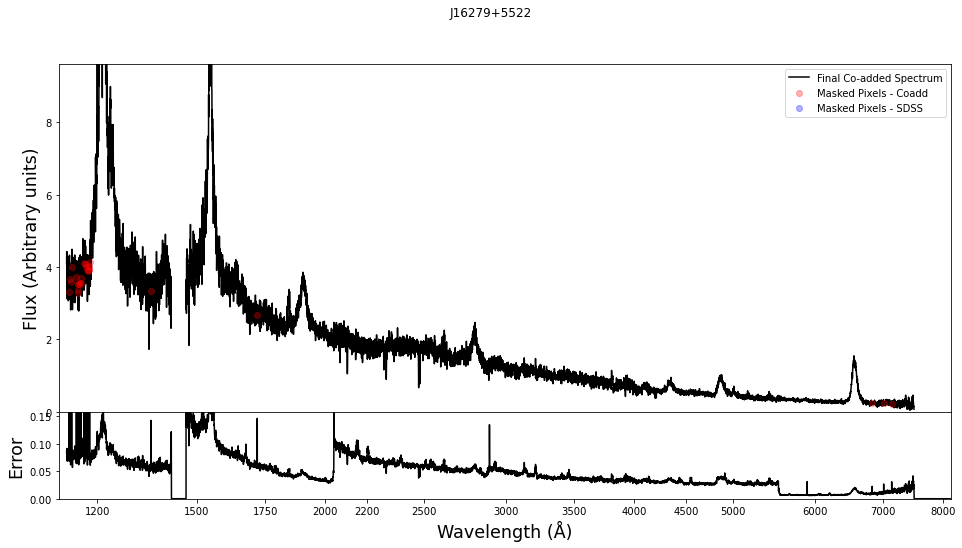

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:182: RuntimeWarning: divide by zero encountered in true_divide
  new_weights = 1 / (new_errs**2.)


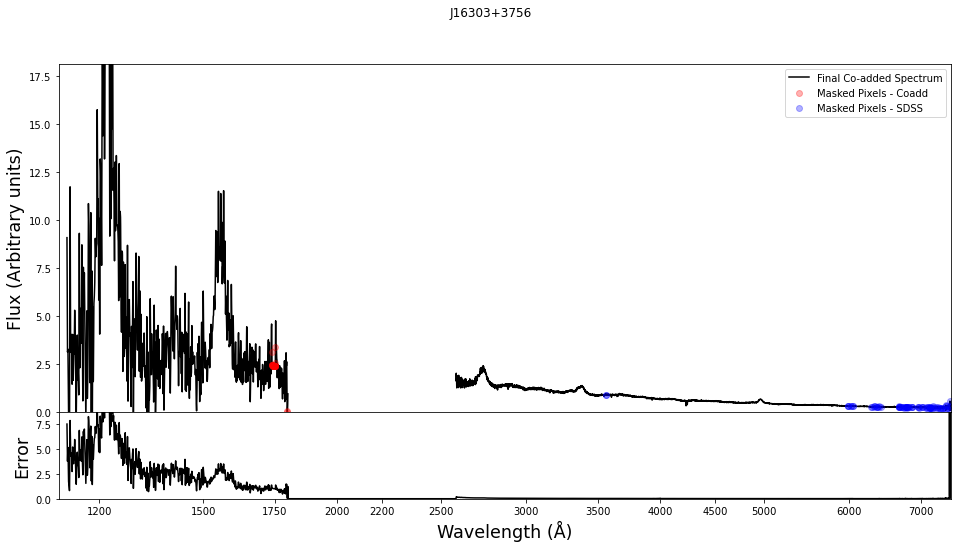

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/LowerResHSTRebin_TVM.py:103: RuntimeWarning: invalid value encountered in sqrt
  fluxerr_HST_rebin[i] = (m_err*wave_HST_rebin[i] + b_err) * np.sqrt(old_width/new_width)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


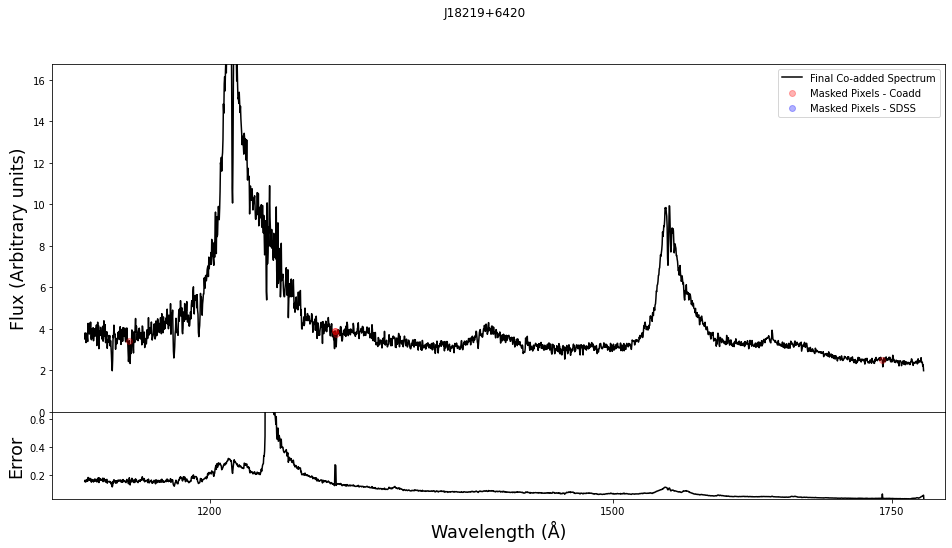

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


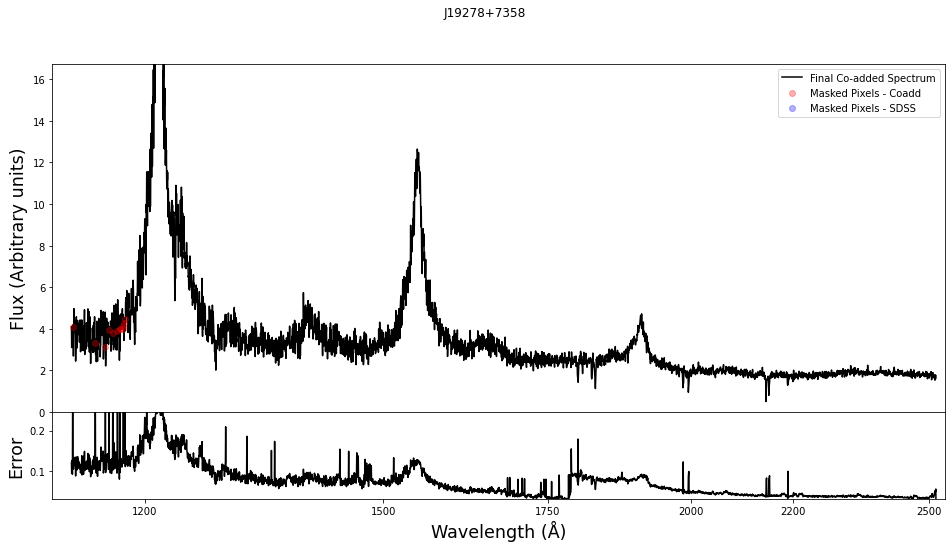

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


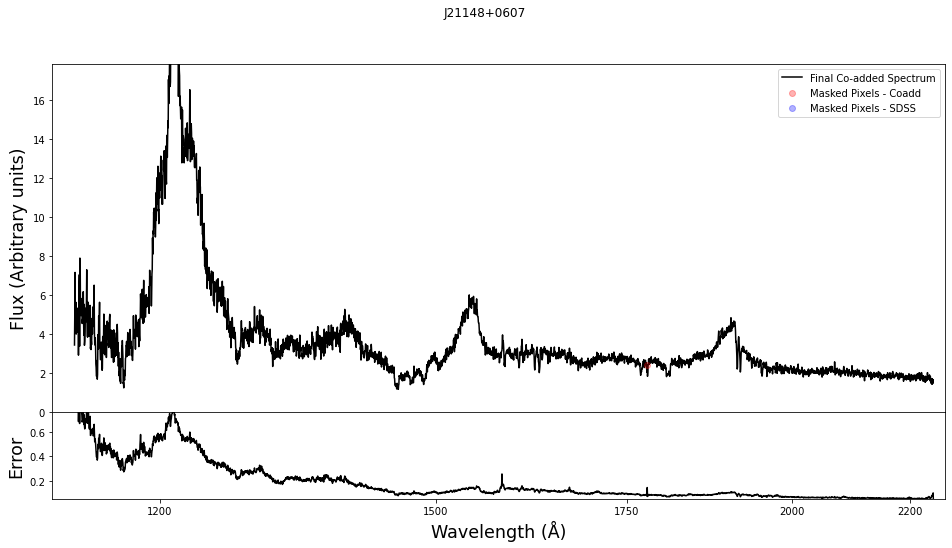

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


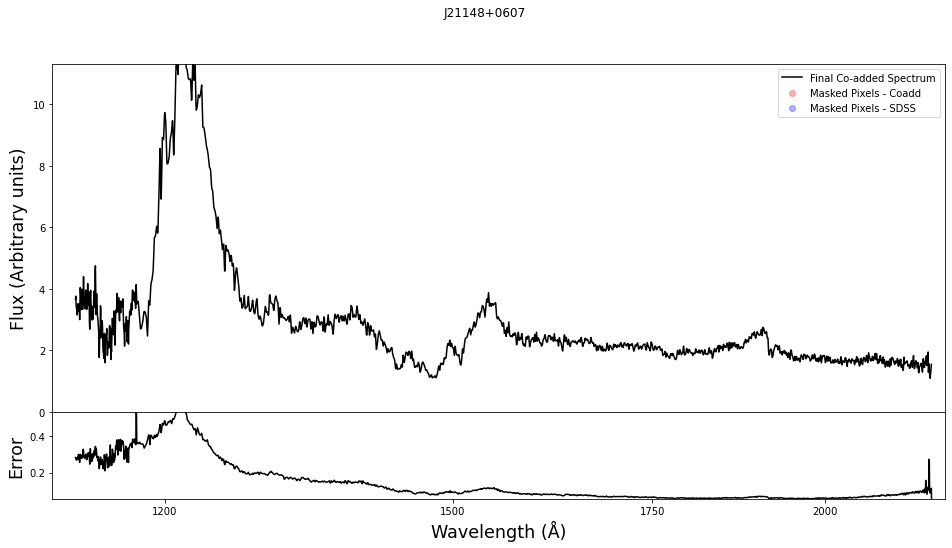

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


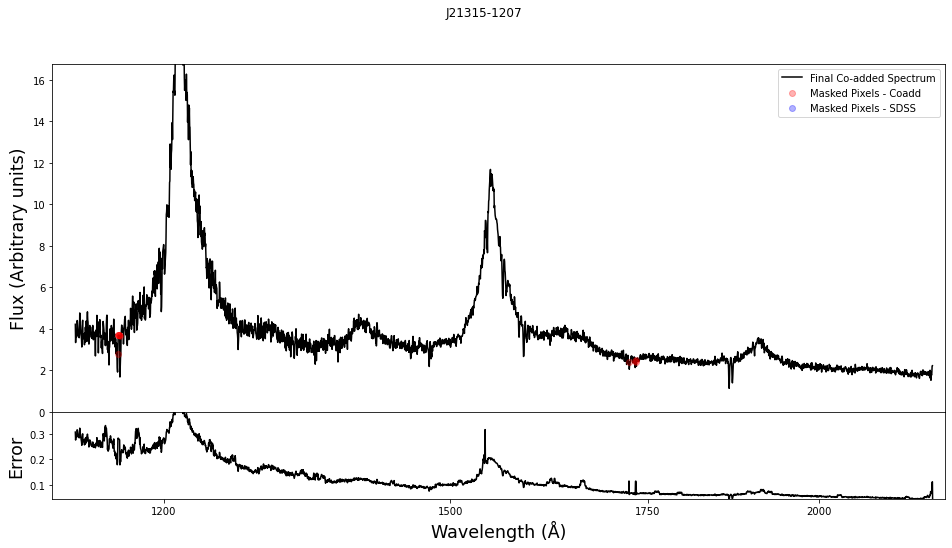

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


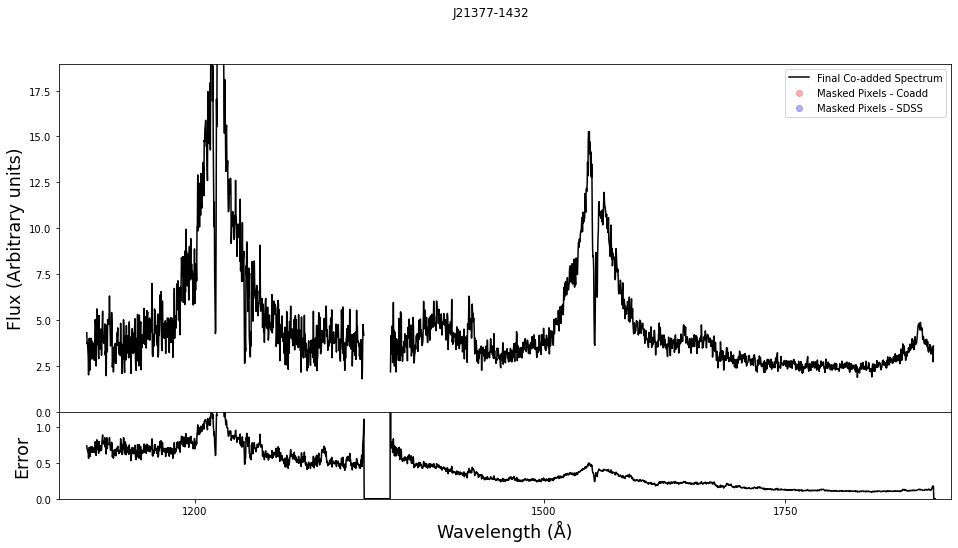

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


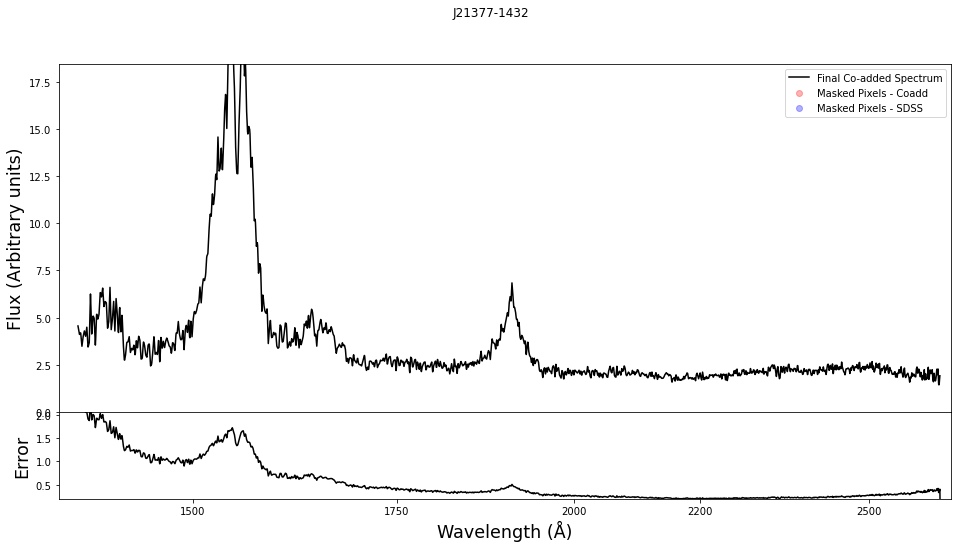

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


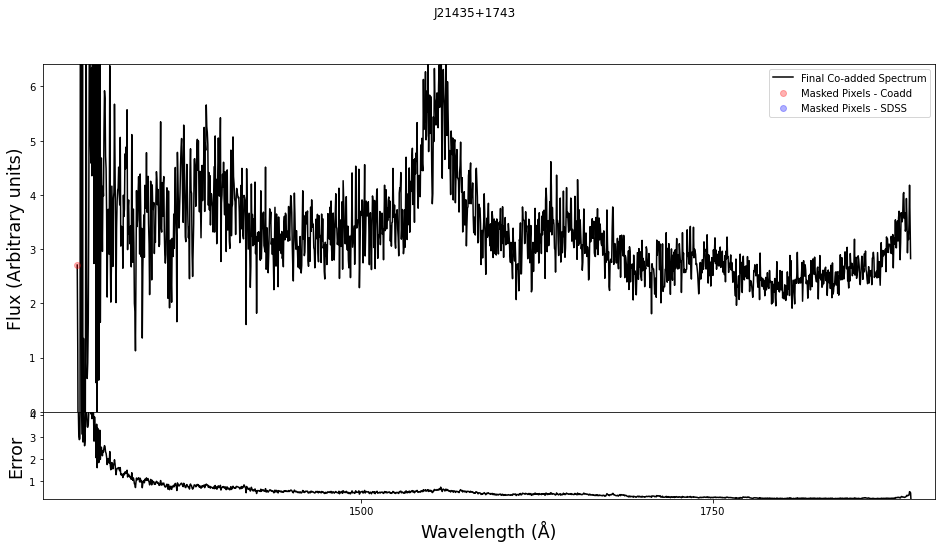

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


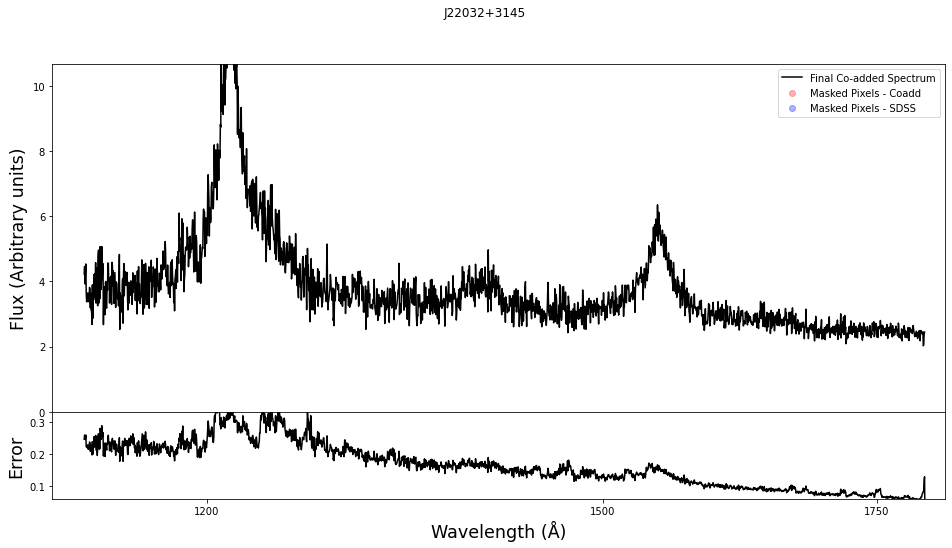

/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


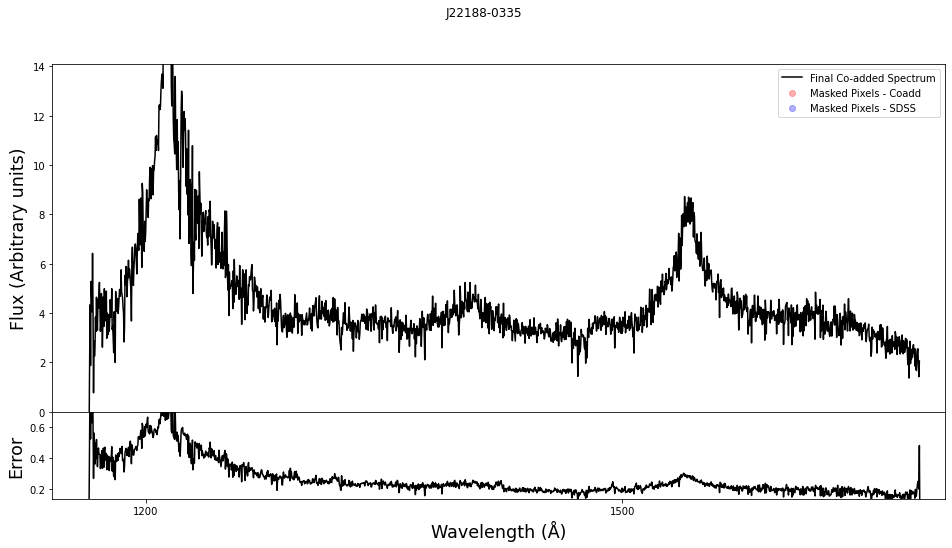

/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


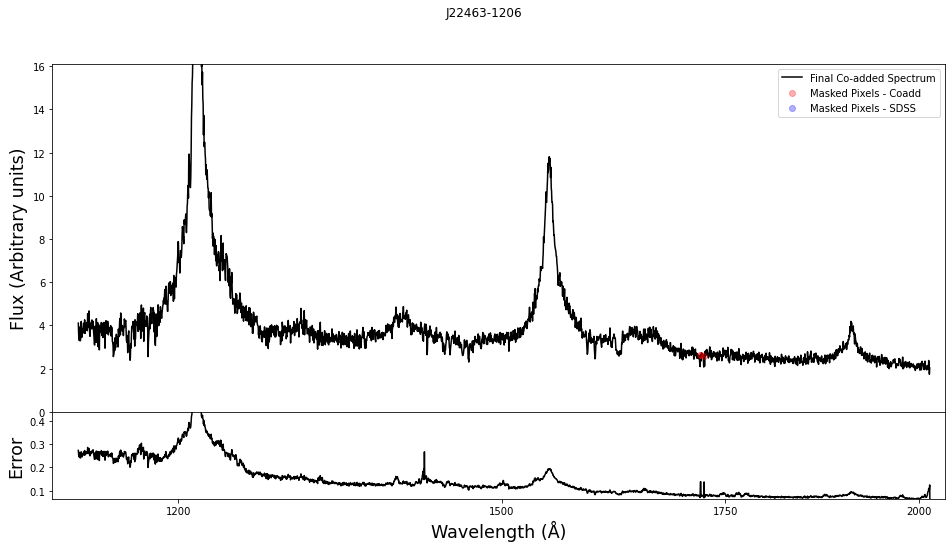

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


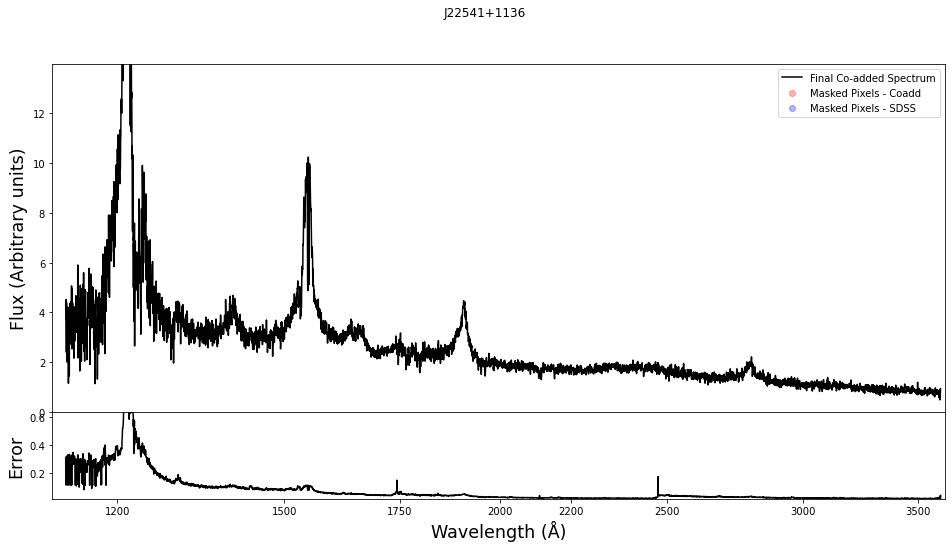

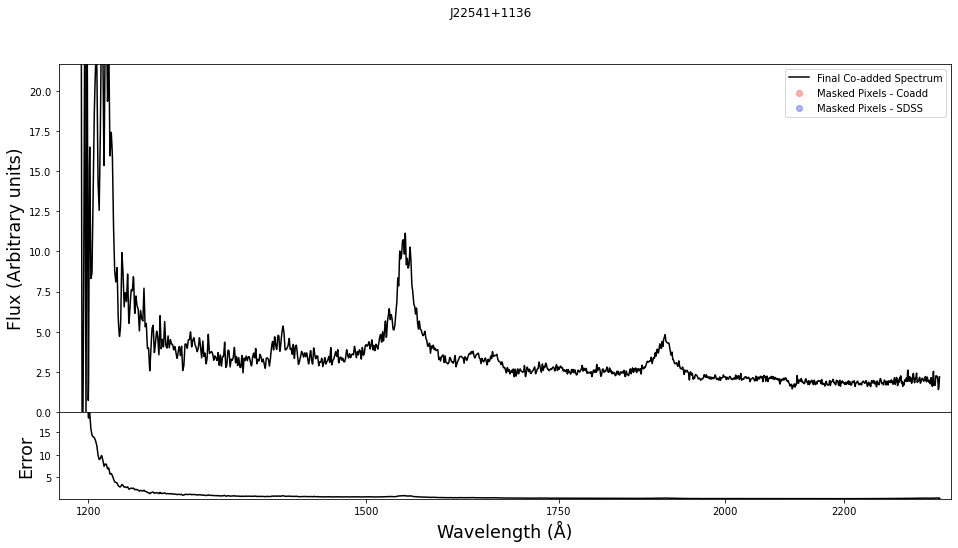

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


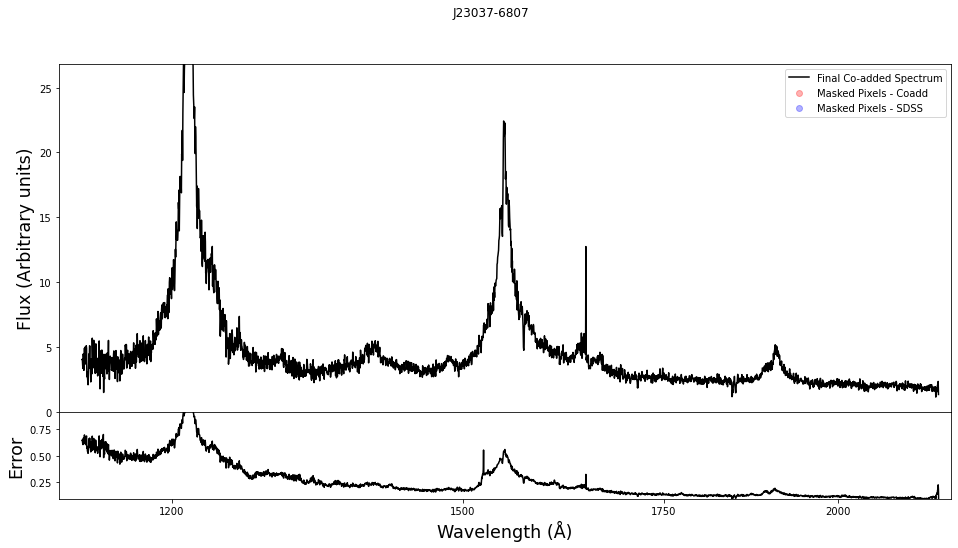

/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


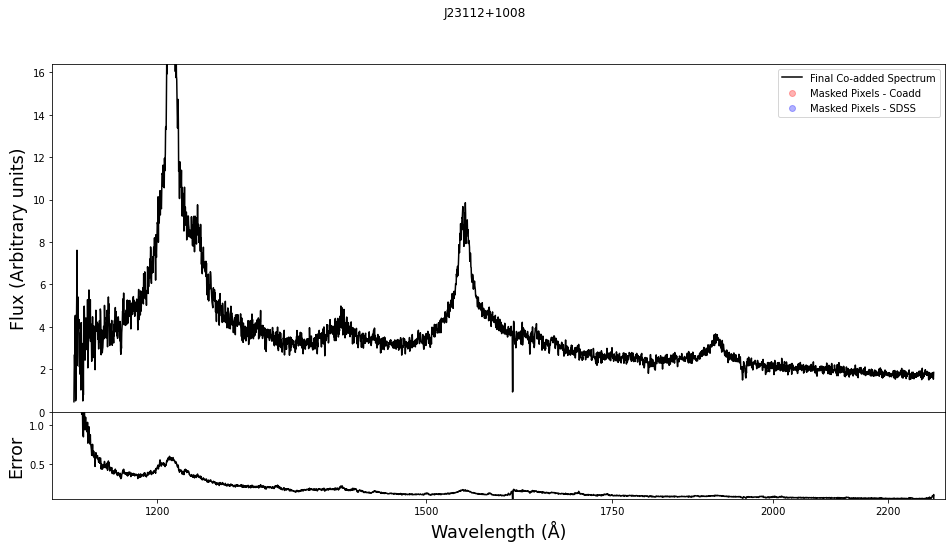

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


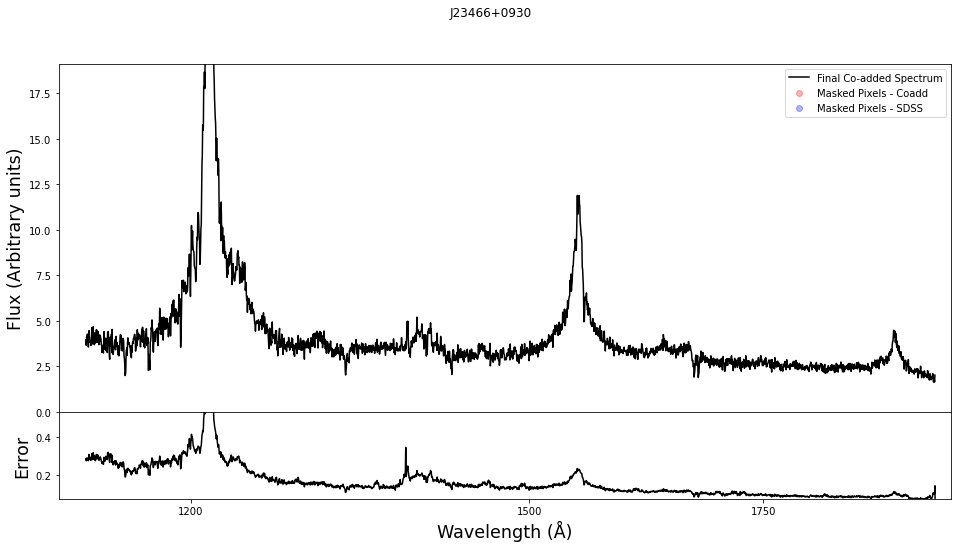

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


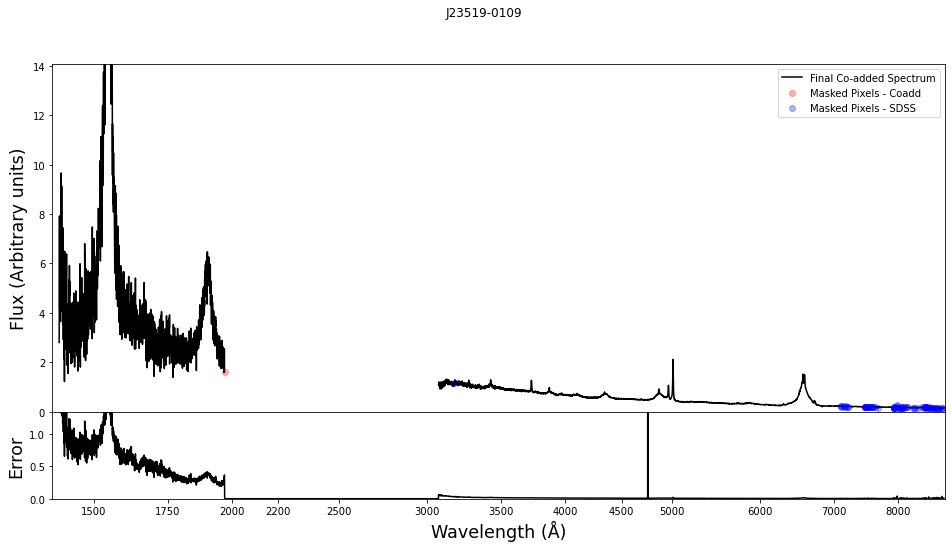

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


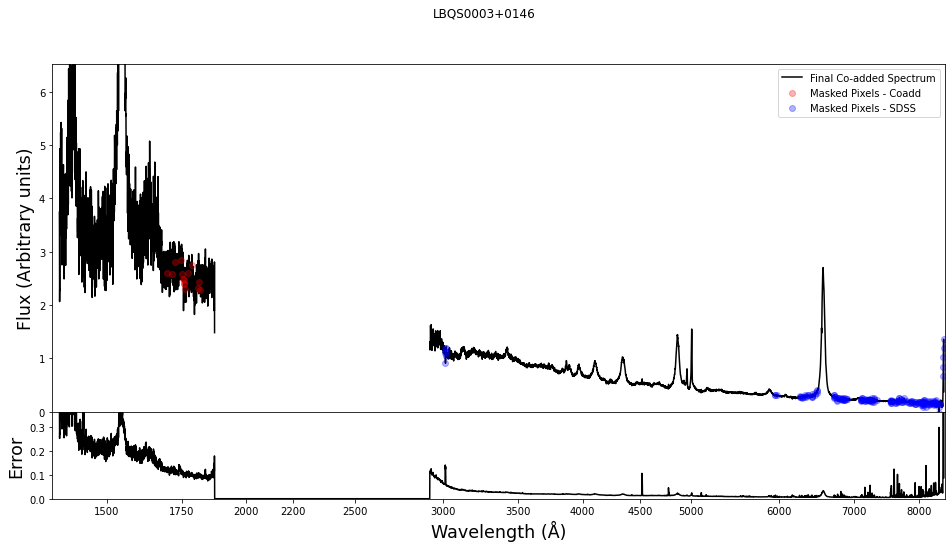

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


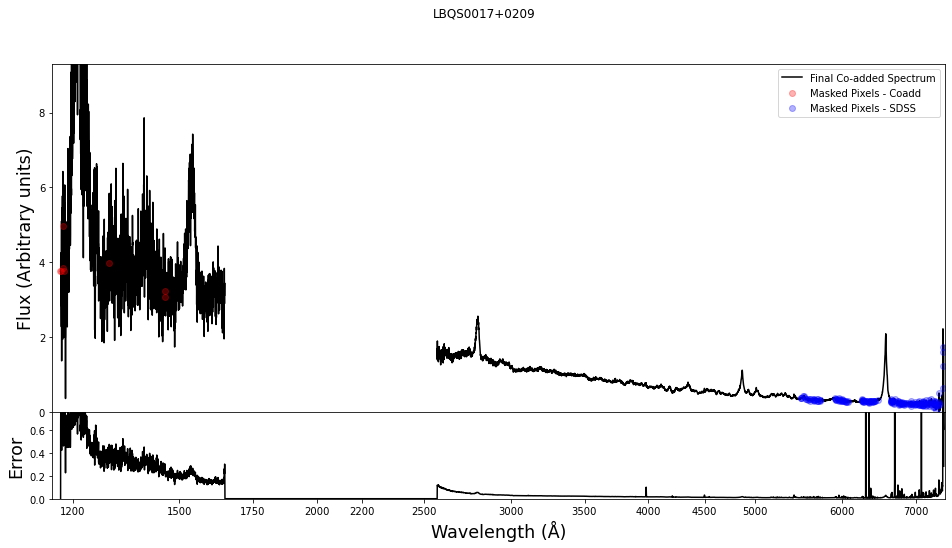

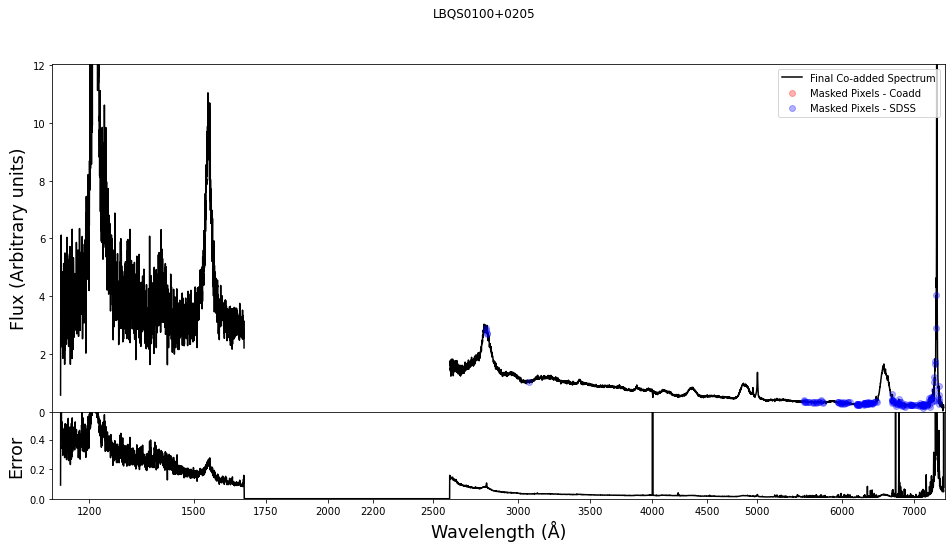

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


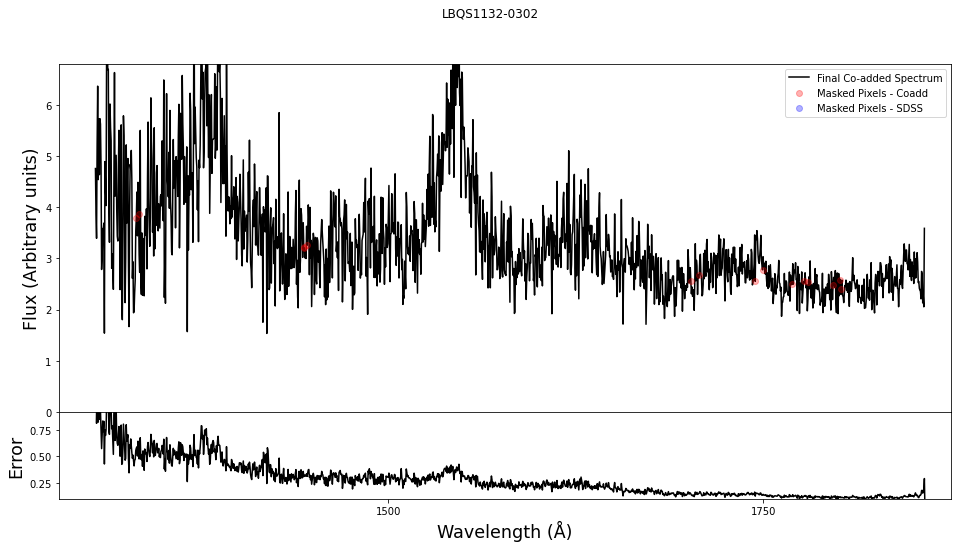

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


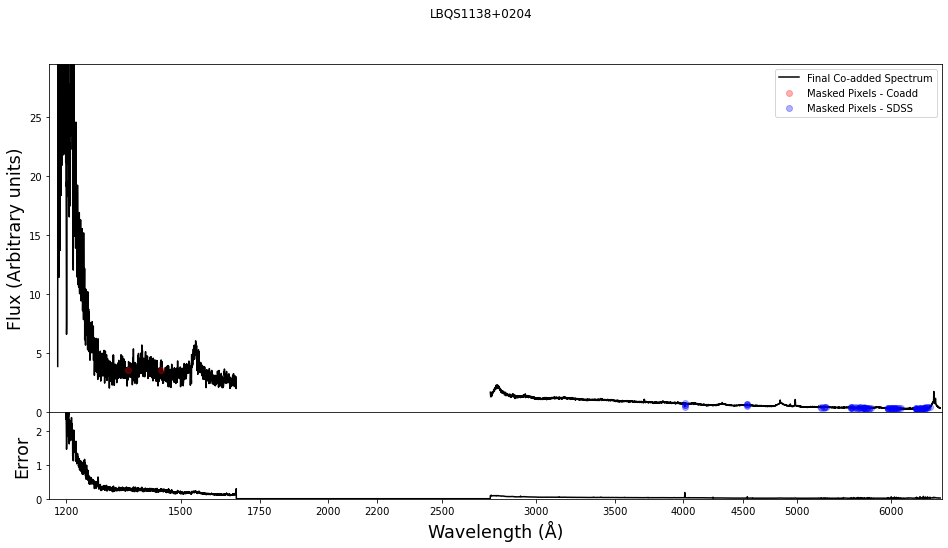

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


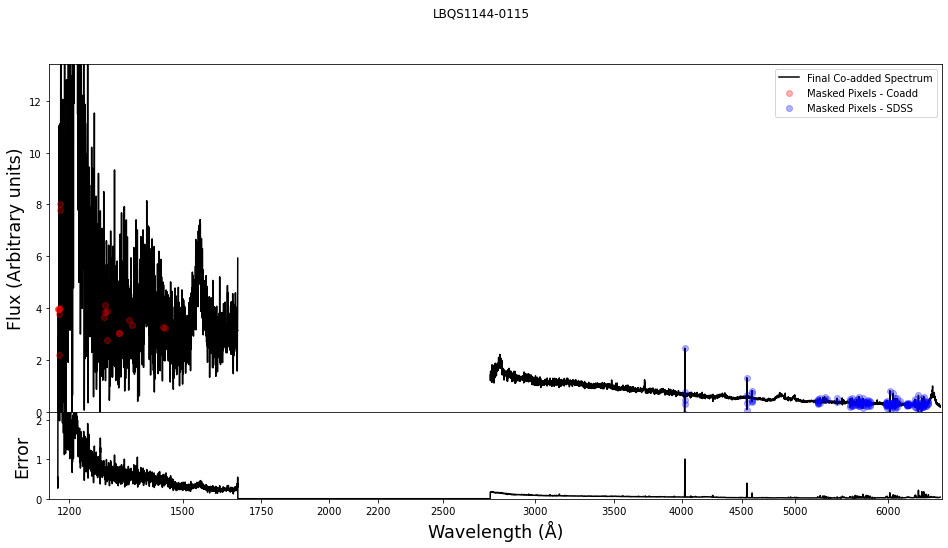

/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:182: RuntimeWarning: divide by zero encountered in true_divide
  new_weights = 1 / (new_errs**2.)


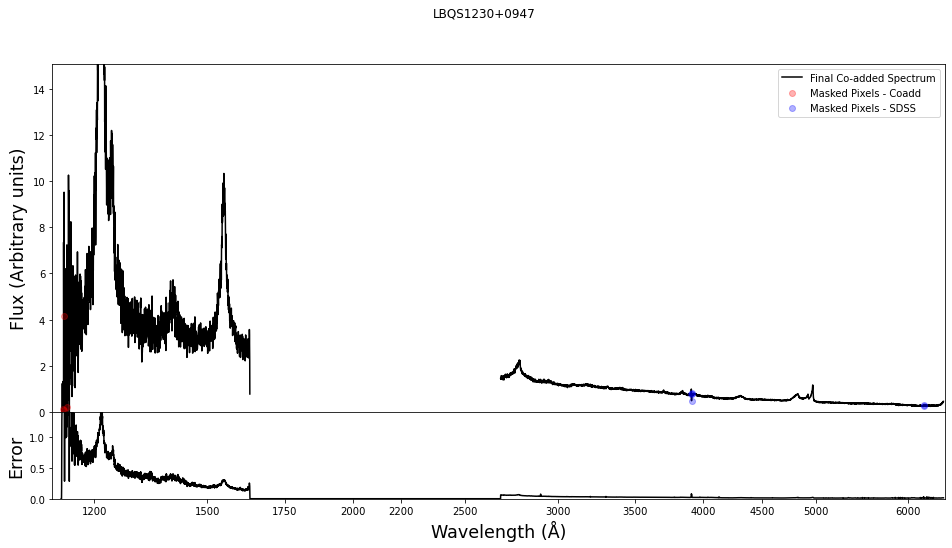

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


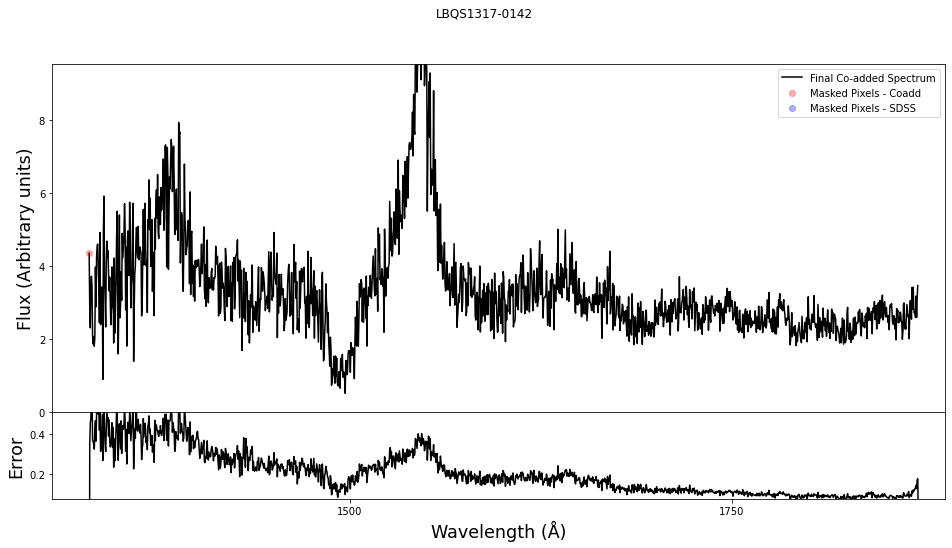

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


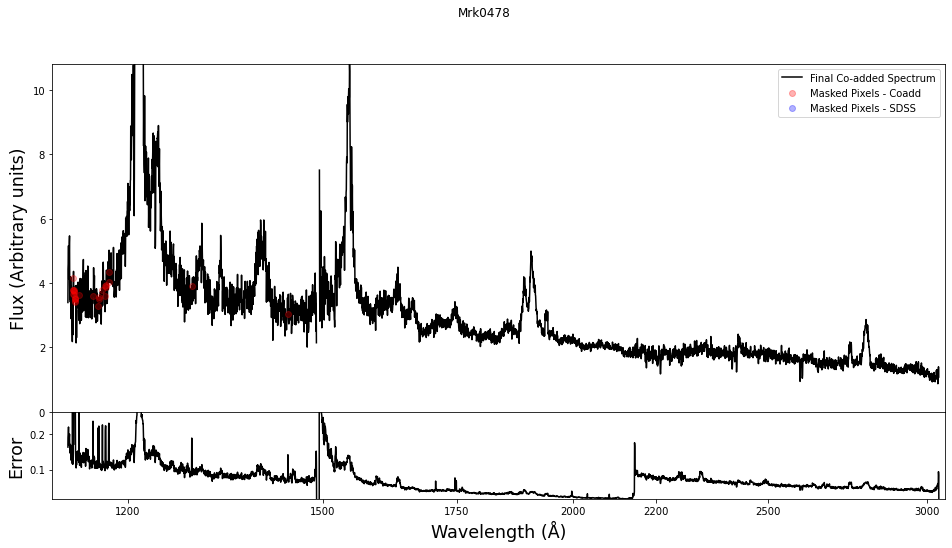

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/LowerResHSTRebin_TVM.py:103: RuntimeWarning: invalid value encountered in sqrt
  fluxerr_HST_rebin[i] = (m_err*wave_HST_rebin[i] + b_err) * np.sqrt(old_width/new_width)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


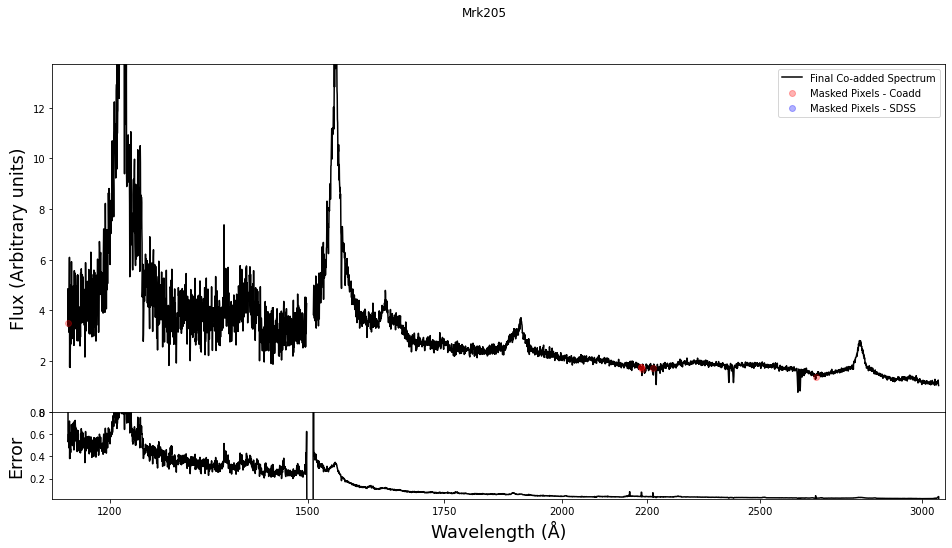

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


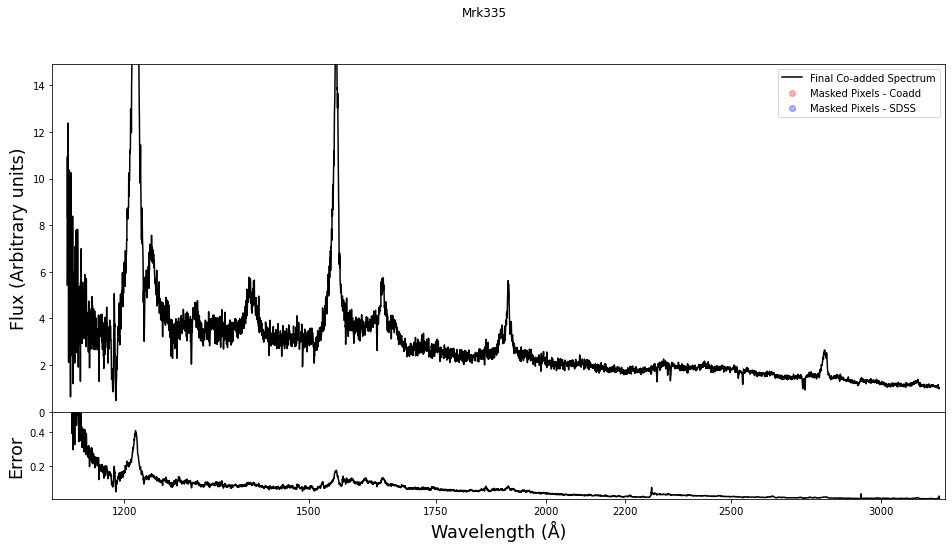

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


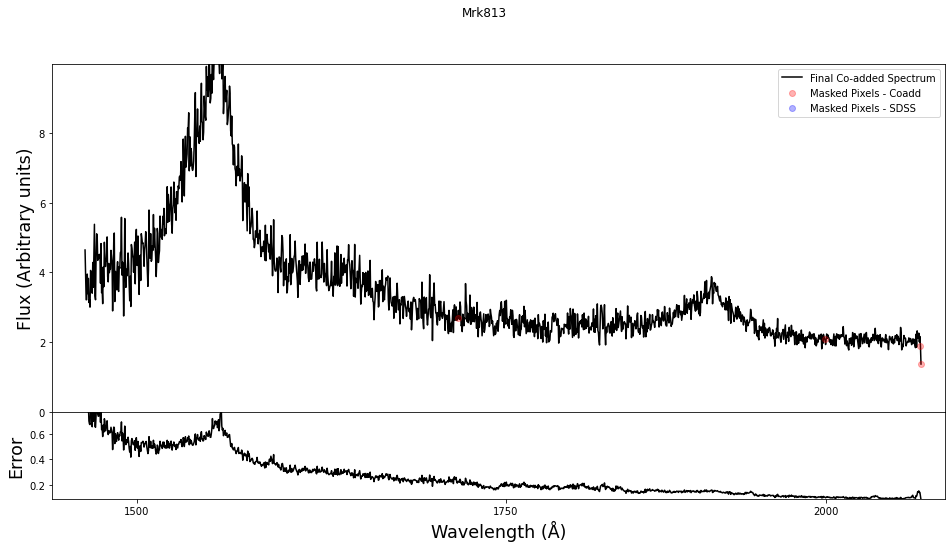

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


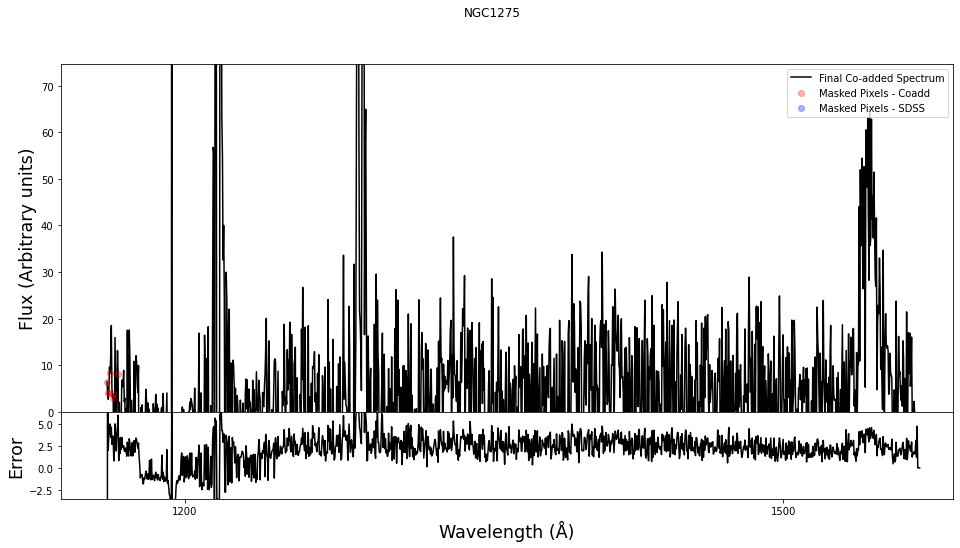

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


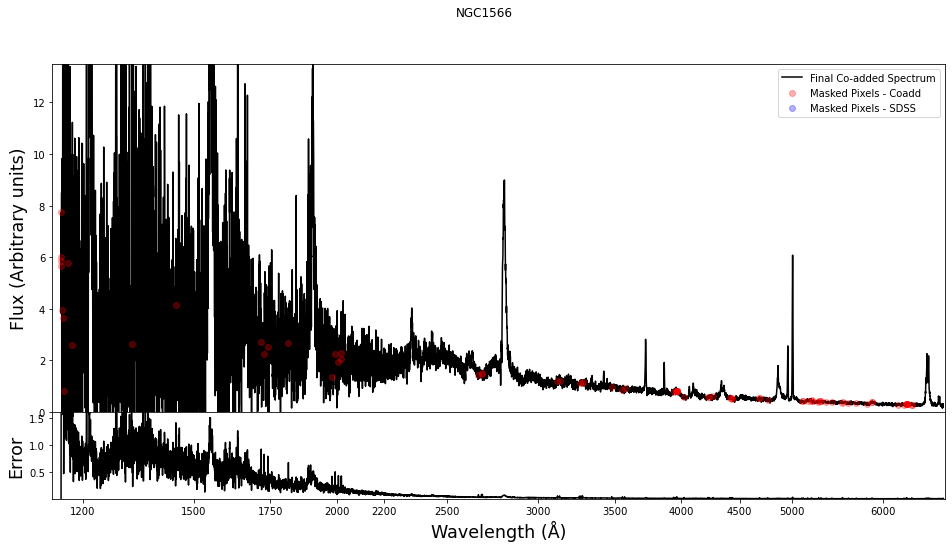

/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


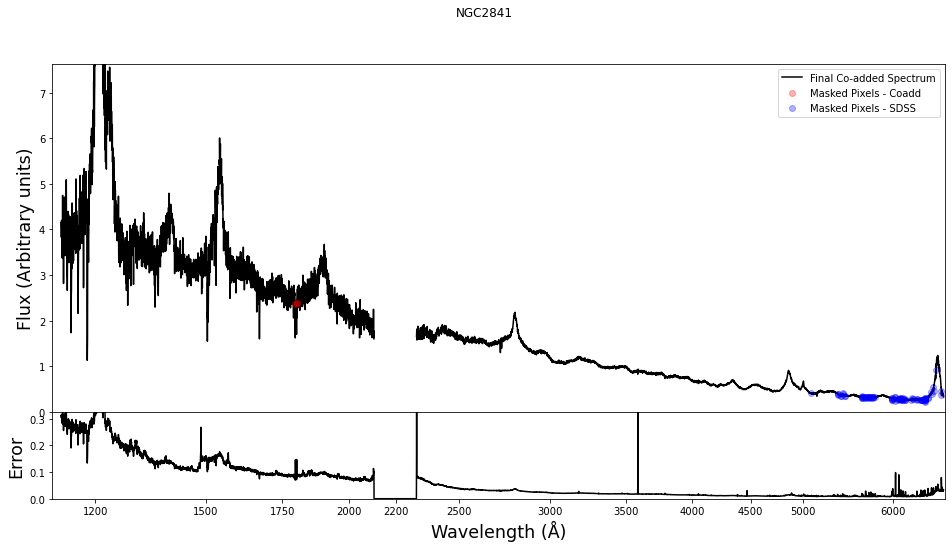

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


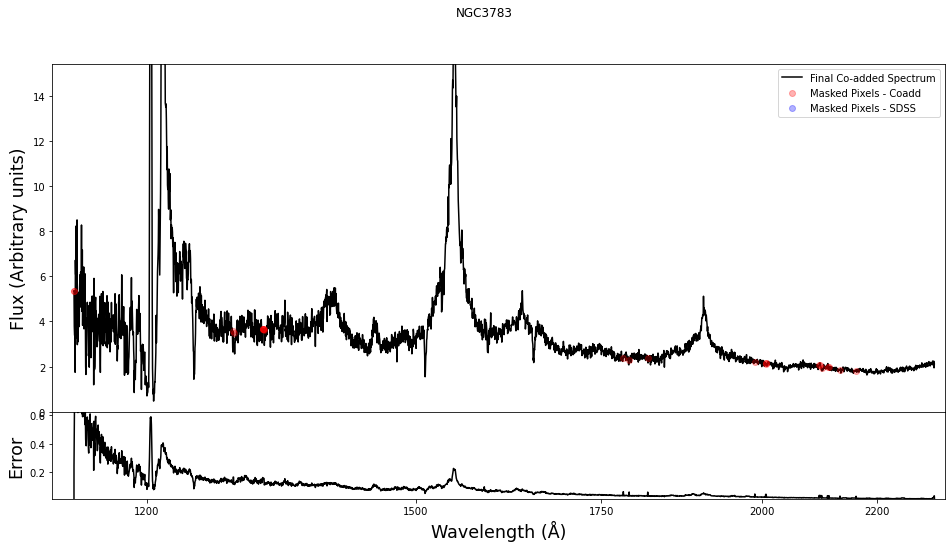

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


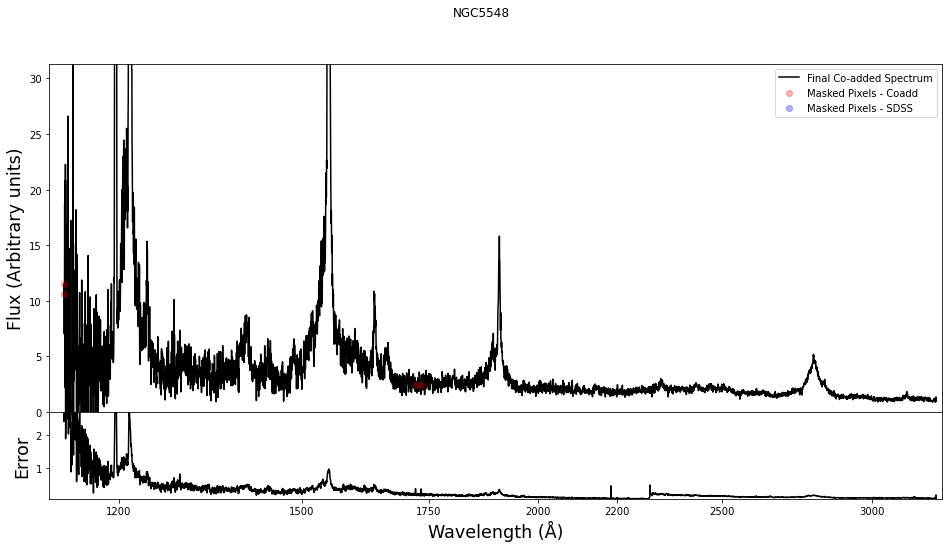

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


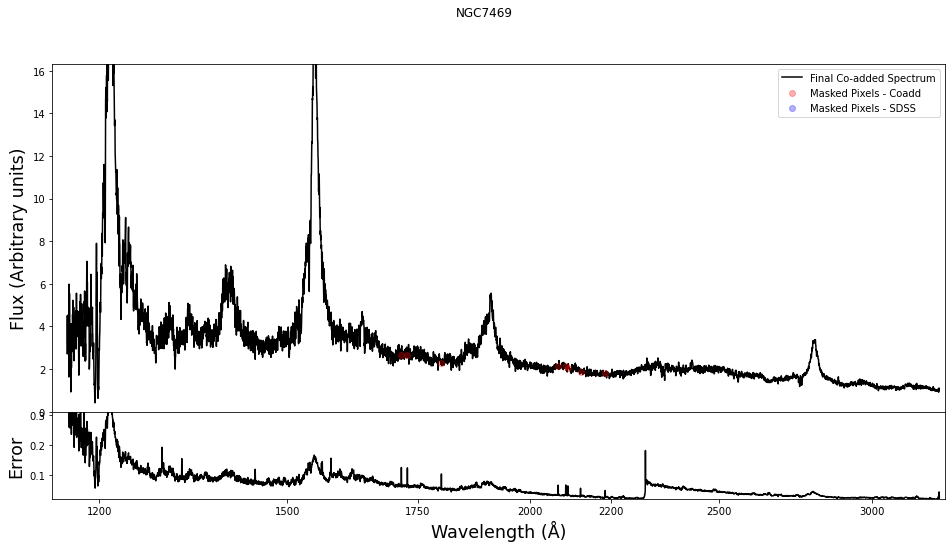

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


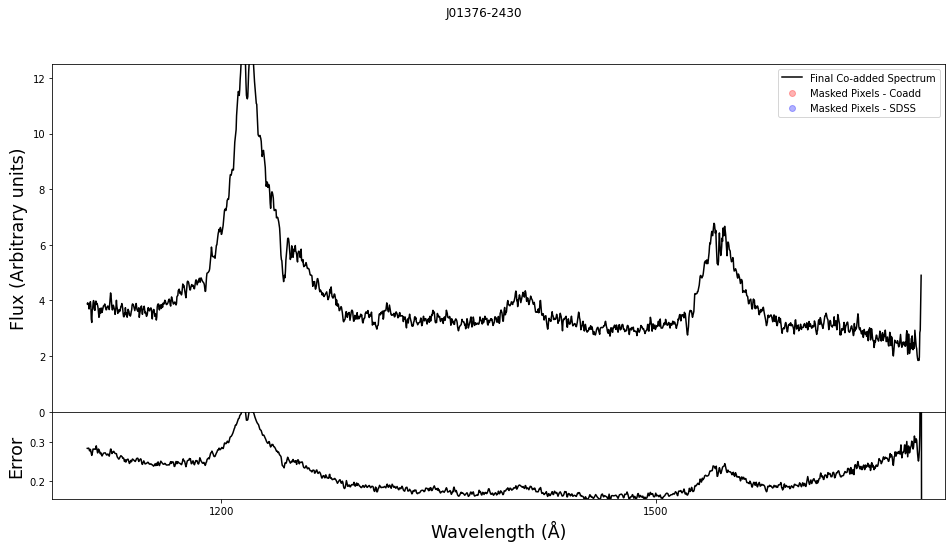

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


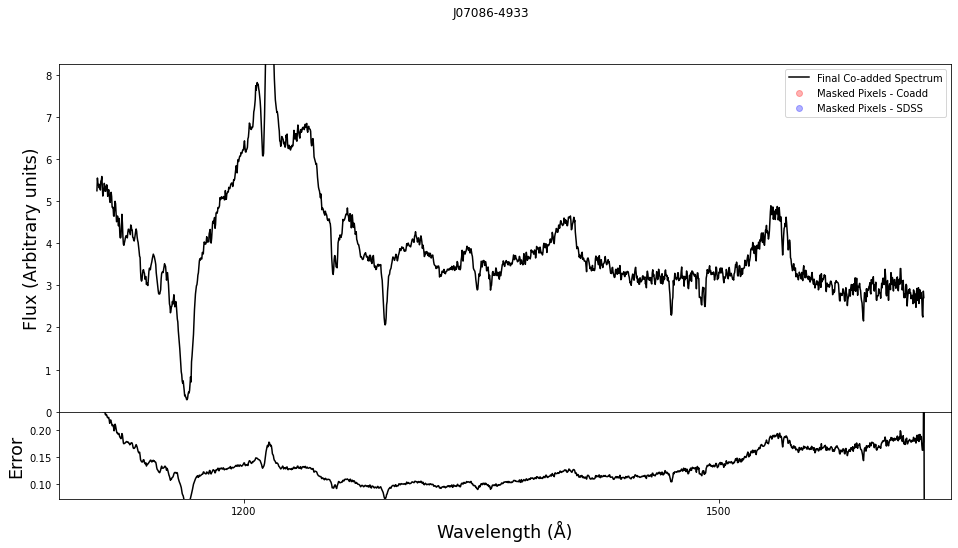

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


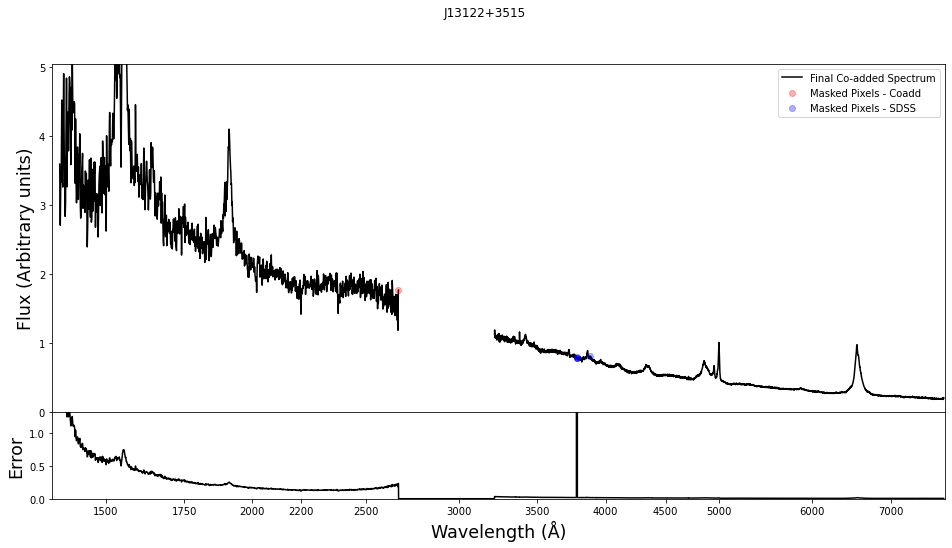

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


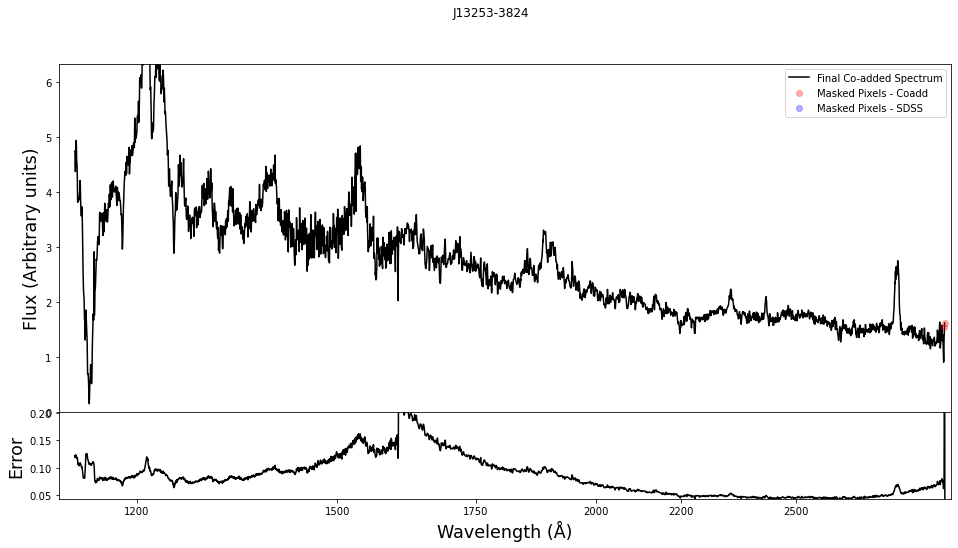

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


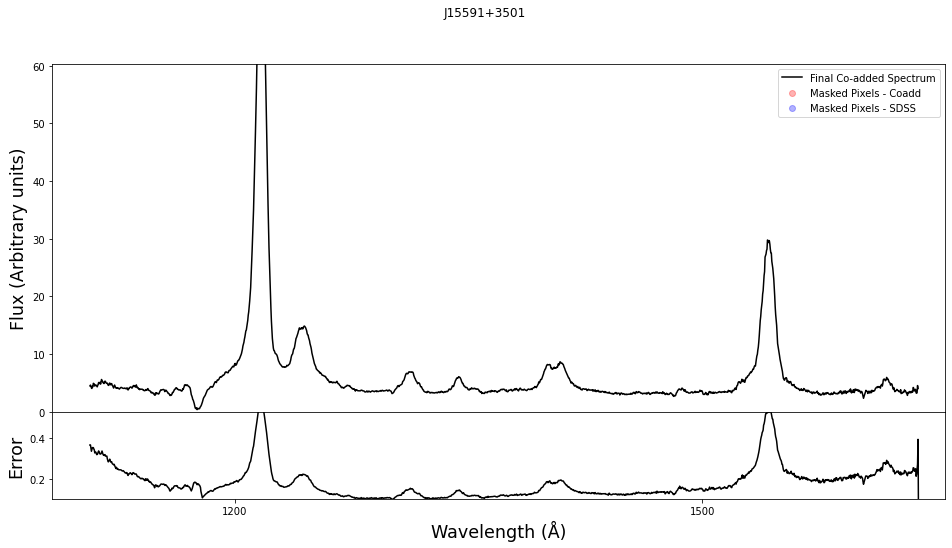

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


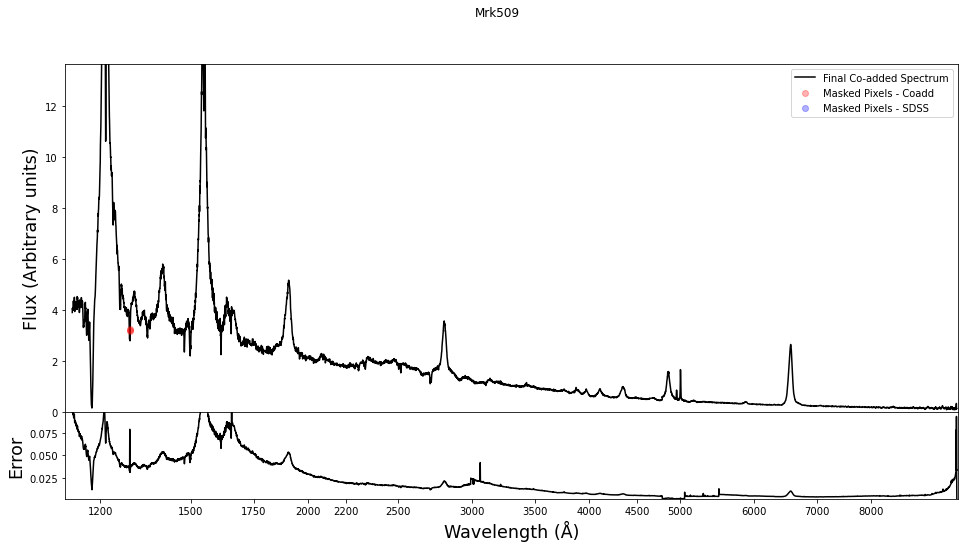

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


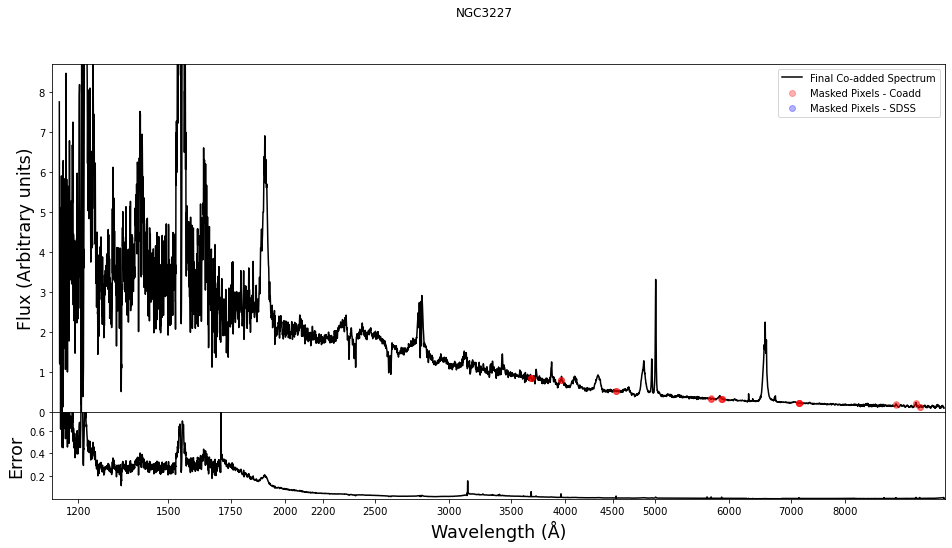

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


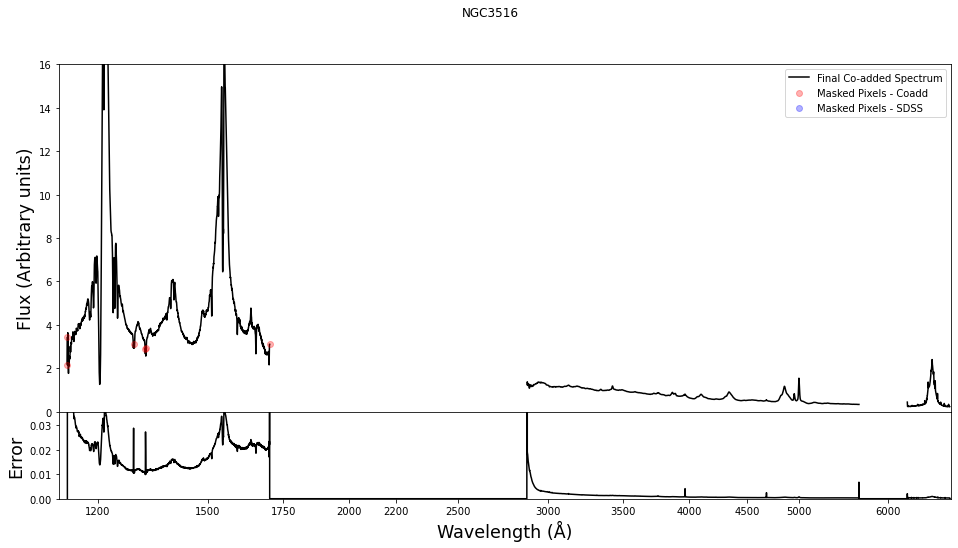

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


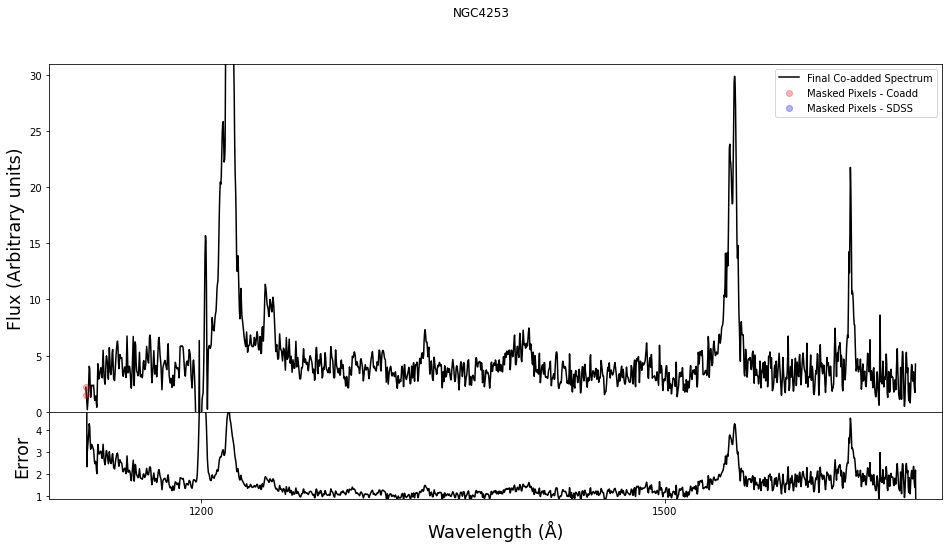

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


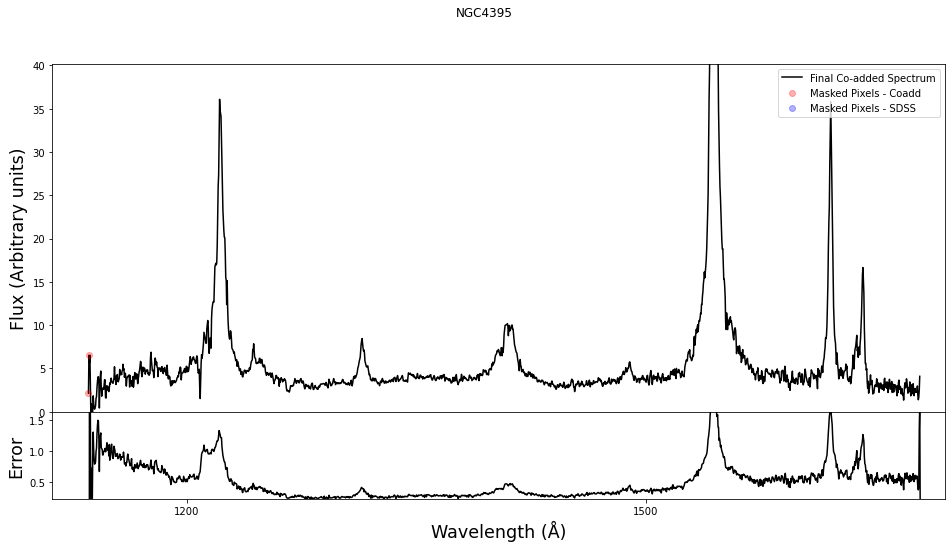

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


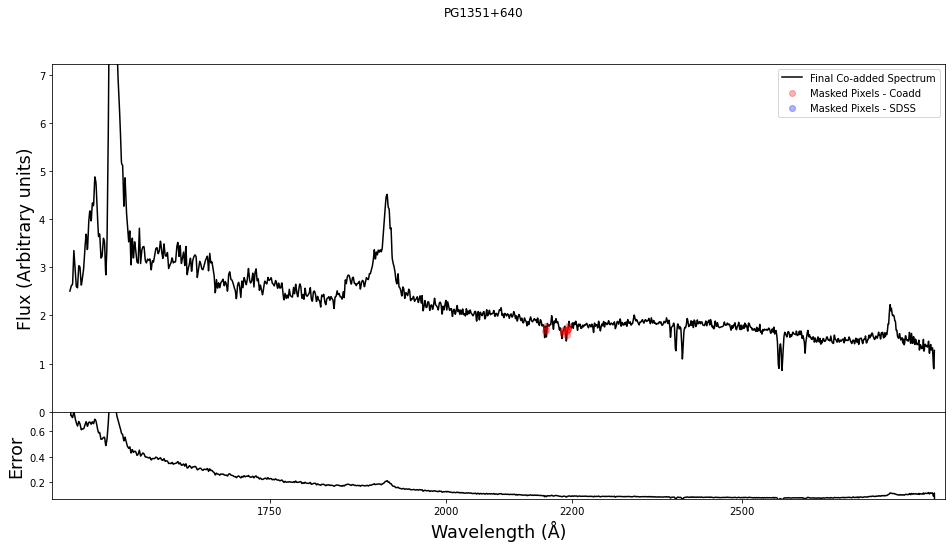

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


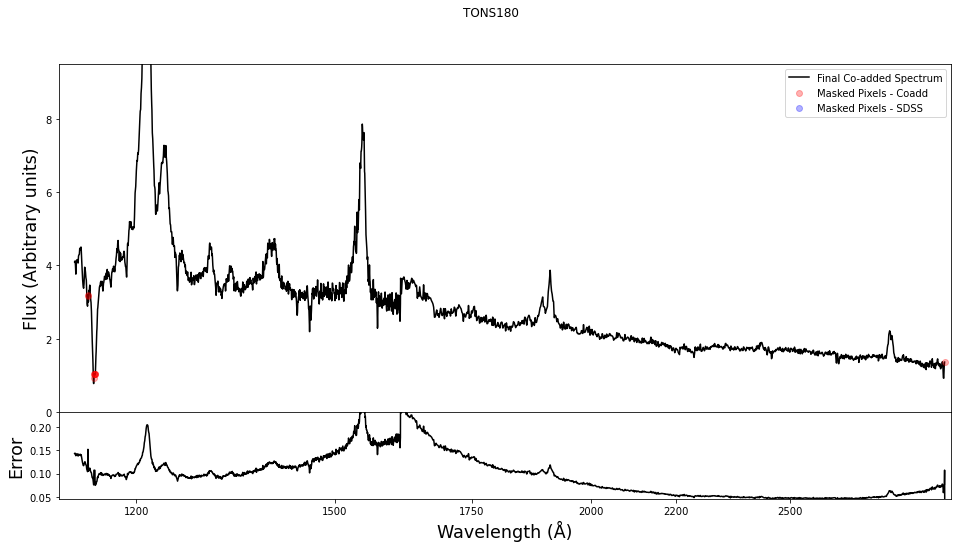

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


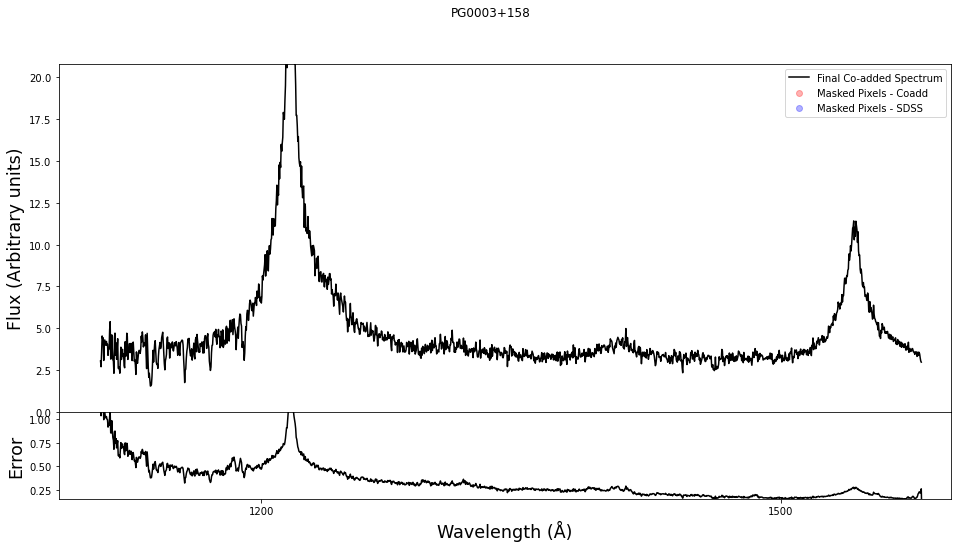

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


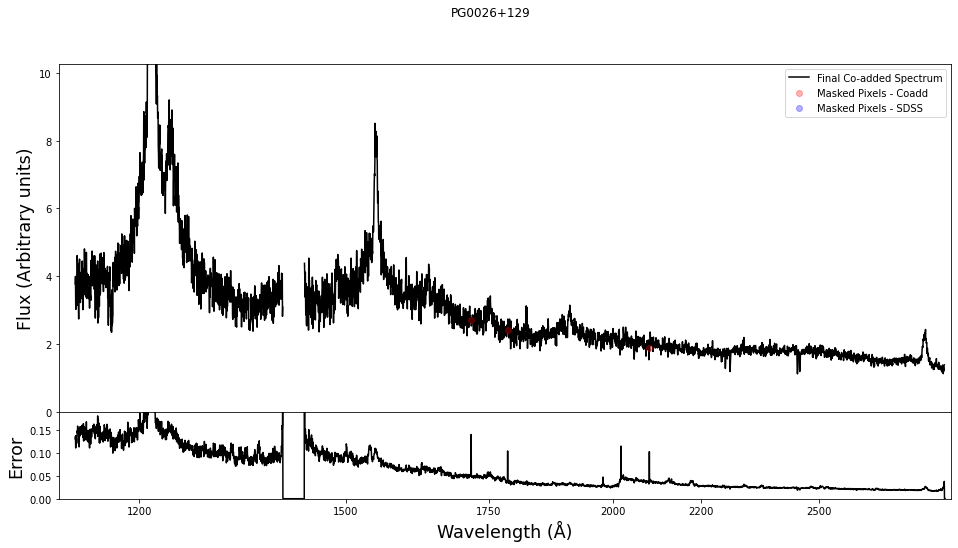

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


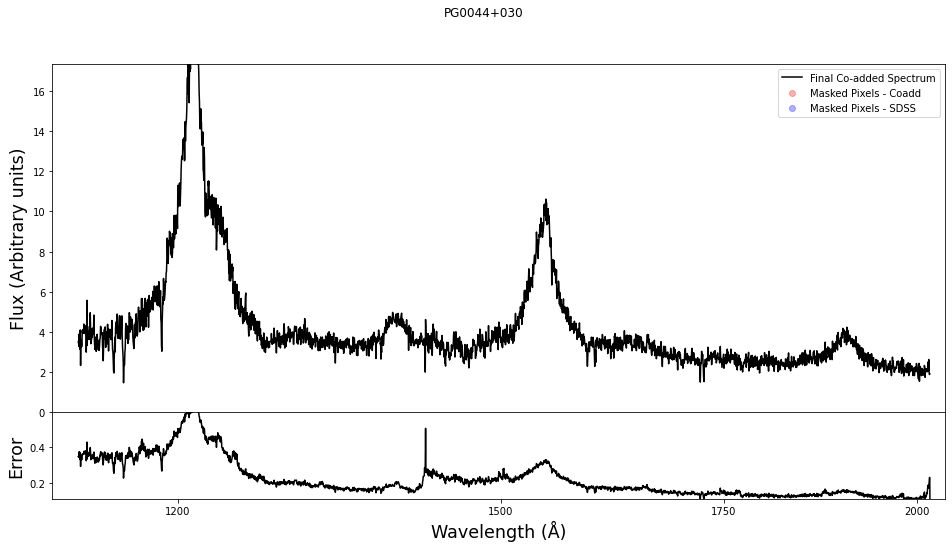

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


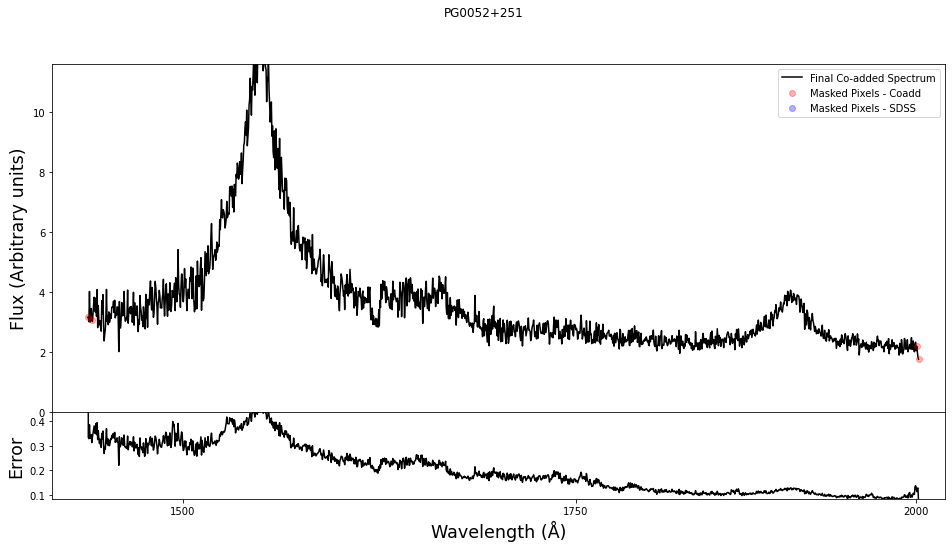

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:182: RuntimeWarning: divide by zero encountered in true_divide
  new_weights = 1 / (new_errs**2.)


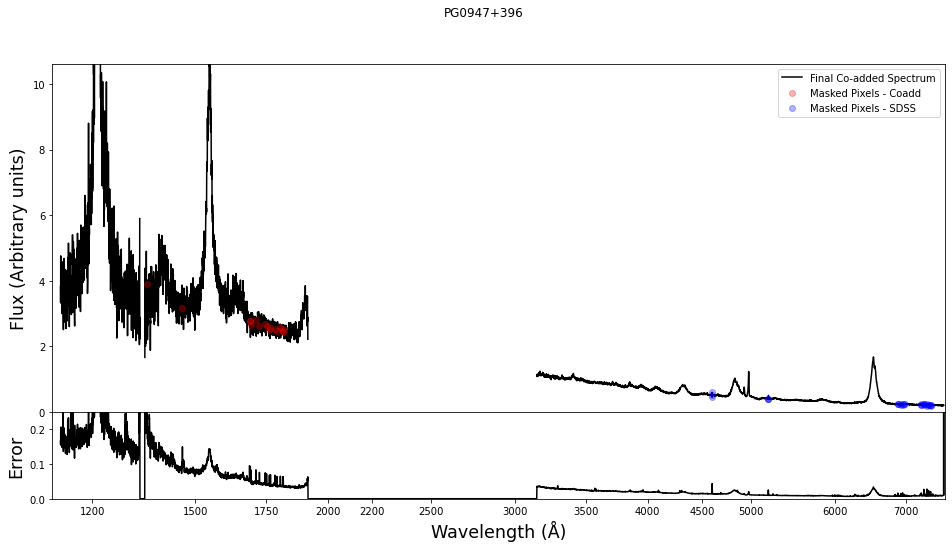

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/LowerResHSTRebin_TVM.py:103: RuntimeWarning: invalid value encountered in sqrt
  fluxerr_HST_rebin[i] = (m_err*wave_HST_rebin[i] + b_err) * np.sqrt(old_width/new_width)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


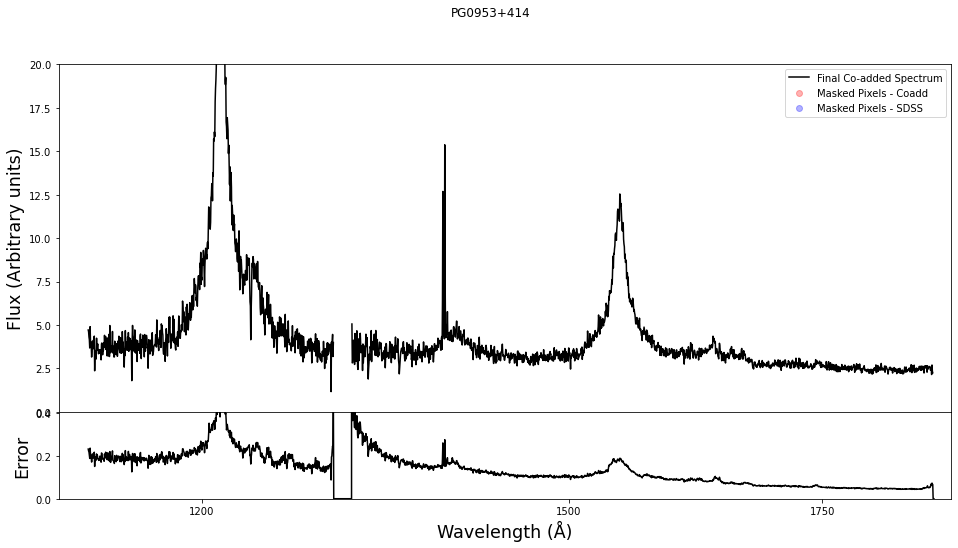

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


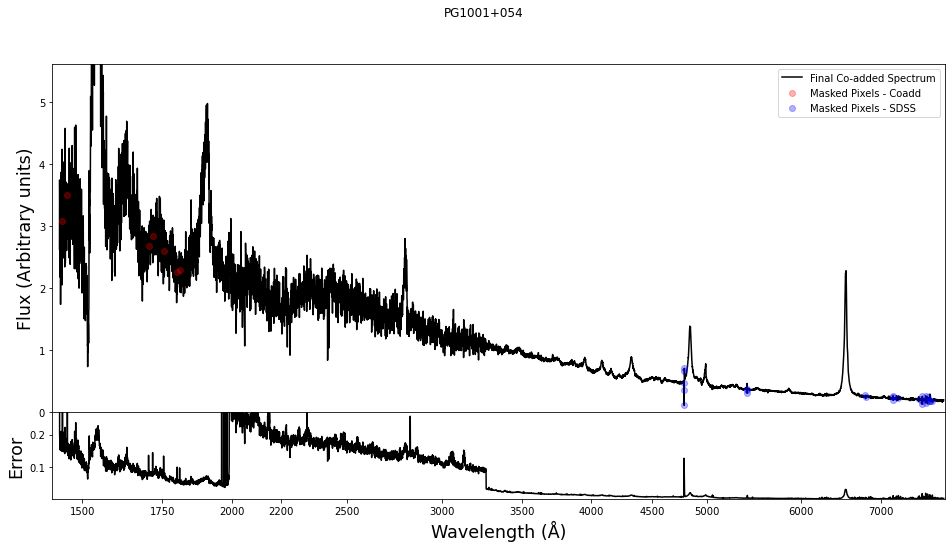

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


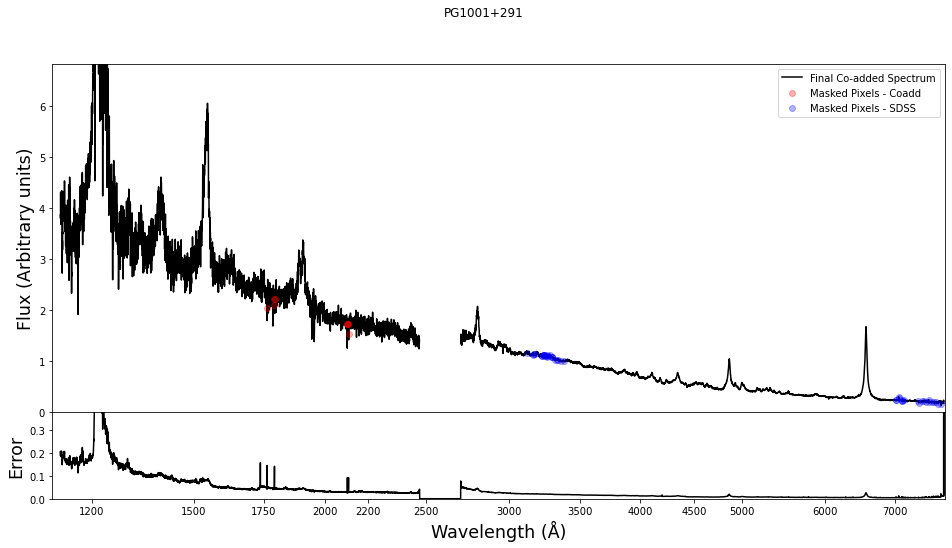

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


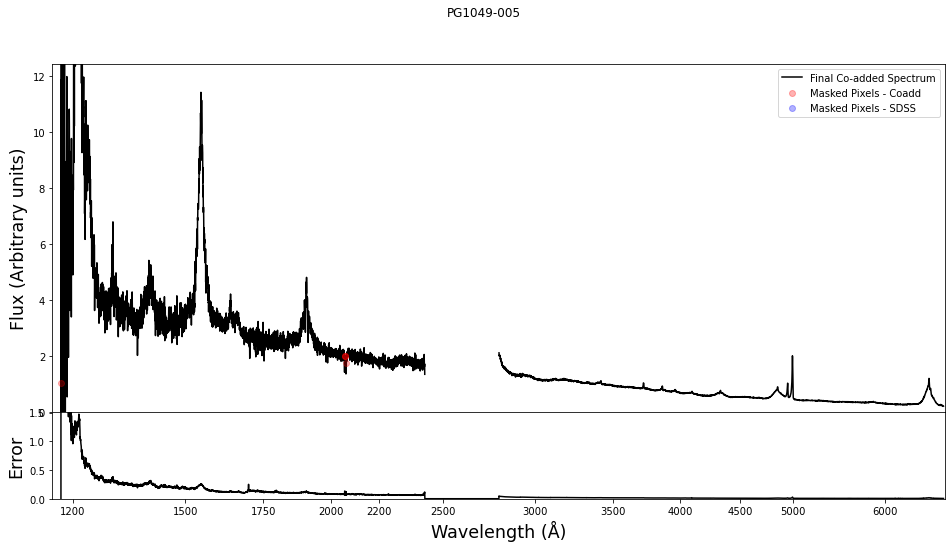

/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


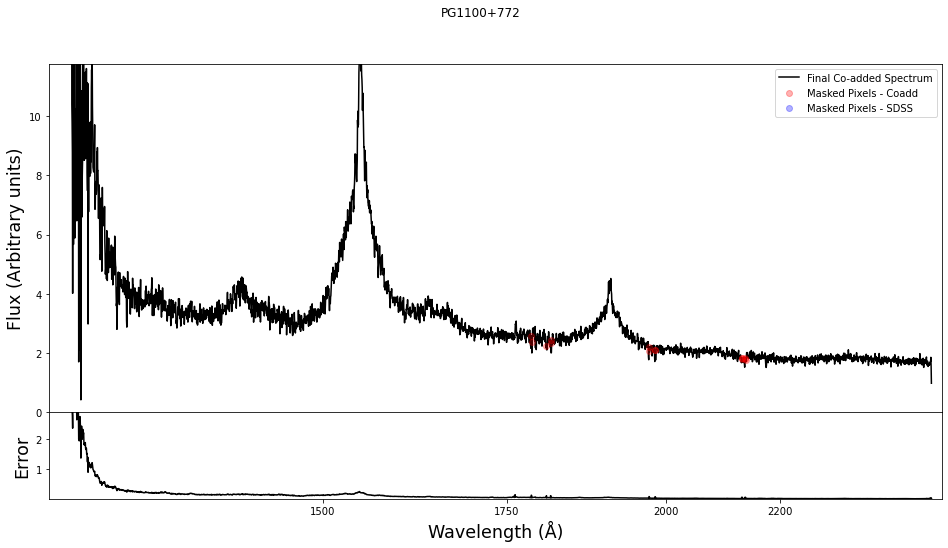

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


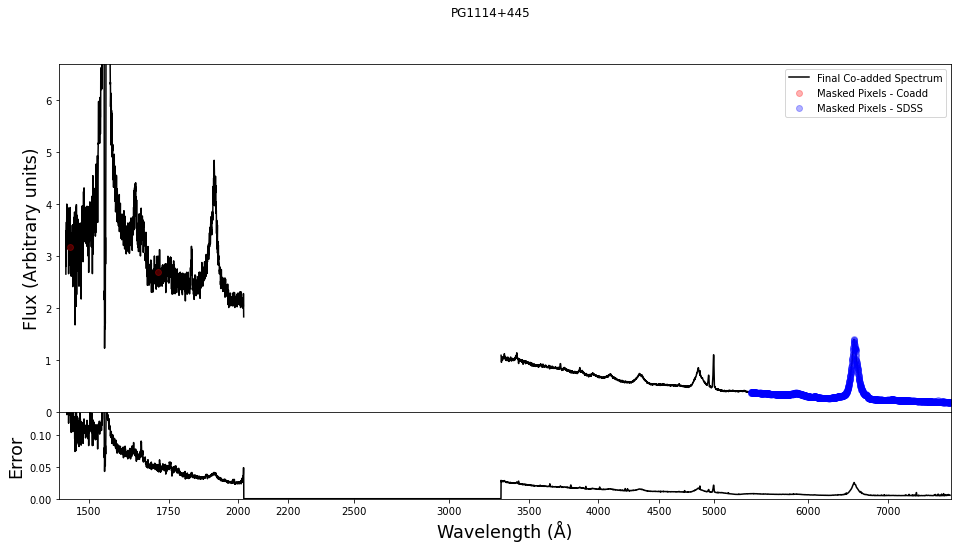

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


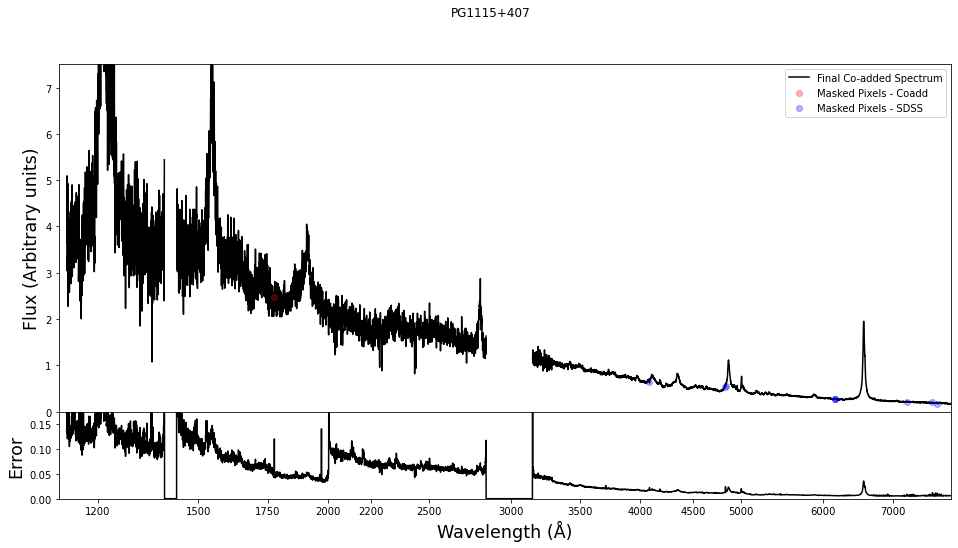

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


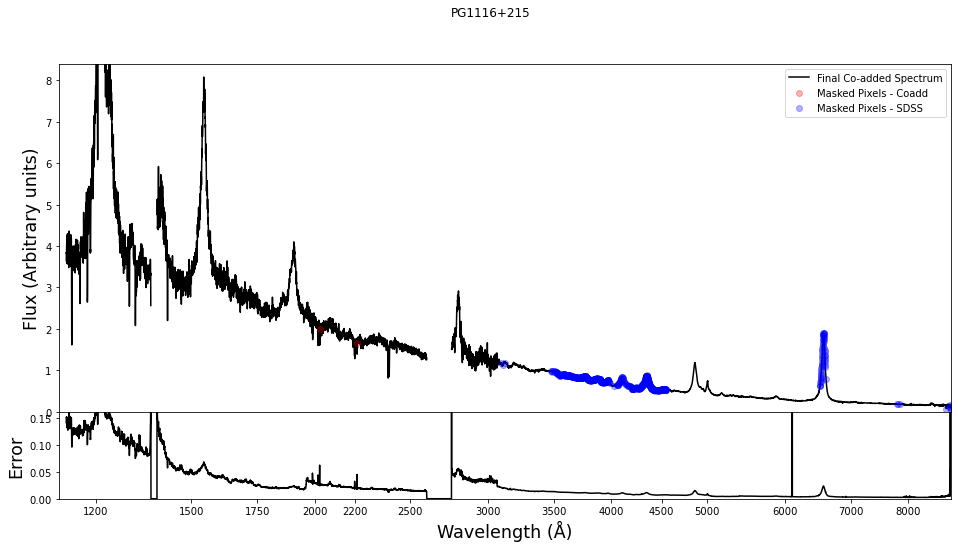

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


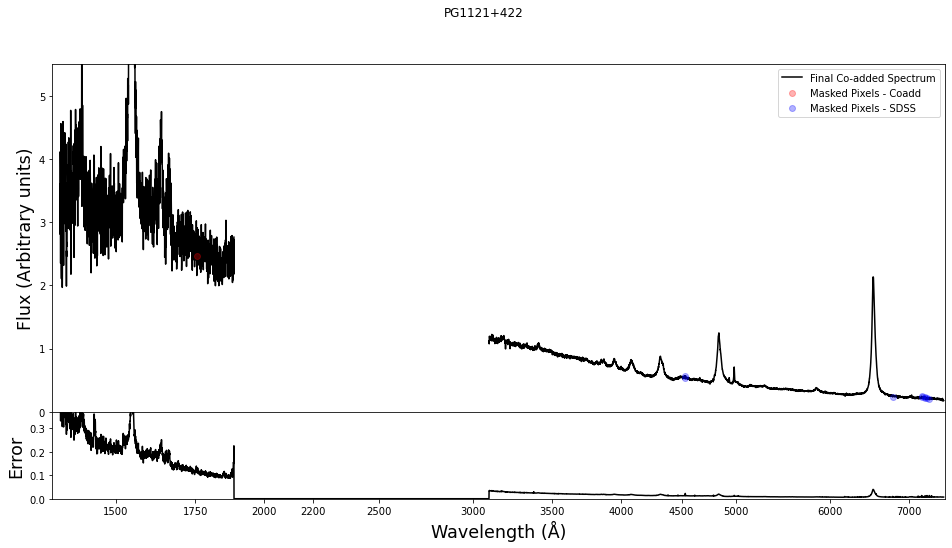

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


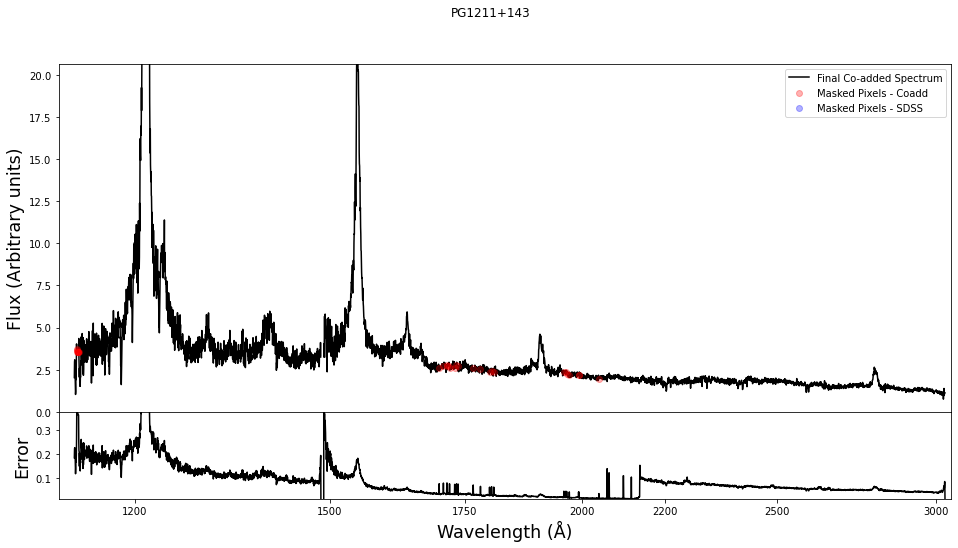

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


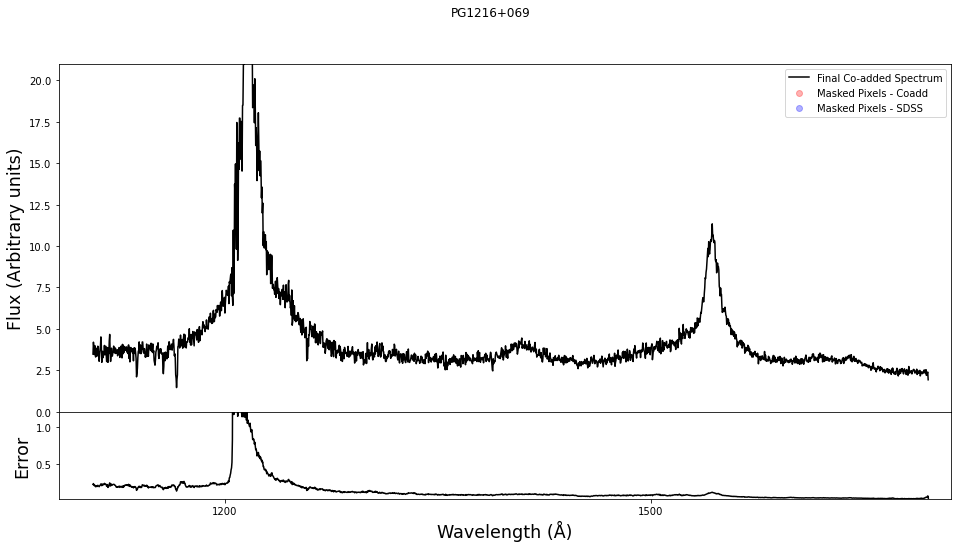

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


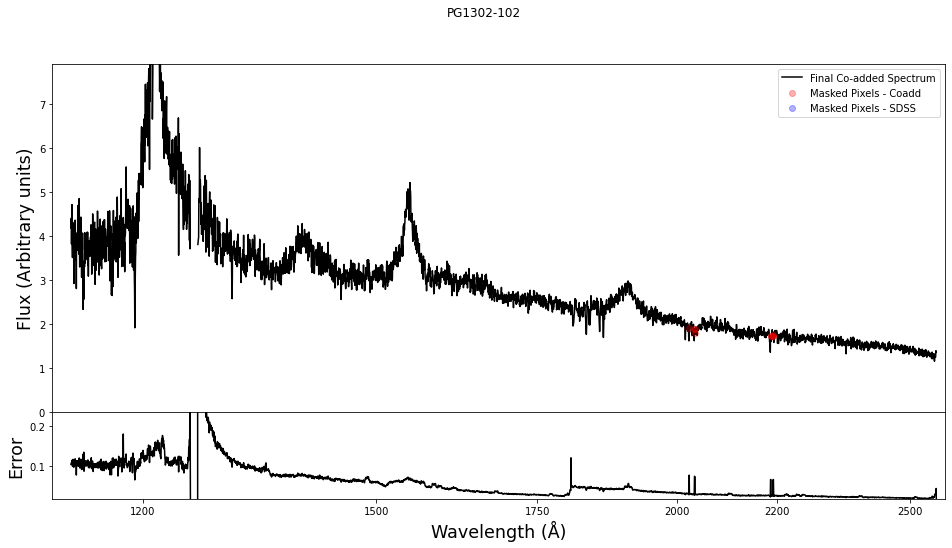

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


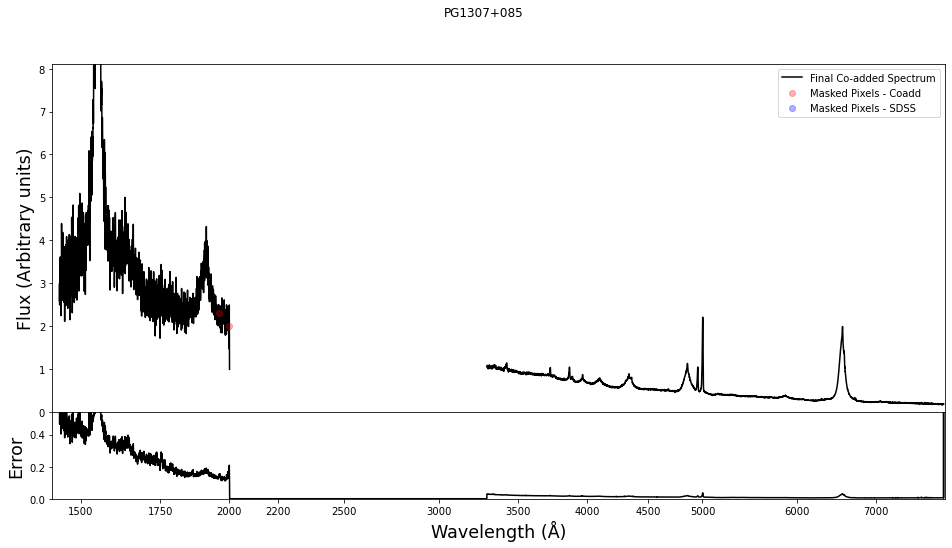

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


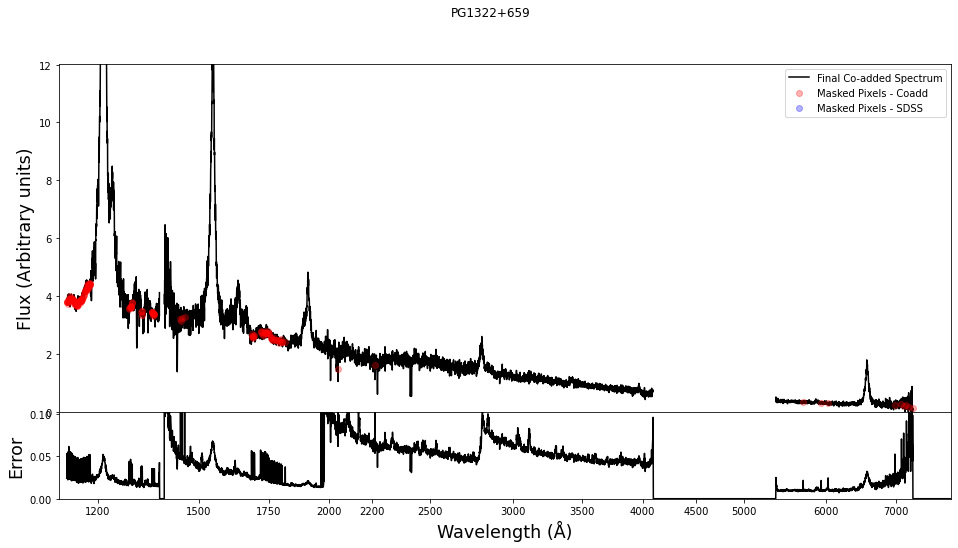

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


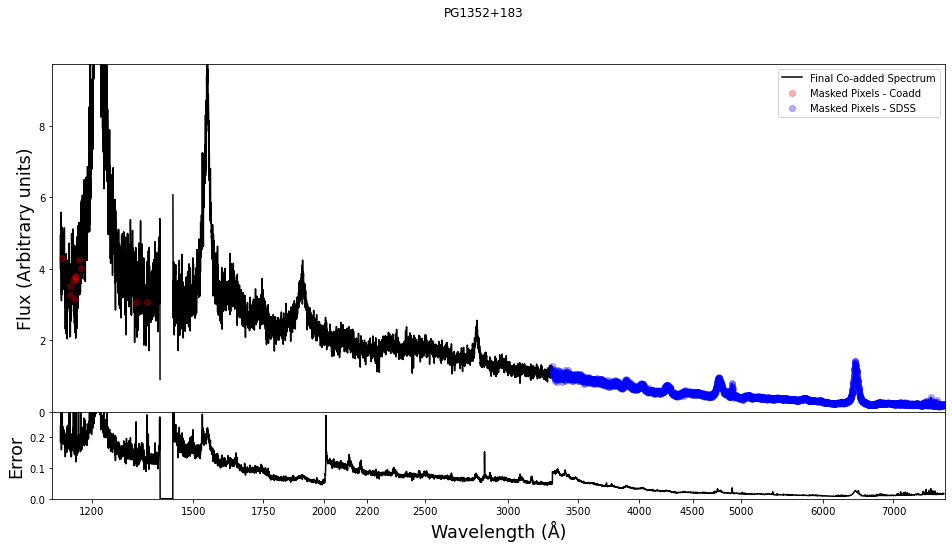

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


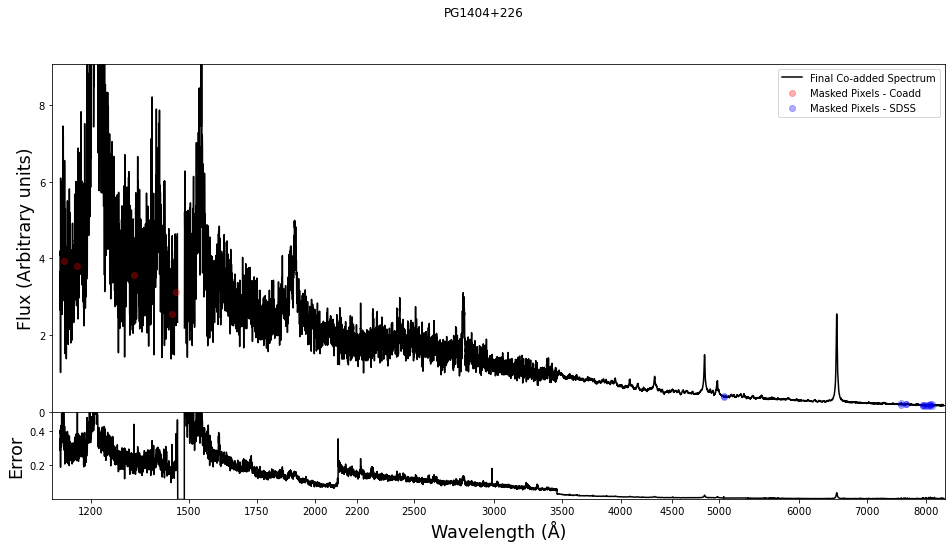

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


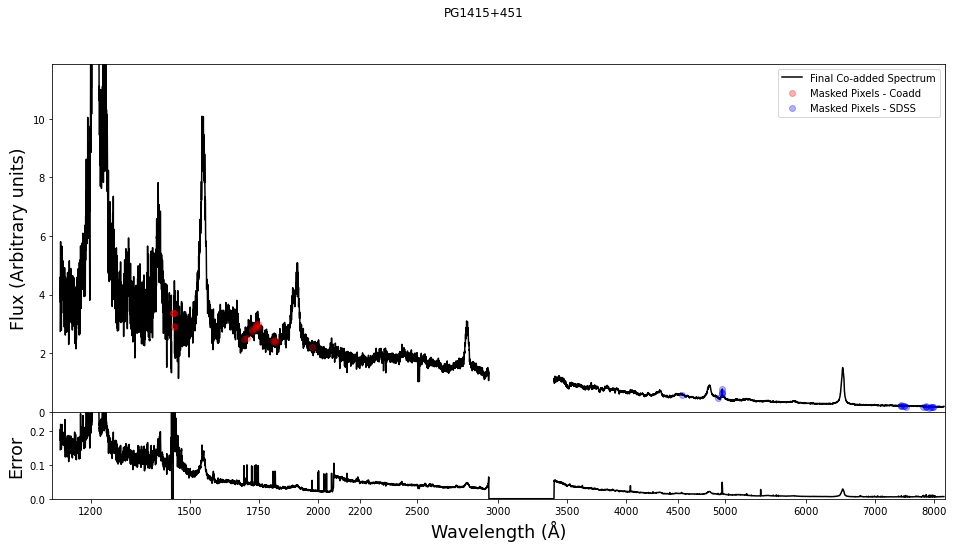

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


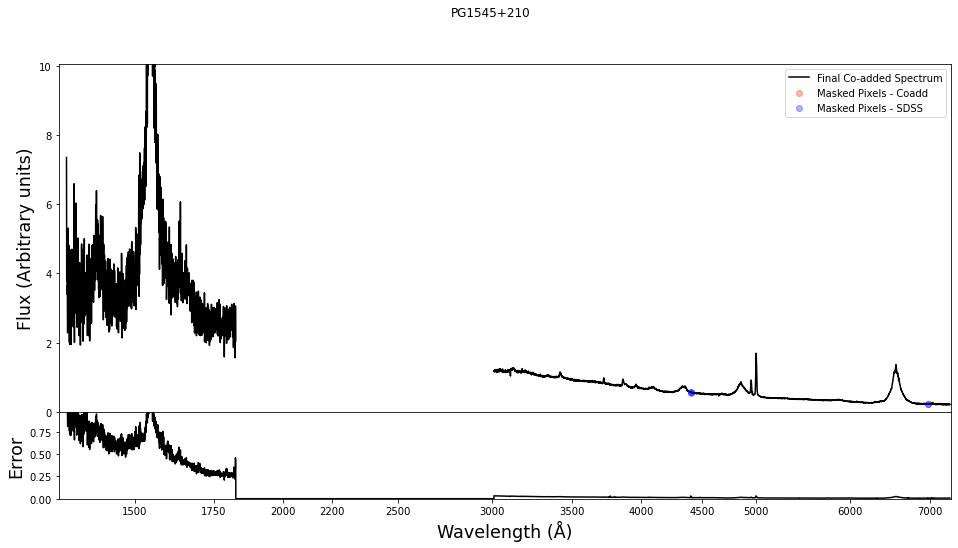

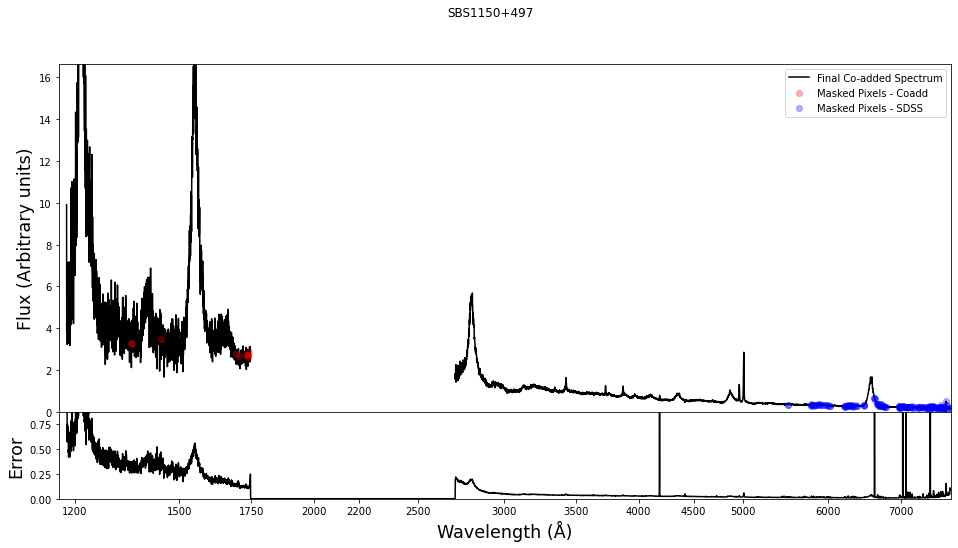

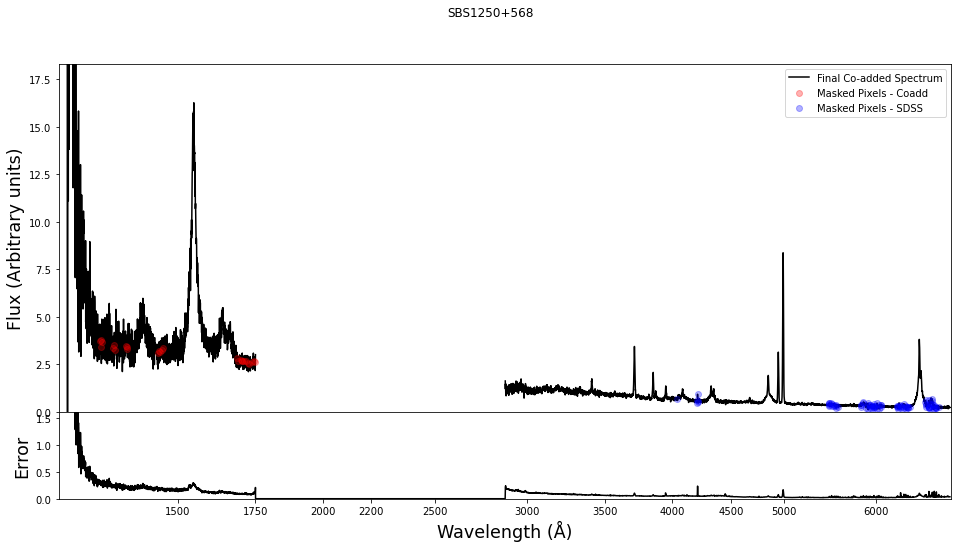

/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


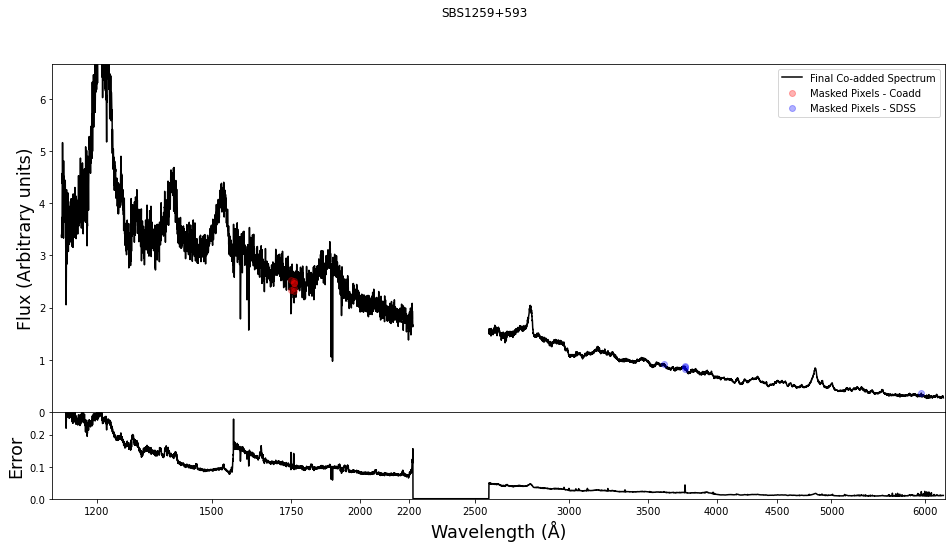

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


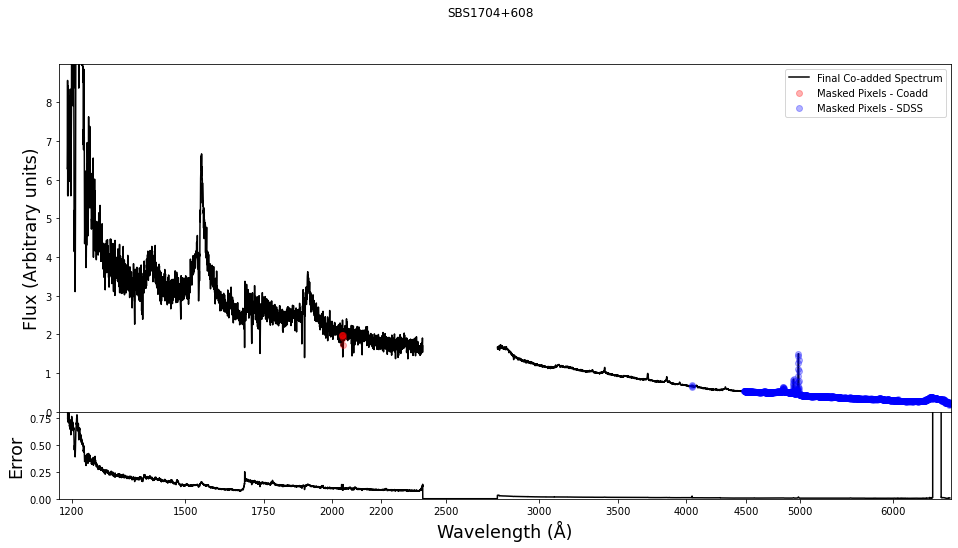

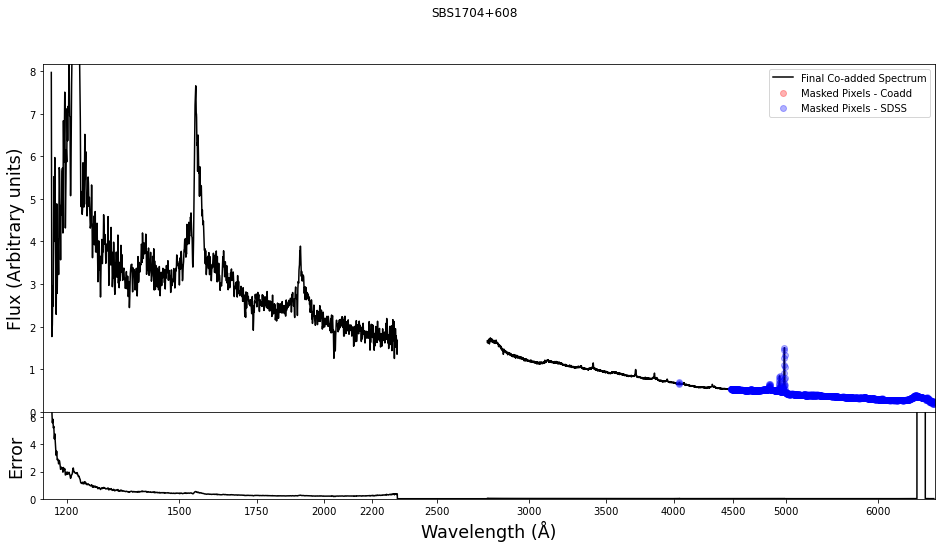

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


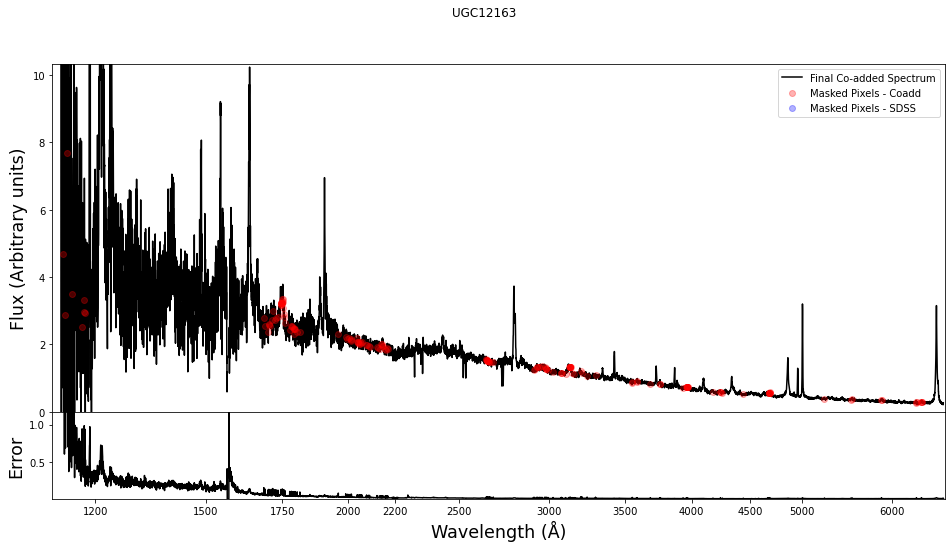

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)
/Users/trevormccaffrey/Dropbox/HST/HSTCode/HST_coadd2.py:161: RuntimeWarning: divide by zero encountered in true_divide
  my_weights[:,i] = 1 / old_binned_errs[:,i]**2.  #should be inverse here - otherwise noisier spectra contribute more


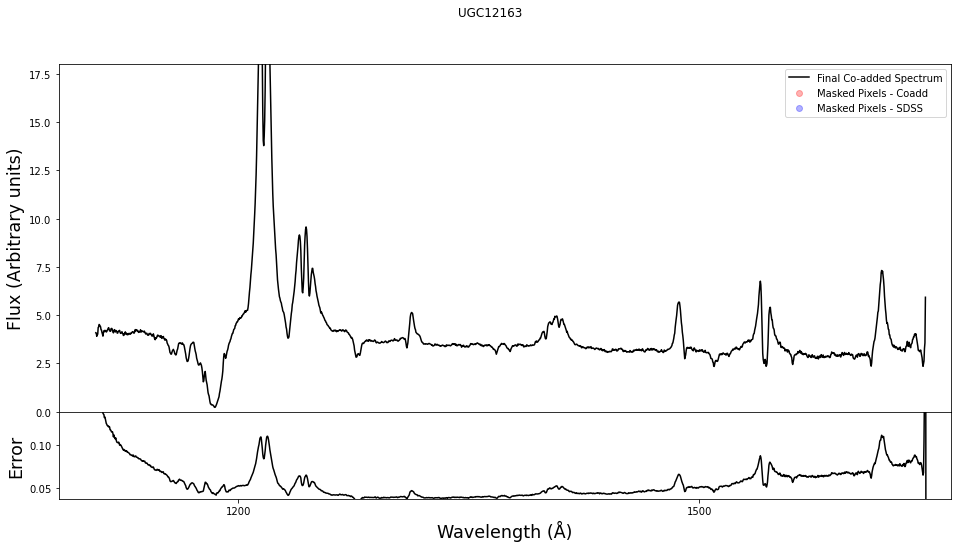

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


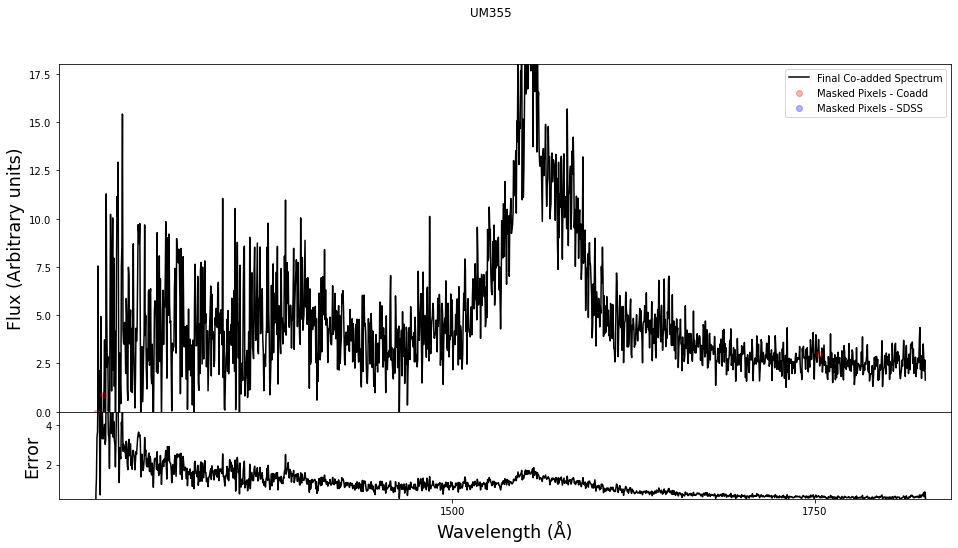

In [19]:
for i in range(len(sul)):
#for i in ind:
    if sdss[i]: fn_sdss = "%04d/spec-%04d-%05d-%04d.fits"%(plate[i],plate[i],mjd[i],fiber[i])
    else: fn_sdss = None
    try:
        if id_fos[i]!="None":
            HST_coadd2.rebin(id_fos[i], z[i], "FOS", fn_sdss, "/Users/trevormccaffrey/Dropbox/HST/Sulentic_spectra/SulenticAllData/FOS/")
        if id_stis[i]!="None":
            HST_coadd2.rebin(id_stis[i], z[i], "STIS", fn_sdss, "/Users/trevormccaffrey/Dropbox/HST/Sulentic_spectra/SulenticAllData/STIS/")
        #if id_cos[i]!="None":
        #    HST_coadd2.rebin(id_cos[i], z[i], "COS", fn_sdss, "/Users/trevormccaffrey/Dropbox/HST/Sulentic_spectra/SulenticAllData/COS/")
    #except IndexError:
    #    print("Index Error")
    except KeyError:
        print("Key - Short Exposure?")
    except TypeError:
        print("Type - No windows covered?")
    #except IndexError:
    #    print("Index")

In [20]:
np.flip(np.arange(4,0,-1))

array([1, 2, 3, 4])

In [21]:
id_stis[i]

'None'

In [22]:
sdss[0]

False

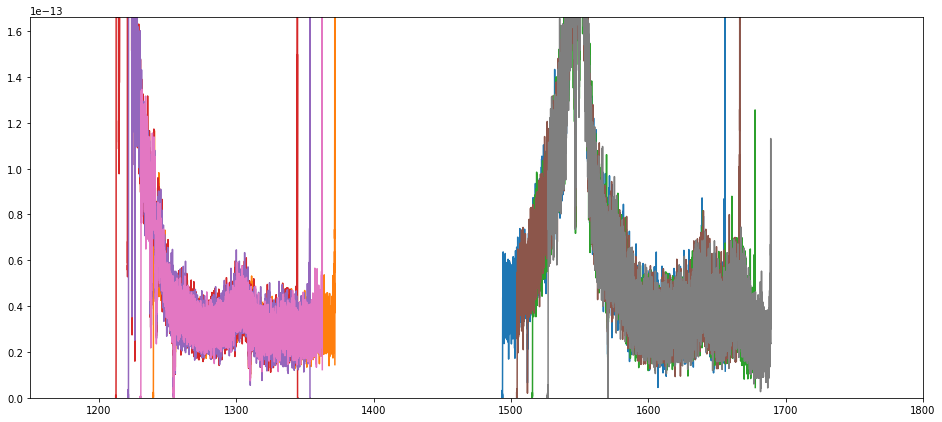

/Users/trevormccaffrey/anaconda3/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1114: RuntimeWarning: All-NaN slice encountered
  overwrite_input=overwrite_input)


TypeError: morph2() got an unexpected keyword argument 'return_markers'

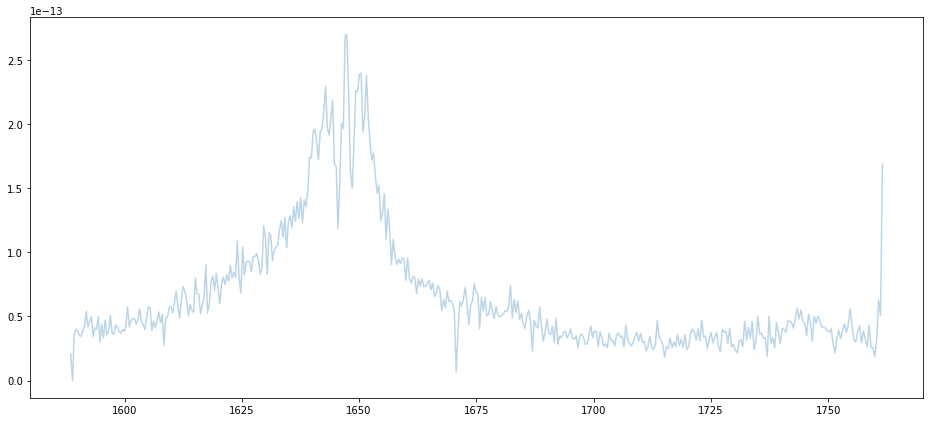

In [23]:
ID = sul.iloc[id_cos=="MR2251-178"]
fn_sdss = None if isNaN(ID["SDSS_NAME"].values[0]) else "%04d/spec-%04d-%05d-%04d.fits"%(ID["PLATE"].values[0],ID["PLATE"].values[0],ID["MJD"].values[0],ID["FIBERID"].values[0])

HST_coadd.rebin(ID["COS_Name"].values[0], ID["z"].values[0], "COS", fn_sdss, \
                data_path="/Users/trevormccaffrey/Dropbox/HST/Sulentic_spectra/SulenticAllData/COS/")
print("Good: %s" % ID["COS_Name"].values[0])
"""
try:
    Read_COS_TVM.rebin(ID["COS_Name"].values[0], fn_sdss, ID["z"].values[0])
    print("Good: %s" % ID["COS_Name"].values[0])
except IndexError:
    print("Index Error: %s" % ID["COS_Name"].values[0])
    #except ValueError:
    #    print("%s doesn't work"%ID["COS_Name"].values[0])
except ValueError:
    print("Index Error: %s" % ID["COS_Name"].values[0])
"""
_=0

In [ ]:
import weightedstats as ws

In [ ]:
import numpy as np

In [ ]:
print(ws.numpy_weighted_median([0,3,7,9], weights=[0,0,0,1]))

In [ ]:
ws.numpy_weighted_median??